Main plotting script for Bushinsky et al. 2024 submission to GBC: "Offset between profiling float and shipboard oxygen observations at depth imparts bias on float pH and derived pCO2"


In [2]:
import numpy as np
import pandas as pd
import xarray as xr
import glob, os
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import cartopy.feature as cfeature
# from datetime import datetime, date, time
# import time
from scipy import stats
import functions.carbon_utils as carbon_utils 
import PyCO2SYS as pyco2
from scipy import interpolate
from tabulate import tabulate
# import re
import matplotlib.gridspec as gridspec
import functions.pH_NO3_DIC_pCO2_impact_calcs as derived_functions
import docx
from tqdm import tqdm

### Set directories and filenames

In [3]:
plot_ver = '_vR1'
# glodap_offsets_filename = 'glodap_offsets_100km_1450_to_2000_100m_0.005dens_0.005spice_4.nc'
# glodap_mean_offsets_filename = \
#     'glodap_offsets_100km_1450_to_2000_100m_0.005dens_0.005spice_4_floatmean_withcalibration.nc'

# glodap_offsets_filename = 'glodap_offsets_100km_1_to_50_50m_0.1dens_0.1spice_5.nc'
# glodap_mean_offsets_filename = glodap_offsets_filename[:-3] + '_floatmean_withcalibration.nc'

base_file_name = '100km_1400_to_2100_100m_0.005dens_0.005spice_ESPER_13'

code_ver = base_file_name[-3:]
print(code_ver)
# glodap_offsets_filename = 'glodap_offsets_100km_1400_to_2100_100m_0.005dens_0.005spice_ESPER_10_all_offsets_depth_grouped_year_filt_0_5_level_1500.nc'
# glodap_mean_offsets_filename = 'glodap_offsets_100km_1400_to_2100_100m_0.005dens_0.005spice_ESPER_10_floatmean_withcalibration_depth_grouped_year_filt_0_5_level_1500.nc'

glodap_offsets_filename = 'glodap_offsets_' + base_file_name + '_all_offsets_depth_grouped_year_filt_0_5_level_1500.nc'
glodap_mean_offsets_filename = 'glodap_offsets_' + base_file_name + '_floatmean_withcalibration_depth_grouped_year_filt_0_5_level_1500.nc'
# read in a user-created text file to point to local directories to avoid having to change this every time 
# we update code

lines=[]
with open('path_file.txt') as f:
    lines = f.readlines()
    
count = 0
for line in lines:
    count += 1
    index = line.find("=")
    #print(f'line {count}: {line}')
    #print(index)
    #print(line[0:index])
    line = line.rstrip()
    if line[0:index].find("argo")>=0:
        argo_path=line[index+1:]
    elif line[0:index].find("liar")>=0:
        liar_dir=line[index+1:]
    elif line[0:index].find("matlab")>=0:
        matlab_dir=line[index+1:]
        
# Set the paths
# output_dir = 'output/'
# output_dir = 'output/glodap_offset_plots/grouped_plots/2024_01_02/'
output_dir =  argo_path + '../output_' + base_file_name + '/glodap_offset_plots/2024_10_22/'
data_dir = 'data/'
output_dir_figs = 'figures_o2_bias/'
manuscript_figs = '../figures/'
#check directories exist
if not os.path.isdir('figures_o2_bias'):
    os.mkdir('figures_o2_bias')

argo_path_derived = argo_path+'../derived_for_crossovers_' + base_file_name + '/'
argo_path_interpolated = argo_path + '../interpolated_for_crossovers_' + base_file_name + '/'


_13


In [4]:
# to save out word documents with tables
def print_word_table(dir, filename, title, headers, data_table):
    # save the table as a word document
    doc = docx.Document()

    # Add a Title to the document 
    doc.add_heading(title, 0) 

    # Creating a table object 
    table = doc.add_table(rows=1, cols=len(headers)) 
    table.style = 'Table Grid'

    row = table.rows[0].cells 
    for r in range(0, len(headers)):
        row[r].text = headers[r]
    # row[0].text = 'Float cal. type'
    # row[1].text = 'Count'
    # row[2].text = 'Mean'
    # row[3].text = 'SD'
    # row[4].text = 'p_value'
    # row[5].text = str(CI_level*100) + '% CI low'
    # row[6].text = str(CI_level*100) + '% CI high'
    # row[7].text = 'Median'
    # row[8].text = 'Min.'
    # row[9].text = 'Max.'

    for cell in row:
        run = cell.paragraphs[0].runs[0]
        run.font.bold = True
        run.font.name = 'Arial'
            
    for idx_row, i in enumerate(data_table): # read out rows of the table
        row = table.add_row().cells 

        for idx, q in enumerate(i):
            row[idx].text = str(q)
            
            run = row[idx].paragraphs[0].runs[0]
            run.font.name = 'Times New Roman'
            if idx==0:
                run = row[idx].paragraphs[0].runs[0]
                run.font.bold = True

    doc.save(dir + filename + '.docx')

### Code for calculating sensor types, etc. Read in all float Sprof files from argo path

In [4]:
argolist = []
for file in os.listdir(argo_path):
    if file.endswith('Sprof.nc'):
        argolist.append(file)

last = 0
print(len(argolist))

2089


Count number of profiles of different types, deployment times, etc.

In [16]:
# count number of real-time vs. delayed mode profiles 
parameter_counts = {}
break_all=0
oxygen_adjusted_change = []

for n in tqdm(range(len(argolist))): #ange(last, len(argolist)):
    new_float = {}

    argo_n = xr.load_dataset(argo_path+argolist[n])

    #Finding and removing all non-delayed mode data
        # sometimes parameters are missing from profiles - 
        # need to loop through all profiles and check which parameters are present
    parameter_array = argo_n.STATION_PARAMETERS.values.astype(str)

    # create a list of all parameters in the float:
    for idx in range(len(parameter_array)):
        prof_parameters = parameter_array[idx]
        for var in prof_parameters:
            var_str = var.strip()
            if var_str not in new_float:
                new_float[var_str] = 1

            # initialize parameter_counts with variables if they don't exist
            if var_str not in parameter_counts: # if variable is new, create first profile record
                parameter_counts[var_str]={}
                parameter_counts[var_str]['Total_Floats'] = 0
                parameter_counts[var_str]['Total_Profiles'] = 0
                
                parameter_counts[var_str]['Real_Time_Mode_Profiles'] = 0
                parameter_counts[var_str]['Real_Time_Mode_Profiles_non_nan_adjusted'] = 0

                parameter_counts[var_str]['Real_Time_Adjusted_Mode_Profiles'] = 0
                parameter_counts[var_str]['Real_Time_Adjusted_Mode_Profiles_non_nan_adjusted'] = 0

                parameter_counts[var_str]['Delayed_Mode_Profiles'] = 0
                parameter_counts[var_str]['Delayed_Mode_Profiles_non_nan_adjusted'] = 0
    var_list = list(argo_n.data_vars) 

    # loop through profiles
    for idx in range(len(parameter_array)):
        # print(prof_parameters)

        # loop through each paramter in the profile, count numbers of: X profiles, X profiles with data, X profiles with adjusted data, X profiles with adjusted, delayed mode data
        for var in prof_parameters:
            
            var_str = var.strip()
            if len(var_str)==0: # only proceed if the variable exists 
                continue

            if new_float[var_str]==1:
                parameter_counts[var_str]['Total_Floats'] = parameter_counts[var_str]['Total_Floats'] + 1
                new_float[var_str]=0

            parameter_counts[var_str]['Total_Profiles'] = parameter_counts[var_str]['Total_Profiles'] + 1

            var_ind = [idx for idx, s in enumerate(prof_parameters) if s.strip()== var_str]
            # print(var_ind)

            # get parameter data mode values for that profile / variable
            var_data_mode = argo_n.PARAMETER_DATA_MODE[idx,var_ind].values
            # print(var_data_mode)

            decoded_arr = np.array([elem.decode() if isinstance(elem, bytes) else np.nan for elem in var_data_mode.flatten()])
            # print(decoded_arr)
            if decoded_arr == 'R':
                parameter_counts[var_str]['Real_Time_Mode_Profiles'] = parameter_counts[var_str]['Real_Time_Mode_Profiles'] + 1
                if var_str + '_ADJUSTED' in var_list:
                    var_n = argo_n[var_str + '_ADJUSTED'][idx,:]
                    var_n = var_n.where(~np.isnan(var_n), drop=True)
                    if len(var_n)>0:
                        parameter_counts[var_str]['Real_Time_Mode_Profiles_non_nan_adjusted'] = parameter_counts[var_str]['Real_Time_Mode_Profiles_non_nan_adjusted'] + 1
            elif decoded_arr=='A':
                parameter_counts[var_str]['Real_Time_Adjusted_Mode_Profiles'] = parameter_counts[var_str]['Real_Time_Adjusted_Mode_Profiles'] + 1
                if var_str + '_ADJUSTED' in var_list:
                    var_n = argo_n[var_str + '_ADJUSTED'][idx,:]
                    var_n = var_n.where(~np.isnan(var_n), drop=True)
                    if len(var_n)>0:
                        parameter_counts[var_str]['Real_Time_Adjusted_Mode_Profiles_non_nan_adjusted'] = parameter_counts[var_str]['Real_Time_Adjusted_Mode_Profiles_non_nan_adjusted'] + 1
            elif decoded_arr =='D':
                parameter_counts[var_str]['Delayed_Mode_Profiles'] = parameter_counts[var_str]['Delayed_Mode_Profiles'] + 1
                if var_str + '_ADJUSTED' in var_list:
                    var_n = argo_n[var_str + '_ADJUSTED'][idx,:]
                    var_n = var_n.where(~np.isnan(var_n), drop=True)
                    if len(var_n)>0:
                        parameter_counts[var_str]['Delayed_Mode_Profiles_non_nan_adjusted'] = parameter_counts[var_str]['Delayed_Mode_Profiles_non_nan_adjusted'] + 1
                        if var_str=='DOXY':
                            # print('y')
                            doxy_diff = argo_n['DOXY'][idx,:] - argo_n['DOXY_ADJUSTED'][idx,:]

                            if ~np.isnan(doxy_diff).all():
                                wmo_n = argo_n.PLATFORM_NUMBER.values.astype(int)[0]
                                
                                doxy_mean = np.nanmean(doxy_diff)
                                oxygen_adjusted_change.append((wmo_n, doxy_mean))

                            
        if break_all==1:
            break
    # break
    if break_all==1:
        break

for key in parameter_counts.keys():
    print(key)
    print(parameter_counts[key])


  1%|          | 13/1839 [00:05<12:02,  2.53it/s]/var/folders/7r/4f_w_nb56llcwh96t_pjq_qh0000gn/T/ipykernel_2754/1771833452.py:66: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if decoded_arr == 'R':
/var/folders/7r/4f_w_nb56llcwh96t_pjq_qh0000gn/T/ipykernel_2754/1771833452.py:73: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  elif decoded_arr=='A':
/var/folders/7r/4f_w_nb56llcwh96t_pjq_qh0000gn/T/ipykernel_2754/1771833452.py:80: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  elif decoded_arr =='D':
/var/folders/7r/4f_w_nb56llcwh96t_pjq_qh0000gn/T/ipykernel_2754/1771833452.py:66: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if decoded_arr == 'R':
/var/folders/7r/4f

PRES
{'Total_Floats': 1839, 'Total_Profiles': 272146, 'Real_Time_Mode_Profiles': 30822, 'Real_Time_Mode_Profiles_non_nan_adjusted': 1394, 'Real_Time_Adjusted_Mode_Profiles': 46774, 'Real_Time_Adjusted_Mode_Profiles_non_nan_adjusted': 46773, 'Delayed_Mode_Profiles': 194550, 'Delayed_Mode_Profiles_non_nan_adjusted': 193252}
TEMP
{'Total_Floats': 1839, 'Total_Profiles': 272146, 'Real_Time_Mode_Profiles': 30822, 'Real_Time_Mode_Profiles_non_nan_adjusted': 1392, 'Real_Time_Adjusted_Mode_Profiles': 46774, 'Real_Time_Adjusted_Mode_Profiles_non_nan_adjusted': 46773, 'Delayed_Mode_Profiles': 194550, 'Delayed_Mode_Profiles_non_nan_adjusted': 192872}
PSAL
{'Total_Floats': 1839, 'Total_Profiles': 272146, 'Real_Time_Mode_Profiles': 30822, 'Real_Time_Mode_Profiles_non_nan_adjusted': 1392, 'Real_Time_Adjusted_Mode_Profiles': 46774, 'Real_Time_Adjusted_Mode_Profiles_non_nan_adjusted': 46660, 'Delayed_Mode_Profiles': 194550, 'Delayed_Mode_Profiles_non_nan_adjusted': 183498}
DOXY
{'Total_Floats': 1830, 

mean:-14.344155
median: -12.176049
min: -459.2021 max: 1128.0182


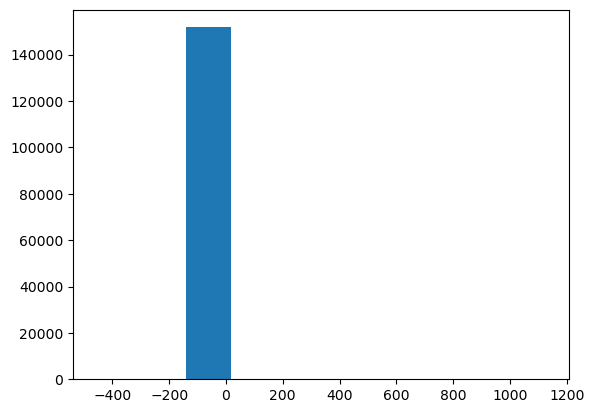

In [27]:
mean_diff_values =[item[1] for item in oxygen_adjusted_change]
plt.hist(mean_diff_values)
print('mean:' + str(np.mean(mean_diff_values)))
print('median: ' + str(np.median(mean_diff_values)))
print('min: ' + str(np.nanmin(mean_diff_values)) + ' max: ' + str(np.nanmax(mean_diff_values)))

In [134]:
# sensor types, numbers, adjusted vs not (1st attempt)

nitrate_float_count = 0
nitrate_profile_count = 0
nitrate_float_adjusted_count = 0
nitrate_profile_adjusted_count = 0

oxygen_float_count = 0
oxygen_profile_count = 0
oxygen_float_adjusted_count = 0
oxygen_profile_adjusted_count = 0.

oxygen_adjusted_change = []

pH_float_count = 0
pH_profile_count = 0
pH_float_adjusted_count = 0
pH_profile_adjusted_count = 0

first_n = 0
for n in tqdm(range(first_n, len(argolist))): #ange(last, len(argolist)):

    # print(f' {n}' ' File: ' + argolist[n]) 

    argo_n = xr.load_dataset(argo_path+argolist[n])
    var_list = list(argo_n.data_vars)
    #print(var_list)

    if n==first_n:
        min_float_dep_date = min(argo_n['JULD']).values
        max_float_dep_date = min(argo_n['JULD']).values
    else:   
        if min(argo_n['JULD']).values > max_float_dep_date:
            max_float_dep_date = min(argo_n['JULD']).values
        
        if min(argo_n['JULD']).values < min_float_dep_date:
            min_float_dep_date = min(argo_n['JULD']).values
      
            
    if "NITRATE" in var_list:
        nitrate_float_count = nitrate_float_count+1
        var_n = argo_n['NITRATE']
        
        # drop all nan data, then count number of profiles
        var_n = var_n.where(~np.isnan(var_n), drop=True)
        nitrate_profile_count = nitrate_profile_count + len(var_n['N_PROF'])

        if "NITRATE_ADJUSTED" in var_list:
            nitrate_float_adjusted_count = nitrate_float_adjusted_count+1
            var_n = argo_n['NITRATE_ADJUSTED']
        
            # drop all nan data, then count number of profiles
            var_n = var_n.where(~np.isnan(var_n), drop=True)
            nitrate_profile_adjusted_count = nitrate_profile_adjusted_count + len(var_n['N_PROF'])

        
    if "DOXY" in var_list:
        oxygen_float_count = oxygen_float_count+1
        var_n = argo_n['DOXY']
        
        # drop all nan data, then count number of profiles
        var_n = var_n.where(~np.isnan(var_n), drop=True)
        oxygen_profile_count = oxygen_profile_count + len(var_n['N_PROF'])
        
        if "DOXY_ADJUSTED" in var_list:
            oxygen_float_adjusted_count = oxygen_float_adjusted_count+1
            var_n = argo_n['DOXY_ADJUSTED']
        
            # drop all nan data, then count number of profiles
            var_n = var_n.where(~np.isnan(var_n), drop=True)
            oxygen_profile_adjusted_count = oxygen_profile_adjusted_count + len(var_n['N_PROF'])
        
            # look at impact of original oxygen adjustments
            doxy_diff = (argo_n['DOXY'] - argo_n['DOXY_ADJUSTED'])

            if ~np.isnan(doxy_diff).all():
                wmo_n = argo_n.PLATFORM_NUMBER.values.astype(int)[0]
                
                doxy_mean = np.nanmean(doxy_diff)
                oxygen_adjusted_change.append((wmo_n, doxy_mean))
            
    if "PH_IN_SITU_TOTAL" in var_list:
        pH_float_count = pH_float_count+1
        var_n = argo_n['PH_IN_SITU_TOTAL']
        
        # drop all nan data, then count number of profiles
        var_n = var_n.where(~np.isnan(var_n), drop=True)
        pH_profile_count = pH_profile_count + len(var_n['N_PROF'])
       
        if "PH_IN_SITU_TOTAL_ADJUSTED" in var_list:
            pH_float_adjusted_count = pH_float_adjusted_count+1
            var_n = argo_n['PH_IN_SITU_TOTAL_ADJUSTED']
        
            # drop all nan data, then count number of profiles
            var_n = var_n.where(~np.isnan(var_n), drop=True)
            pH_profile_adjusted_count = pH_profile_adjusted_count + len(var_n['N_PROF'])
    
    
print('Nitrate Float Count ' + str(nitrate_float_count))
print('Nitrate Profile Count ' + str(nitrate_profile_count))

print('Nitrate Float ADJUSTED Count ' + str(nitrate_float_adjusted_count))
print('Nitrate Profile ADJUSTED Count ' + str(nitrate_profile_adjusted_count))

print('Oxygen Float Count ' + str(oxygen_float_count))
print('Oxygen Profile Count ' + str(oxygen_profile_count))
print('Oxygen Float ADJUSTED Count ' + str(oxygen_float_adjusted_count))
print('Oxygen Profile ADJUSTED Count ' + str(oxygen_profile_adjusted_count))

print('pH Float Count ' + str(pH_float_count))
print('pH Profile Count ' + str(pH_profile_count))
print('pH Float ADJUSTED Count ' + str(pH_float_adjusted_count))
print('pH Profile ADJUSTED Count ' + str(pH_profile_adjusted_count))

print('First deployment date: ' + str(min_float_dep_date))
print('Last deployment date: ' + str(max_float_dep_date))

  0%|          | 0/1839 [00:00<?, ?it/s]

100%|██████████| 1839/1839 [07:06<00:00,  4.31it/s]

Nitrate Float Count 592
Nitrate Profile Count 63376
Nitrate Float ADJUSTED Count 592
Nitrate Profile ADJUSTED Count 52835
Oxygen Float Count 1838
Oxygen Profile Count 267684
Oxygen Float ADJUSTED Count 1838
Oxygen Profile ADJUSTED Count 227002.0
pH Float Count 503
pH Profile Count 44230
pH Float ADJUSTED Count 503
pH Profile ADJUSTED Count 22215
First deployment date: 2002-09-08T23:02:51.995544064
Last deployment date: 2023-06-17T10:12:00.000004096


mean:-12.322795
median: -10.997482
min: -229.63948 max: 136.58412


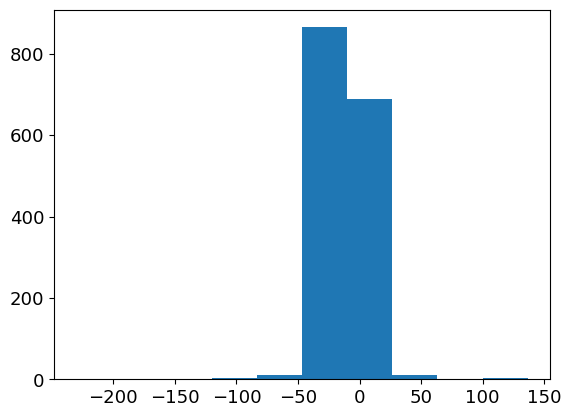

In [135]:
mean_diff_values =[item[1] for item in oxygen_adjusted_change]
plt.hist(mean_diff_values)
print('mean:' + str(np.mean(mean_diff_values)))
print('median: ' + str(np.median(mean_diff_values)))
print('min: ' + str(np.nanmin(mean_diff_values)) + ' max: ' + str(np.nanmax(mean_diff_values)))


Read in sprof and meta files to extract calibration and sensor information that I can then pair with floats/profiles 

### Figure 1 - get oxygen profiles and sensor type

In [50]:
# Step 1 - load float meta data, match sensor / cal type to wmo number and save out in "sensor_table"
import re

# want to load the sensor type (currently only have it per float mean, not attached to every profile)
# so that I have a record of what sensor type, what calibration approach (only focusing on air)
# for each profile. Then I can do area curves of number of oxygen profiles per year in different databases
# because I already am reading in calibration info in the cal_comment file, perhaps it makes sense to do this calculation there? I would like to have all plotting
# together in one file, but maybe not necessary
# Just do it here, no harm in multiple iterations of the same code (??)
# get list of argo meta files
argolist = []
for file in os.listdir(argo_path):
    if file.endswith('meta.nc'):
        argolist.append(file)

print(len(argolist))

# make a list or list of lists w/ wmo and sensor model, then can match profiles to this 
# also need to get air cal info 
sensor_table = pd.DataFrame(columns=['wmo','o2_sensor_type'])
# temp_list = ['5904485_meta.nc']

air_cal_list = ['in air', 'in-air']
confusing_air_cal_list = ['no in air', 'no in-air']

for n, file in enumerate(tqdm(argolist)):
    wmo_n = int((re.search(r'\d+', file)).group())

    # load sensor information from meta file
    meta_n = xr.open_dataset(argo_path + file)
    
    # check whether the float has oxygen
    parameters_n = meta_n.PARAMETER.values
    contains_doxy = any(parameter.decode('utf-8').strip() == 'DOXY' for parameter in parameters_n)
    if contains_doxy is False:
        continue

    sensors = meta_n.SENSOR.values
    sind = [idx for idx, s in enumerate(sensors) if 'DOXY' in s.decode("utf-8")] 
    # #grab sensor model for index
    data_frame_n = []
    if len(sind):
        o2_sensor = meta_n.SENSOR_MODEL.values[sind[0]].decode("utf-8")
    else:
        o2_sensor = 'not listed'

    # load calibration information from Sprof file 
    sprof_n = xr.open_dataset(argo_path + str(wmo_n) + '_Sprof.nc')
    n_prof = sprof_n.dims['N_PROF']
    # gets order of sensors to extract calibration comments
    # some profiles might be missing sensor name (not sure why) so loop through looking
    o2_ind_all = np.full(n_prof, np.nan)
    # finds where o2 calibration comment is in each profile (at least for one float it changes from the first profile to the rest)
    for p in range(0, n_prof):
        cal_str = sprof_n.STATION_PARAMETERS.values.astype(str)[p]
        # print(cal_str)
        for i, param in enumerate(cal_str):
            if 'DOXY' in param:
                o2_ind_all[p] = i
                break
    o2_cal_full = []
    for idx, o2_ind in enumerate(o2_ind_all):
        if ~np.isnan(o2_ind):
            o2_cal_full.append(sprof_n.SCIENTIFIC_CALIB_COMMENT.values[idx,-1,np.int32(o2_ind)])

    data_comment_eq = pd.DataFrame({'o2_cal_full': o2_cal_full})
    # Drop duplicate comments
    unique_comments = data_comment_eq.drop_duplicates()
    # Create an empty list to store DataFrames
    data_frames = []
    # print(o2_cal_unique)
    # might have multiple unique comments, so save out each one:
    for i in unique_comments.index:
        o2_cal_i = unique_comments.o2_cal_full[i].decode("utf-8")

        # print(o2_cal_i)
        # save with wmo only for now
        new_data_cal_info = pd.DataFrame({'wmo': [wmo_n],
                                        'o2_cal_comment': [o2_cal_i]})
        # Append the new_data_cal_info DataFrame to the list
        data_frames.append(new_data_cal_info)

    cal_type = 'not_air'
    # assume if there are any air calibration comments for a float then I can label the entire float as "air_cal"
    for d in range(len(data_frames)):
        for air_str in air_cal_list:
            air_test = (data_frames[d].o2_cal_comment.str.contains(air_str))
            for conf_str in confusing_air_cal_list:
                confusing_test = (data_frames[d].o2_cal_comment.str.contains(conf_str))
            if air_test[0] and not confusing_test[0]:
                cal_type = 'air_cal'
                break

    # search data_frames o2_cal_comment to see if it is an air-calibrated float
    new_data_sensor_info = pd.DataFrame({'wmo': [wmo_n],
                                            'o2_sensor_type': [o2_sensor],
                                            'cal_type': [cal_type]})
            # Append the new_data_cal_info DataFrame to the list
    data_frame_n.append(new_data_sensor_info)

    sensor_table = pd.concat([sensor_table] + data_frame_n, ignore_index=True)
print(sensor_table)


1839


  0%|          | 0/1839 [00:00<?, ?it/s]

100%|██████████| 1839/1839 [03:21<00:00,  9.14it/s]

          wmo                                     o2_sensor_type cal_type
0     4901216  SBE43I                                        ...  not_air
1     7901019  AANDERAA_OPTODE_4330                          ...  not_air
2     5904485  AANDERAA_OPTODE_4330                          ...  air_cal
3     6903878  AANDERAA_OPTODE_4330                          ...  not_air
4     7901009  SBE63_OPTODE                                  ...  not_air
...       ...                                                ...      ...
1828  5904858  AANDERAA_OPTODE_4330                          ...  not_air
1829  5904848  AANDERAA_OPTODE_4330                          ...  air_cal
1830  4900320  SBE43_IDO                                     ...  not_air
1831  6901490  AANDERAA_OPTODE_4330                          ...  not_air
1832  4902550  AANDERAA_OPTODE_4330                          ...  not_air

[1833 rows x 3 columns]


In [51]:
sensor_table['o2_sensor_type'] = sensor_table['o2_sensor_type'].str.strip()  # Remove leading/trailing spaces
sensor_table['o2_sensor_type'] = sensor_table['o2_sensor_type'].str.replace(r'\s+', ' ', regex=True)  # Remove extra whitespace

all_sensor_types = np.unique(sensor_table.o2_sensor_type)
for idx, type in enumerate(all_sensor_types):
    # print(str(idx))# + ' ' + type)
    print('Sensor: ' + type + ' num: ' + str(np.sum(sensor_table.o2_sensor_type==all_sensor_types[idx])))

    sum_air = np.sum(sensor_table.cal_type[sensor_table.o2_sensor_type==all_sensor_types[idx]]=='air_cal')
    sum_not_air = np.sum(sensor_table.cal_type[sensor_table.o2_sensor_type==all_sensor_types[idx]]=='not_air')
    print('num air: ' + str(sum_air) + ' num not air: ' + str(sum_not_air))


Sensor:  num: 1
num air: 0 num not air: 1
Sensor: 3830 num: 1
num air: 0 num not air: 1
Sensor: AANDERAA_OPTODE_3830 num: 290
num air: 29 num not air: 261
Sensor: AANDERAA_OPTODE_3835 num: 4
num air: 0 num not air: 4
Sensor: AANDERAA_OPTODE_4330 num: 1177
num air: 489 num not air: 688
Sensor: AANDERAA_OPTODE_4831 num: 3
num air: 0 num not air: 3
Sensor: AANDERRA_OPTODE_3830 num: 4
num air: 0 num not air: 4
Sensor: AROD_FT num: 8
num air: 0 num not air: 8
Sensor: ARO_FT num: 16
num air: 0 num not air: 16
Sensor: SBE43F_IDO num: 86
num air: 0 num not air: 86
Sensor: SBE43I num: 66
num air: 0 num not air: 66
Sensor: SBE43_IDO num: 46
num air: 2 num not air: 44
Sensor: SBE63_OPTODE num: 131
num air: 4 num not air: 127


In [19]:
print('n Floats "not air" = ' + str(np.sum(sensor_table.cal_type=='not_air')))

print('n Floats "air" = ' + str(np.sum(sensor_table.cal_type=='air_cal')))


n Floats "not air" = 1309
n Floats "air" = 524


2. For each file, find all profiles with valid O2 data, save out lat/lon/date into an array


In [52]:
argolist = []
for file in os.listdir(argo_path):
    if file.endswith('Sprof.nc'):
        argolist.append(file)

last = 0
print(len(argolist))

#wmo_list = list()
if 'argo_all' in locals():
    argo_all.close()
    
for n in range(0, len(argolist)):
    print(f' {n}' ' File: ' + argolist[n]) 

    #n = 0
    argo_n = xr.load_dataset(argo_path+argolist[n])
    argo_n = argo_n.set_coords(('PRES_ADJUSTED','LATITUDE','LONGITUDE','JULD'))
    
    var_list = list(argo_n.data_vars)
    
    if "DOXY_ADJUSTED" not in var_list:
        print('Skipping')
        continue
            
    doxy_trimmed = argo_n.DOXY_ADJUSTED.where(~np.isnan(argo_n.DOXY_ADJUSTED), drop=True)
    wmo_n = argo_n.PLATFORM_NUMBER.values.astype(int)[0]

    prof_loc = xr.Dataset()
    prof_loc['wmo']=(['N_PROF'],np.repeat(wmo_n,len(doxy_trimmed)))

    prof_loc['LATITUDE'] = (['N_PROF'], doxy_trimmed.LATITUDE.data)
    prof_loc['LONGITUDE'] = (['N_PROF'], doxy_trimmed.LONGITUDE.data)
    prof_loc['juld'] = (['N_PROF'],doxy_trimmed.JULD.data)
    #prof_loc['profile'] = (['N_PROF'],doxy_trimmed.CYCLE_NUMBER.data)
    #argo_n
    # find o2 sensor type and add to prof_loc xarray
    sensor_type = pd.DataFrame({'sensor_type':[sensor_table.o2_sensor_type[sensor_table.wmo==wmo_n].values] * len(doxy_trimmed)})
    sensor_type_xarray = xr.DataArray(sensor_type['sensor_type'].values, dims='N_PROF', coords={'N_PROF': range(len(doxy_trimmed))})
    prof_loc['sensor_type'] = sensor_type_xarray
    # find o2 cal method and add to prof_loc xarray
    cal_type_df = pd.DataFrame({'cal_type':[sensor_table.cal_type[sensor_table.wmo==wmo_n].values] * len(doxy_trimmed)})
    cal_type_xarray = xr.DataArray(cal_type_df['cal_type'].values, dims='N_PROF', coords={'N_PROF': range(len(doxy_trimmed))})
    prof_loc['cal_type'] = cal_type_xarray
    # append all files into one long xarray

    if n == 0:
        argo_all = prof_loc
    else:
        argo_all = xr.concat([argo_all,prof_loc], 'N_PROF')

    # break
    last = n + 1
argo_all


1839
 0 File: 1901378_Sprof.nc
 1 File: 1901379_Sprof.nc
 2 File: 6902931_Sprof.nc
 3 File: 5901315_Sprof.nc
 4 File: 6901898_Sprof.nc
 5 File: 6901899_Sprof.nc
 6 File: 5901314_Sprof.nc
 7 File: 6903768_Sprof.nc
 8 File: 2900737_Sprof.nc
 9 File: 5904687_Sprof.nc
 10 File: 3900348_Sprof.nc
 11 File: 2900736_Sprof.nc
 12 File: 5904686_Sprof.nc
 13 File: 4901806_Sprof.nc
 14 File: 6901592_Sprof.nc
 15 File: 6903805_Sprof.nc
 16 File: 5905080_Sprof.nc
 17 File: 6903804_Sprof.nc
 18 File: 6901593_Sprof.nc
 19 File: 5906574_Sprof.nc
 20 File: 5904473_Sprof.nc
 21 File: 5904472_Sprof.nc
 22 File: 5906575_Sprof.nc
 23 File: 3900714_Sprof.nc
 24 File: 6901766_Sprof.nc
 25 File: 6901767_Sprof.nc
 26 File: 3900715_Sprof.nc
 27 File: 6903153_Sprof.nc
 28 File: 3902121_Sprof.nc
 29 File: 3902120_Sprof.nc
 30 File: 6903152_Sprof.nc
 31 File: 4903499_Sprof.nc
 32 File: 5904127_Sprof.nc
 33 File: 5906246_Sprof.nc
 34 File: 4902437_Sprof.nc
 35 File: 5906020_Sprof.nc
 36 File: 5906021_Sprof.nc
 37 Fi

<xarray.Dataset>
Dimensions:      (N_PROF: 227002)
Coordinates:
  * N_PROF       (N_PROF) int64 0 1 2 3 4 5 6 7 ... 255 256 257 258 259 260 261
Data variables:
    wmo          (N_PROF) int64 1901378 1901378 1901378 ... 6900889 6900889
    LATITUDE     (N_PROF) float64 31.69 31.76 31.74 31.73 ... 9.909 9.809 9.761
    LONGITUDE    (N_PROF) float64 -64.2 -64.28 -64.32 ... -25.67 -25.61 -25.57
    juld         (N_PROF) datetime64[ns] 2009-10-12T13:39:09.003985920 ... 20...
    sensor_type  (N_PROF) object ['AANDERAA_OPTODE_3830'] ... ['AANDERAA_OPTO...
    cal_type     (N_PROF) object ['not_air'] ['not_air'] ... ['not_air']

In [53]:
# count oxygen profiles of different types by year/month
optode_text = ['3830', 'OPTODE', 'ARO']
clark_text = ['SBE43']
SBE63_text = ['SBE63']
# need to calculate number of float profiles of different kinds over time:
year_month_profile_count = pd.DataFrame(columns=['decimal_year','Total O2 Float Profiles',
                                                 'Clark cell electrodes', 
                                                 'Optodes', 
                                                 'Air calibrated optodes', 
                                                 'Not air calibrated',
                                                 'SBE63 Optodes'])
# loop through years
for year_n in range(2002, 2024):
    print(year_n)
    #loop through months
    for mon_n in range(1,13):
        # print(mon_n)
        month_index = np.logical_and(argo_all['juld'].dt.year==year_n, 
                        argo_all['juld'].dt.month==mon_n)
        month_count = np.sum(month_index)

        air_cal_count = np.sum(argo_all['cal_type'][month_index]=='air_cal')
        not_air_cal_count = np.sum(argo_all['cal_type'][month_index]=='not_air')


        # checks whether o2 sensors are optodes or clark cell electrodes
        optode = 0
        clark = 0
        SBE63 = 0
        for item in argo_all['sensor_type'][month_index].values:
            if len(item):
                for sensor in optode_text:
                    if sensor in item.item():
                        optode = optode+1
                        break
                for sensor in clark_text:
                    if sensor in item.item():
                        clark = clark+1
                        break
                for sensor in SBE63_text:
                    if sensor in item.item():
                        SBE63 = SBE63+1
                        break
        # print(optode)
        # print(clark)

        new_data_count = [(year_n + mon_n/12, month_count.values, clark,  optode, air_cal_count.values, not_air_cal_count.values, SBE63)]
        new_df_count = pd.DataFrame(new_data_count, 
                                    columns=['decimal_year', 
                                             'Total O2 Float Profiles', 
                                             'Clark cell electrodes', 
                                             'Optodes',
                                             'Air calibrated optodes', 
                                                 'Not air calibrated',
                                                 'SBE63 Optodes'])

        year_month_profile_count = pd.concat([year_month_profile_count, new_df_count], ignore_index=True)
        # print(new_df_count)

print(year_month_profile_count)

2002
2003
2004
2005
2006
2007
2008
2009
2010
2011
2012
2013
2014
2015
2016
2017
2018
2019
2020
2021
2022
2023
     decimal_year Total O2 Float Profiles Clark cell electrodes Optodes  \
0     2002.083333                       0                     0       0   
1     2002.166667                       0                     0       0   
2     2002.250000                       0                     0       0   
3     2002.333333                       0                     0       0   
4     2002.416667                       0                     0       0   
..            ...                     ...                   ...     ...   
259   2023.666667                       0                     0       0   
260   2023.750000                       0                     0       0   
261   2023.833333                       0                     0       0   
262   2023.916667                       0                     0       0   
263   2024.000000                       0                     0  

In [22]:
np.sum(year_month_profile_count['Total O2 Float Profiles'] - year_month_profile_count['Clark cell electrodes'] - year_month_profile_count['Optodes'])

print(np.sum(year_month_profile_count['Not air calibrated']))

161402


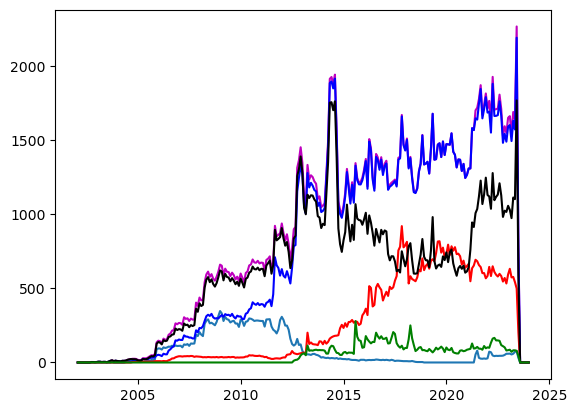

In [23]:
# not for publication
plt.plot(year_month_profile_count['decimal_year'], year_month_profile_count['Total O2 Float Profiles'],'m')
plt.plot(year_month_profile_count['decimal_year'], year_month_profile_count['Clark cell electrodes'])
plt.plot(year_month_profile_count['decimal_year'], year_month_profile_count['Optodes'], 'b')
plt.plot(year_month_profile_count['decimal_year'], year_month_profile_count['Air calibrated optodes'], 'r')
plt.plot(year_month_profile_count['decimal_year'], year_month_profile_count['Not air calibrated'],'k')
plt.plot(year_month_profile_count['decimal_year'], year_month_profile_count['SBE63 Optodes'],'g')



#### Gridded GLODAP profile map / profile by month for comparison with float data

In [54]:
import functions.float_data_processing as fl

gdap = fl.get_glodap(data_dir, year = 2022)
gdap.G2longitude[gdap.G2longitude < 0.] = gdap.G2longitude[gdap.G2longitude < 0.] + 360.
#set flagged data to NaN (is this needed? or masked array better?)
flagvars = ['G2salinity','G2oxygen','G2nitrate','G2tco2','G2talk','G2phts25p0']

for v in flagvars:
    flag = v+'f'
    naninds = gdap[flag]!=2
    gdap[v][naninds] = np.nan

# GLODAP derived variables: density, MLD and pH

#calc potential density
gdap['sigma0_calculated'] = carbon_utils.sigma0(gdap.G2salinity.values,gdap.G2temperature.values,
                                  gdap.G2longitude.values,gdap.G2latitude.values,gdap.G2pressure.values)
#calculate spice
gdap['spice'] = carbon_utils.spiciness0(gdap.G2salinity.values,gdap.G2temperature.values,
                                  gdap.G2longitude.values,gdap.G2latitude.values,gdap.G2pressure.values)

#rename GLODAP comparison variables to match argo
gdap = gdap.rename(columns={'G2longitude':'LONGITUDE', 'G2latitude':'LATITUDE', 'G2pressure':'PRES_ADJUSTED',
                            'G2temperature':'TEMP_ADJUSTED','G2salinity':'PSAL_ADJUSTED', 
                            'G2oxygen':'DOXY_ADJUSTED','G2nitrate':'NITRATE_ADJUSTED', 'G2tco2':'DIC', 
                            'G2talk':'TALK_LIAR', 'G2MLD':'MLD','G2o2sat':'o2sat', 'G2PTMP':'PTMP', 
                            'sigma0_calculated':'PDENS'})

gdap['obs_index']=gdap.reset_index().index

https://www.ncei.noaa.gov/data/oceans/ncei/ocads/data/0257247/GLODAPv2.2022_Merged_Master_File.csv


/Users/smb-uh/UHM_Ocean_BGC_Group Dropbox/Seth Bushinsky/Work/Manuscripts/2022_07 Deep O2 Bias/argo_deep_o2_bias/functions/float_data_processing.py:36: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  gdap = pd.read_csv(save_dir+'GLODAPv2.'+str(year)+'_Merged_Master_File.csv')
/var/folders/7r/4f_w_nb56llcwh96t_pjq_qh0000gn/T/ipykernel_2754/286575459.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  gdap.G2longitude[gdap.G2longitude < 0.] = gdap.G2longitude[gdap.G2longitude < 0.] + 360.
/var/folders/7r/4f_w_nb56llcwh96t_pjq_qh0000gn/T/ipykernel_2754/286575459.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/

In [55]:
# identify individual cruises and profiles in GLODAP dataset 
#wmo_list = list()
if 'gdap_all' in locals():
    del gdap_all

gdap_O2 = gdap[~np.isnan(gdap.DOXY_ADJUSTED)]  # remove data w/o oxygen
unique_cruises = np.unique(gdap_O2.G2cruise)

for idx, cruise in enumerate(unique_cruises):
    print(f' {idx +1 }' ' Cruise out of: ' + str(len(unique_cruises))) 

    gdap_cruise = gdap_O2[gdap_O2.G2cruise==cruise]
    cruise_stations = np.unique(gdap_cruise.G2station[gdap_cruise.G2cruise==cruise])

    # break
    for c_idx, station in enumerate(cruise_stations):
        station_index = gdap_cruise.G2station==station

        gdap_cruise.LONGITUDE[station_index]

        cruise_loc = xr.Dataset()
        cruise_loc['G2cruise']=(['N_CRUISE'],np.repeat(cruise,1))
        cruise_loc['station'] =(['N_CRUISE'],np.repeat(station,1))
        cruise_loc['LATITUDE'] =(['N_CRUISE'],np.repeat(np.nanmean(gdap_cruise.LATITUDE[station_index]),1))
        cruise_loc['LONGITUDE'] =(['N_CRUISE'],np.repeat(np.nanmean(gdap_cruise.LONGITUDE[station_index]),1))
        cruise_loc['juld'] =(['N_CRUISE'],np.repeat((gdap_cruise.datetime[station_index].values[0]),1))

        if 'gdap_all' not in locals():
            gdap_all = cruise_loc
        else:
            gdap_all = xr.concat([gdap_all,cruise_loc], 'N_CRUISE')
        

gdap_all['LONGITUDE'][gdap_all['LONGITUDE']>180] = gdap_all['LONGITUDE'][gdap_all['LONGITUDE']>180]-360
gdap_all



 1 Cruise out of: 991
 2 Cruise out of: 991
 3 Cruise out of: 991
 4 Cruise out of: 991
 5 Cruise out of: 991
 6 Cruise out of: 991
 7 Cruise out of: 991
 8 Cruise out of: 991
 9 Cruise out of: 991
 10 Cruise out of: 991
 11 Cruise out of: 991
 12 Cruise out of: 991
 13 Cruise out of: 991
 14 Cruise out of: 991
 15 Cruise out of: 991
 16 Cruise out of: 991
 17 Cruise out of: 991
 18 Cruise out of: 991
 19 Cruise out of: 991
 20 Cruise out of: 991
 21 Cruise out of: 991
 22 Cruise out of: 991
 23 Cruise out of: 991
 24 Cruise out of: 991
 25 Cruise out of: 991
 26 Cruise out of: 991
 27 Cruise out of: 991
 28 Cruise out of: 991
 29 Cruise out of: 991
 30 Cruise out of: 991
 31 Cruise out of: 991
 32 Cruise out of: 991
 33 Cruise out of: 991
 34 Cruise out of: 991
 35 Cruise out of: 991
 36 Cruise out of: 991
 37 Cruise out of: 991
 38 Cruise out of: 991
 39 Cruise out of: 991
 40 Cruise out of: 991
 41 Cruise out of: 991
 42 Cruise out of: 991
 43 Cruise out of: 991
 44 Cruise out of: 9

<xarray.Dataset>
Dimensions:    (N_CRUISE: 53247)
Dimensions without coordinates: N_CRUISE
Data variables:
    G2cruise   (N_CRUISE) int64 1 1 1 1 1 1 1 ... 4096 4096 4096 4096 4096 4096
    station    (N_CRUISE) float64 321.0 322.0 323.0 324.0 ... 14.0 15.0 16.0
    LATITUDE   (N_CRUISE) float64 80.73 80.9 81.05 81.2 ... -35.91 -34.71 -34.31
    LONGITUDE  (N_CRUISE) float64 12.85 18.59 17.67 16.79 ... 14.07 17.04 17.59
    juld       (N_CRUISE) datetime64[ns] 1984-07-21T13:07:00 ... 2010-11-19T1...

In [56]:
# count glodap cruises by year and month 
year_month_profile_count_gdap = pd.DataFrame(columns=['decimal_year','Total GDAP O2 Profiles'
                                                 ])
for year_n in range(1980, 2024):
    #loop through months
    for mon_n in range(1,13):
        # print(mon_n)
        month_index = np.logical_and(gdap_all['juld'].dt.year==year_n, 
                            gdap_all['juld'].dt.month==mon_n)
        month_count = np.sum(month_index)
        new_data_count = [(year_n + mon_n/12, month_count.values)]
        new_df_count = pd.DataFrame(new_data_count, 
                                    columns=['decimal_year',
                                             'Total GDAP O2 Profiles'])
        
        year_month_profile_count_gdap = pd.concat([year_month_profile_count_gdap, new_df_count], ignore_index=True)

print(year_month_profile_count_gdap)
print(np.max(gdap_all.LONGITUDE))
print(np.min(gdap_all.LONGITUDE))

print(np.max(argo_all.LONGITUDE))

gdap_all['LONGITUDE'][gdap_all['LONGITUDE']>180] = gdap_all['LONGITUDE'][gdap_all['LONGITUDE']>180]-360

print(np.max(gdap_all.LONGITUDE))
print(np.min(gdap_all.LONGITUDE))

     decimal_year Total GDAP O2 Profiles
0     1980.083333                      0
1     1980.166667                      0
2     1980.250000                      0
3     1980.333333                      0
4     1980.416667                      0
..            ...                    ...
523   2023.666667                      0
524   2023.750000                      0
525   2023.833333                      0
526   2023.916667                      0
527   2024.000000                      0

[528 rows x 2 columns]
<xarray.DataArray 'LONGITUDE' ()>
array(180.)
<xarray.DataArray 'LONGITUDE' ()>
array(-179.99)
<xarray.DataArray 'LONGITUDE' ()>
array(181.706)
<xarray.DataArray 'LONGITUDE' ()>
array(180.)
<xarray.DataArray 'LONGITUDE' ()>
array(-179.99)


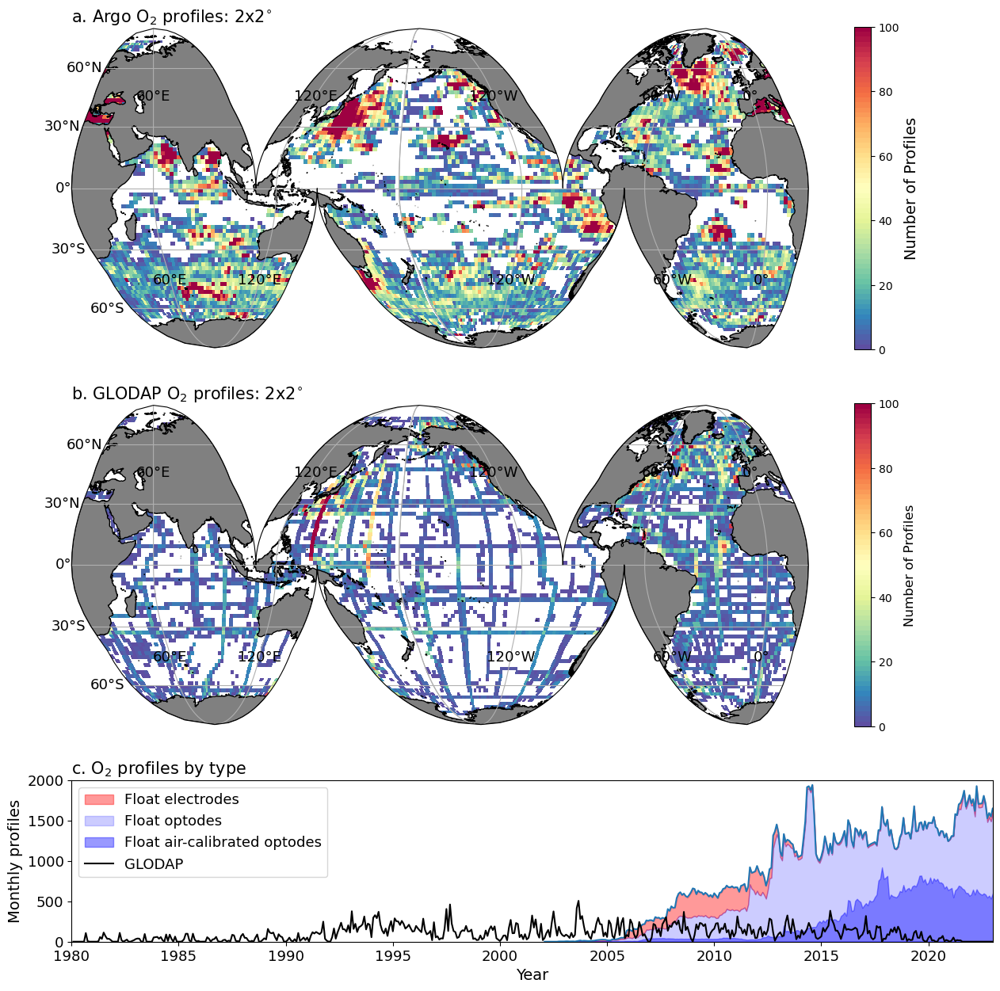

In [58]:
# Figure 1 plotting 
fig = plt.figure(figsize=(15, 15))
title_font_size = 15
axis_label_font_size = 14
plt.rcParams.update({'font.size': 13})
# Create a grid of subplots using gridspec
gs = gridspec.GridSpec(3, 1, width_ratios=[1], height_ratios=[2, 2, 1])

ax = fig.add_subplot(gs[0,:], projection=ccrs.InterruptedGoodeHomolosine(central_longitude=-160, globe=None, emphasis='ocean'))
cmap = plt.cm.get_cmap("Spectral_r", 64)
# ax.coastlines()
ax.add_feature(cfeature.NaturalEarthFeature('physical', 'land', '50m', edgecolor='k', facecolor=[.5, .5 ,.5]))

ax.set_global()
gl = ax.gridlines(draw_labels=True)
gl.right_labels = False
gl.top_labels = False

dlatlon = 2
lonbins = np.arange(-180, 180, dlatlon)
latbins = np.arange(-80, 80, dlatlon)

hist = stats.binned_statistic_2d(argo_all.LATITUDE, argo_all.LONGITUDE, None, bins=[latbins, lonbins], statistic="count")
hist.statistic[hist.statistic == 0] = np.nan  # Sets all values of 0 to nan as log10(0) = -inf
hist.statistic

image = plt.pcolormesh(lonbins, latbins, hist.statistic, cmap=cmap, shading="flat", transform=ccrs.PlateCarree()) 
plt.clim(0, 100) 

cbar = fig.colorbar(image, ax=ax, orientation='vertical')#, fraction=0.1, aspect=40, pad=0.08)
plt.title('a. Argo O$_2$ profiles: ' +str(dlatlon) +'x' + str(dlatlon) +'$^{\circ}$', loc='left', size=title_font_size)
cbar.ax.tick_params(labelsize=10)
cbar.set_label(label='Number of Profiles', size=axis_label_font_size)


ax = fig.add_subplot(gs[1,:], projection=ccrs.InterruptedGoodeHomolosine(central_longitude=-160, globe=None, emphasis='ocean'))
cmap = plt.cm.get_cmap("Spectral_r", 64)
# ax.coastlines()
ax.add_feature(cfeature.NaturalEarthFeature('physical', 'land', '50m', edgecolor='k', facecolor=[.5, .5 ,.5]))

ax.set_global()
gl = ax.gridlines(draw_labels=True)
gl.right_labels = False
gl.top_labels = False
gl.bottom_labels = False

dlatlon = 2
lonbins = np.arange(-180, 180, dlatlon)
latbins = np.arange(-80, 80, dlatlon)

hist = stats.binned_statistic_2d(gdap_all.LATITUDE, gdap_all.LONGITUDE, None, bins=[latbins, lonbins], statistic="count")
hist.statistic[hist.statistic == 0] = np.nan  # Sets all values of 0 to nan as log10(0) = -inf
hist.statistic

image = plt.pcolormesh(lonbins, latbins, hist.statistic, cmap=cmap, shading="flat", transform=ccrs.PlateCarree()) 
plt.clim(0, 100) 

cbar = fig.colorbar(image, ax=ax, orientation='vertical')#, fraction=0.1, aspect=40, pad=0.08)
plt.title('b. GLODAP O$_2$ profiles: ' +str(dlatlon) +'x' + str(dlatlon) +'$^{\circ}$', loc='left', size=title_font_size)
cbar.ax.tick_params(labelsize=10)
cbar.set_label(label='Number of Profiles', size=12)


ax2 = plt.subplot(gs[2,0])

x = year_month_profile_count['decimal_year'][0:-1-6].tolist()
y_total = year_month_profile_count['Total O2 Float Profiles'][0:-1-6].tolist()
y_air = year_month_profile_count['Air calibrated optodes'][0:-1-6].tolist()
y_optodes = year_month_profile_count['Optodes'][0:-1-6].tolist()

y_clark_line = (year_month_profile_count['Optodes'][0:-1-6] + year_month_profile_count['Clark cell electrodes'][0:-1-6]).tolist()
plt.plot(x, y_total)

plt.fill_between(
        x, 
        y_clark_line,
        y_optodes, 
        color= "r",
        alpha= 0.4, label='Float electrodes')

plt.fill_between(
        x, 
        y_optodes,
        0, 
        color= "b",
        alpha= 0.2, label='Float optodes')

plt.fill_between(
        x, 
        y_air,
        0, 
        color= "b",
        alpha= 0.4, label='Float air-calibrated optodes')

x = year_month_profile_count_gdap['decimal_year'][0:-1-6].tolist()
y_total = year_month_profile_count_gdap['Total GDAP O2 Profiles'][0:-1-6].tolist()

plt.plot(x, y_total, 'k', label='GLODAP')

plt.ylabel('Monthly profiles', size=axis_label_font_size)
plt.xlabel('Year', size=axis_label_font_size)
plt.title('c. O$_2$ profiles by type', loc='left', size=title_font_size)
plt.legend()
ax2.set_ylim([0, 2000])
ax2.set_xlim([1980, 2023])

# ax3 = plt.subplot(gs[2,1])


# plt.ylabel('Monthly profiles')
# plt.xlabel('Year')
# plt.title('d. GLODAP O$_2$ profiles', loc='left')
# ax3.set_ylim([0, 2000])
# ax3.set_xlim([1980, 2023])

plt.tight_layout
plt.savefig(manuscript_figs+ 'Fig_1_Argo_O2_Sampling_Density and sensor type_w_glodap' + code_ver + '.png', dpi = 300)

### Figure 3, 4, 6 prep. Load mean GLODAP offsets, plus original GLODAP offsets and fix longitude in the mean offsets

In [5]:
if 'glodap_offsets_mean' in locals():
    glodap_offsets_mean.close()

glodap_offsets_mean = xr.load_dataset(output_dir+glodap_mean_offsets_filename)

# float_wmo_list = glodap_offsets_p.index.values
float_wmo_list = glodap_offsets_mean.main_float_wmo.values
if 'glodap_offsets' in locals():
    glodap_offsets.close()

glodap_offsets = xr.load_dataset(output_dir+glodap_offsets_filename)

# loop through mean array
for n in range(0,float_wmo_list.shape[0]):
        wmo_n = float_wmo_list[n]

        # fix long_n mean biases:
        temp_LONGITUDE = glodap_offsets.main_float_longitude.where(glodap_offsets.main_float_wmo==wmo_n, drop=True)

        if (np.max(temp_LONGITUDE) - np.min(temp_LONGITUDE))>300:
                # print(n)
                new_mean = np.mean(xr.where(temp_LONGITUDE>=0, temp_LONGITUDE, temp_LONGITUDE+360))
                if new_mean>180:
                        new_mean = new_mean-360
                        
                old_mean = np.mean(glodap_offsets.main_float_longitude.where(glodap_offsets.main_float_wmo==wmo_n, drop=True))
                # print('old mean: '  + str(old_mean.values))
                # print('orig mean glodap:' + str(glodap_offsets_mean['main_float_longitude'].loc[{'main_float_wmo': wmo_n}].values))

                # print('new mean: '  + str(new_mean.values))

                # put new LONGITUDE into long_n
                glodap_offsets_mean['main_float_longitude'].loc[{'main_float_wmo': wmo_n}] = new_mean.values
                # print('New mean glodap:' + str(glodap_offsets_mean['main_float_longitude'].loc[{'main_float_wmo': wmo_n}].values))

glodap_offsets_p = glodap_offsets_mean.to_dataframe()

        
parameter_a = 'o2_calib_air_group'
parameter_b = 'pH_group'
offsets_g = glodap_offsets_p.groupby(parameter_a)
offsets_pH = glodap_offsets_p.groupby([parameter_a, parameter_b])

In [6]:
# only gives the lengths of groups with means actually calculated
No_air_cal_all = offsets_g.get_group('no air cal')
print(len(No_air_cal_all))

air_cal_all = offsets_g.get_group('air cal')
print(len(air_cal_all))

no_cal_all = offsets_g.get_group('no cal/bad')
print(len(no_cal_all))

303
324
46


Figure 3 - air cal histograms

+---------------+---------+--------+-------+-----------+----------------+-----------------+----------+-------+-------+
|               |   count |   mean |   std | p_value   |   95.0% CI low |   95.0% CI high |   median |   min |   max |
+===============+=========+========+=======+===========+================+=================+==========+=======+=======+
| All           |     540 |   -1.9 |   4.7 | <0.001    |           -2.3 |            -1.5 |     -1.8 | -63.9 |  15   |
+---------------+---------+--------+-------+-----------+----------------+-----------------+----------+-------+-------+
| No air cal.   |     253 |   -0.9 |   3.6 | <0.001    |           -1.4 |            -0.5 |     -0.7 | -11.2 |  11   |
+---------------+---------+--------+-------+-----------+----------------+-----------------+----------+-------+-------+
| Air cal.      |     255 |   -3.1 |   5.3 | <0.001    |           -3.7 |            -2.4 |     -2.6 | -63.9 |  10.5 |
+---------------+---------+--------+-------+----

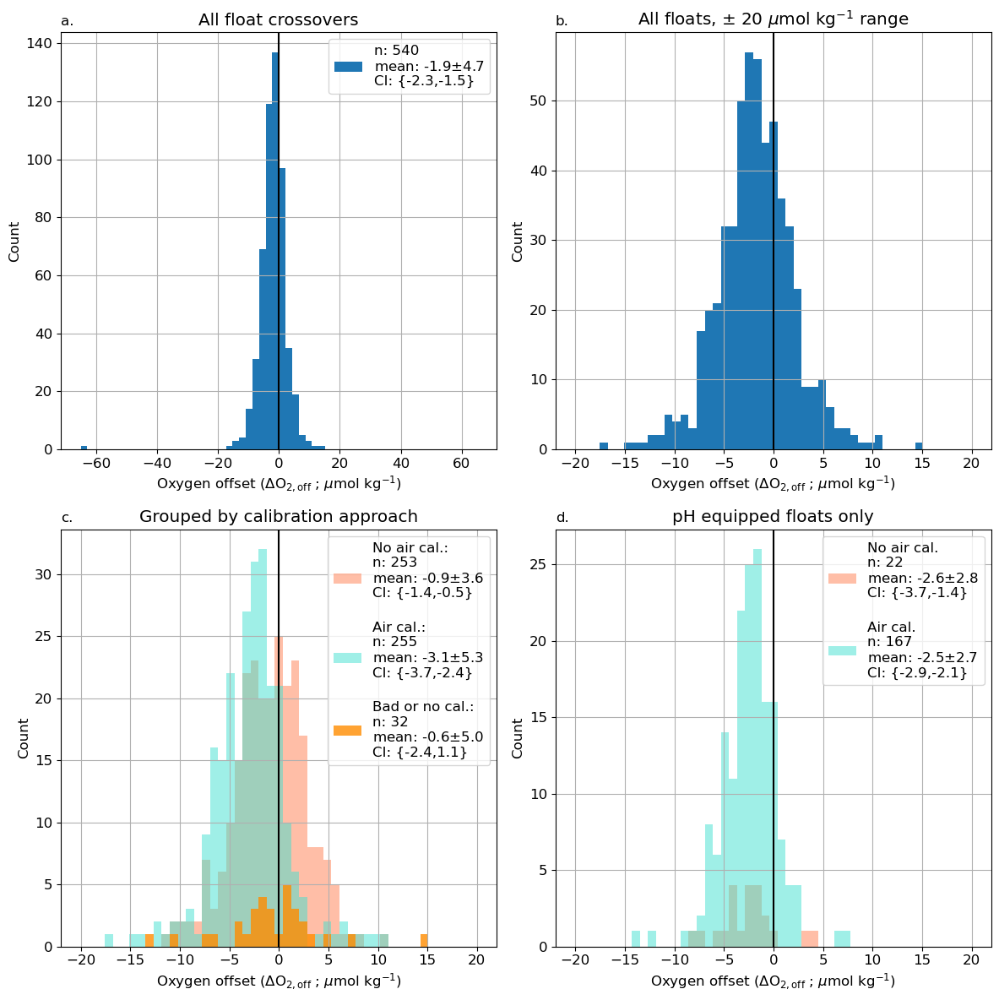

In [7]:
CI_level = 0.95
plt.rcParams.update({'font.size': 12})

plt.figure(figsize=(12,12))

#All Float Crossovers
plt.subplot(2,2,1)
ncount = glodap_offsets_mean['DOXY_ADJUSTED_offset_trimmed'].count()
nmean = np.around(glodap_offsets_mean['DOXY_ADJUSTED_offset_trimmed'].mean(), decimals=1)
nstd = np.around(glodap_offsets_mean['DOXY_ADJUSTED_offset_trimmed'].std(), decimals=1)
nmedian = np.around(glodap_offsets_mean['DOXY_ADJUSTED_offset_trimmed'].median(), decimals=1)
nmin = np.around(glodap_offsets_mean['DOXY_ADJUSTED_offset_trimmed'].min(), decimals=1)
nmax = np.around(glodap_offsets_mean['DOXY_ADJUSTED_offset_trimmed'].max(), decimals=1)

temp_var = glodap_offsets_mean['DOXY_ADJUSTED_offset_trimmed']
t_stat, p_value = stats.ttest_1samp(a=temp_var, popmean=0, nan_policy='omit') ############
if p_value>.001:
    p_value = np.around(p_value, decimals=3)
else:
    p_value = '<0.001'

CI_vals = stats.norm.interval(confidence=CI_level, 
                 loc=np.nanmean(temp_var[~np.isnan(temp_var)].values), 
                 scale = stats.sem(temp_var[~np.isnan(temp_var)].values))
CI_low = np.around(CI_vals[0], decimals=1)
CI_high = np.around(CI_vals[1], decimals=1)

o2_offset_data_table = [('All', ncount.item(), nmean.item(), nstd.item(), p_value, CI_low, CI_high, nmedian.item(), nmin.item(), nmax.item())]
plt.hist(glodap_offsets_mean['DOXY_ADJUSTED_offset_trimmed'], 
         bins=np.linspace(-65, 65, 61), label='n: '+str(ncount.values) +  '\nmean: ' + str(nmean.values) + '$\pm$' + str(nstd.values) + 
         '\nCI: {' + str(CI_low) +',' +  str(CI_high) + '}'
         ) # ,label=str(n)
#print(np.around(glodap_offsets_mean['DOXY_ADJUSTED_offset_trimmed'].median().values, decimals=1))
plt.grid()
plt.title('All float crossovers')
plt.title('a.', loc='left', fontsize='medium')

plt.xlabel(r'Oxygen offset ($\Delta$O$_{\rm 2,off}$ ; $\mu$mol kg$^{-1}$)')
plt.ylabel('Count')
plt.axvline(x=0, color='k')
plt.legend()

# All float crossovers, zoomed in
plt.subplot(2,2,2)
plt.title('All floats, $\pm$ 20 $\mu$mol kg$^{-1}$ range')
plt.title('b.', loc='left', fontsize='medium')

plt.hist(glodap_offsets_mean['DOXY_ADJUSTED_offset_trimmed'], 
         bins=np.linspace(-20, 20, 50),label='median='+str(nmedian.values) + 
         ', n='+str(ncount.values)) # ,label=str(n)
plt.grid()
plt.ylabel('Count')
plt.axvline(x=0, color='k')

plt.xlabel(r'Oxygen offset ($\Delta$O$_{\rm 2,off}$ ; $\mu$mol kg$^{-1}$)')

# Split into calibration group
plt.subplot(2,2,3)
No_air_cal_all = offsets_g.get_group('no air cal')
nmean = np.around(No_air_cal_all['DOXY_ADJUSTED_offset_trimmed'].mean(), decimals=1)
nstd = np.around(No_air_cal_all['DOXY_ADJUSTED_offset_trimmed'].std(), decimals=1)
nmedian = np.around(No_air_cal_all['DOXY_ADJUSTED_offset_trimmed'].median(), decimals=1)
ncount = No_air_cal_all['DOXY_ADJUSTED_offset_trimmed'].count() # only counts non-nan values
nmin = np.around(No_air_cal_all['DOXY_ADJUSTED_offset_trimmed'].min(), decimals=1)
nmax = np.around(No_air_cal_all['DOXY_ADJUSTED_offset_trimmed'].max(), decimals=1)

temp_var = No_air_cal_all['DOXY_ADJUSTED_offset_trimmed']
t_stat, p_value = stats.ttest_1samp(a=temp_var, popmean=0, nan_policy='omit') ############
if p_value>.001:
    p_value = np.around(p_value, decimals=3)
else:
    p_value = '<0.001'

CI_vals = stats.norm.interval(confidence=CI_level, 
                 loc=np.nanmean(temp_var[~np.isnan(temp_var)].values), 
                 scale = stats.sem(temp_var[~np.isnan(temp_var)].values))
CI_low = np.around(CI_vals[0], decimals=1)
CI_high = np.around(CI_vals[1], decimals=1)
o2_offset_data_table.append(('No air cal.', ncount, nmean, nstd, p_value, CI_low, CI_high, nmedian, nmin, nmax))


plt.hist(No_air_cal_all['DOXY_ADJUSTED_offset_trimmed'], bins=np.linspace(-20, 20, 50), color='coral',
             alpha=.5,label='No air cal.: \nn: '+str(ncount) +  '\nmean: ' + str(nmean) + '$\pm$' + str(nstd) + 
         '\nCI: {' + str(CI_low) +',' +  str(CI_high) + '}\n')



air_cal_all = offsets_g.get_group('air cal')
nmean = np.around(air_cal_all['DOXY_ADJUSTED_offset_trimmed'].mean(), decimals=1)
nstd = np.around(air_cal_all['DOXY_ADJUSTED_offset_trimmed'].std(), decimals=1)
nmedian = np.around(air_cal_all['DOXY_ADJUSTED_offset_trimmed'].median(), decimals=1)
ncount = air_cal_all['DOXY_ADJUSTED_offset_trimmed'].count() # only counts non-nan values
nmin = np.around(air_cal_all['DOXY_ADJUSTED_offset_trimmed'].min(), decimals=1)
nmax = np.around(air_cal_all['DOXY_ADJUSTED_offset_trimmed'].max(), decimals=1)

temp_var = air_cal_all['DOXY_ADJUSTED_offset_trimmed']
t_stat, p_value = stats.ttest_1samp(a=temp_var, popmean=0, nan_policy='omit') ############
if p_value>.001:
    p_value = np.around(p_value, decimals=3)
else:
    p_value = '<0.001'

CI_vals = stats.norm.interval(confidence=CI_level, 
                 loc=np.nanmean(temp_var[~np.isnan(temp_var)].values), 
                 scale = stats.sem(temp_var[~np.isnan(temp_var)].values))
CI_low = np.around(CI_vals[0], decimals=1)
CI_high = np.around(CI_vals[1], decimals=1)

o2_offset_data_table.append(('Air cal.', ncount, nmean, nstd, p_value, CI_low, CI_high, nmedian, nmin, nmax))


plt.hist(air_cal_all['DOXY_ADJUSTED_offset_trimmed'], bins=np.linspace(-20, 20, 50), color='turquoise',
             alpha=0.5,label='Air cal.: \nn: '+str(ncount) +  '\nmean: ' + str(nmean) + '$\pm$' + str(nstd) + 
         '\nCI: {' + str(CI_low) +',' +  str(CI_high) + '}\n')


no_cal_all = offsets_g.get_group('no cal/bad')
nmean = np.around(no_cal_all['DOXY_ADJUSTED_offset_trimmed'].mean(), decimals=1)
nstd = np.around(no_cal_all['DOXY_ADJUSTED_offset_trimmed'].std(), decimals=1)
nmedian = np.around(no_cal_all['DOXY_ADJUSTED_offset_trimmed'].median(), decimals=1)
ncount = no_cal_all['DOXY_ADJUSTED_offset_trimmed'].count() # only counts non-nan values
nmin = np.around(no_cal_all['DOXY_ADJUSTED_offset_trimmed'].min(), decimals=1)
nmax = np.around(no_cal_all['DOXY_ADJUSTED_offset_trimmed'].max(), decimals=1)

temp_var = no_cal_all['DOXY_ADJUSTED_offset_trimmed']
t_stat, p_value = stats.ttest_1samp(a=temp_var, popmean=0, nan_policy='omit') ############
if p_value>.001:
    p_value = np.around(p_value, decimals=3)
else:
    p_value = '<0.001'

CI_vals = stats.norm.interval(confidence=CI_level, 
                 loc=np.nanmean(temp_var[~np.isnan(temp_var)].values), 
                 scale = stats.sem(temp_var[~np.isnan(temp_var)].values))
CI_low = np.around(CI_vals[0], decimals=1)
CI_high = np.around(CI_vals[1], decimals=1)
o2_offset_data_table.append(('No cal.', ncount, nmean, nstd, p_value, CI_low, CI_high, nmedian, nmin, nmax))

plt.hist(no_cal_all['DOXY_ADJUSTED_offset_trimmed'], bins=np.linspace(-20, 20, 50), color='darkorange',
             alpha=0.8,label='Bad or no cal.: \nn: '+str(ncount) +  '\nmean: ' + str(nmean) + '$\pm$' + str(nstd) + 
         '\nCI: {' + str(CI_low) +',' +  str(CI_high) + '}')



#for n, group in offsets_g:
#    print(n)
#    nmean = np.around(group['DOXY_ADJUSTED_offset_trimmed'].mean(), decimals=1)
#    nmedian = np.around(group['DOXY_ADJUSTED_offset_trimmed'].median(), decimals=1)
#    ncount = group['DOXY_ADJUSTED_offset_trimmed'].count()

    

plt.title('Grouped by calibration approach')
plt.title('c.', loc='left', fontsize='medium')

plt.axvline(x=0, color='k')
plt.grid()
plt.xlabel(r'Oxygen offset ($\Delta$O$_{\rm 2,off}$ ; $\mu$mol kg$^{-1}$)')
plt.ylabel('Count')

plt.legend()

# pH equipped floats only 
plt.subplot(2,2,4)
plt.title('pH equipped floats only')
plt.title('d.', loc='left', fontsize='medium')

no_air_cal_ph = offsets_pH.get_group(('no air cal', 'pH'))
nmean = np.around(no_air_cal_ph['DOXY_ADJUSTED_offset_trimmed'].mean(), decimals=1)
nmedian = np.around(no_air_cal_ph['DOXY_ADJUSTED_offset_trimmed'].median(), decimals=1)
nstd = np.around(no_air_cal_ph['DOXY_ADJUSTED_offset_trimmed'].std(), decimals=1)
nmin = np.around(no_air_cal_ph['DOXY_ADJUSTED_offset_trimmed'].min(), decimals=1)
nmax = np.around(no_air_cal_ph['DOXY_ADJUSTED_offset_trimmed'].max(), decimals=1)

ncount = no_air_cal_ph['DOXY_ADJUSTED_offset_trimmed'].count()

temp_var = no_air_cal_ph['DOXY_ADJUSTED_offset_trimmed']
t_stat, p_value = stats.ttest_1samp(a=temp_var, popmean=0, nan_policy='omit') ############
if p_value>.001:
    p_value = np.around(p_value, decimals=3)
else:
    p_value = '<0.001'

CI_vals = stats.norm.interval(confidence=CI_level, 
                 loc=np.nanmean(temp_var[~np.isnan(temp_var)].values), 
                 scale = stats.sem(temp_var[~np.isnan(temp_var)].values))
CI_low = np.around(CI_vals[0], decimals=1)
CI_high = np.around(CI_vals[1], decimals=1)
o2_offset_data_table.append(('pH - No cal.', ncount, nmean, nstd, p_value, CI_low, CI_high, nmedian, nmin, nmax))

plt.hist(no_air_cal_ph['DOXY_ADJUSTED_offset_trimmed'], bins=np.linspace(-20, 20, 50), color='coral',
             alpha=.5,label='No air cal. \nn: '+str(ncount) +  '\nmean: ' + str(nmean) + '$\pm$' + str(nstd) + 
         '\nCI: {' + str(CI_low) +',' +  str(CI_high) + '}\n')
air_cal_ph = offsets_pH.get_group(('air cal', 'pH'))
nmean = np.around(air_cal_ph['DOXY_ADJUSTED_offset_trimmed'].mean(), decimals=1)
nmedian = np.around(air_cal_ph['DOXY_ADJUSTED_offset_trimmed'].median(), decimals=1)
ncount = air_cal_ph['DOXY_ADJUSTED_offset_trimmed'].count()
nstd = np.around(air_cal_ph['DOXY_ADJUSTED_offset_trimmed'].std(), decimals=1)
nmin = np.around(air_cal_ph['DOXY_ADJUSTED_offset_trimmed'].min(), decimals=1)
nmax = np.around(air_cal_ph['DOXY_ADJUSTED_offset_trimmed'].max(), decimals=1)

temp_var = air_cal_ph['DOXY_ADJUSTED_offset_trimmed']
t_stat, p_value = stats.ttest_1samp(a=temp_var, popmean=0, nan_policy='omit') ############

if p_value>.001:
    p_value = np.around(p_value, decimals=3)
else:
    p_value = '<0.001'

CI_vals = stats.norm.interval(confidence=CI_level, 
                 loc=np.nanmean(temp_var[~np.isnan(temp_var)].values), 
                 scale = stats.sem(temp_var[~np.isnan(temp_var)].values))
CI_low = np.around(CI_vals[0], decimals=1)
CI_high = np.around(CI_vals[1], decimals=1)
o2_offset_data_table.append(('pH - Air cal.', ncount, nmean, nstd, p_value, CI_low, CI_high, nmedian, nmin, nmax))

plt.hist(air_cal_ph['DOXY_ADJUSTED_offset_trimmed'], bins=np.linspace(-20, 20, 50), color='turquoise',
             alpha=.5,label='Air cal. \nn: '+str(ncount) +  '\nmean: ' + str(nmean) + '$\pm$' + str(nstd) + 
         '\nCI: {' + str(CI_low) +',' +  str(CI_high) + '}')


#for n, group in offsets_pH:
#    if n[1] == 'no pH' or n[0] == 'no cal/bad':
#        continue
#    print(n)
#    nmean = np.around(group['DOXY_ADJUSTED_offset_trimmed'].mean(), decimals=1)
#    nmedian = np.around(group['DOXY_ADJUSTED_offset_trimmed'].median(), decimals=1)
#    ncount = group['DOXY_ADJUSTED_offset_trimmed'].count()

plt.xlabel(r'Oxygen offset ($\Delta$O$_{\rm 2,off}$ ; $\mu$mol kg$^{-1}$)')
plt.ylabel('Count')
plt.axvline(x=0, color='k')

plt.legend()
    
plt.tight_layout()
plt.grid()
plt.savefig(manuscript_figs + 'Fig_3 Glodap_offsets_doxy_all' + plot_ver + '.png', dpi=300)

print(tabulate(o2_offset_data_table, headers=['count', 'mean', 'std', 'p_value', str(CI_level*100) + '% CI low', str(CI_level*100) + '% CI high', 'median', 'min', 'max'], tablefmt='grid'))

headers=['Float cal. type', 'count', 'mean', 'std', 'p_value', str(CI_level*100) + '% CI low', str(CI_level*100) + '% CI high', 'median', 'min', 'max']

# save the table as a word document
print_word_table(manuscript_figs + '/Tables/', 'Table_S2' + code_ver, 'Table S2. Statistics for oxygen offsets between 1450 and 2000 db shown in Figure 3', headers, o2_offset_data_table)



### Figure 4 Nitrate and DIC offset histograms and table

+-----------------------+---------+--------+-------+-----------+----------------+-----------------+----------+-------+-------+
|                       |   count |   mean |   std | p_value   |   95.0% CI low |   95.0% CI high |   median |   min |   max |
+=======================+=========+========+=======+===========+================+=================+==========+=======+=======+
| NITRATE_ADJUSTED      |     309 |    0.2 |   0.4 | <0.001    |            0.1 |             0.2 |      0.2 |  -2.3 |   1.8 |
+-----------------------+---------+--------+-------+-----------+----------------+-----------------+----------+-------+-------+
| pH_25C_TOTAL_ADJUSTED |     130 |   -5.3 |   7.9 | <0.001    |           -6.7 |            -3.9 |     -4.6 | -40   |  25.5 |
+-----------------------+---------+--------+-------+-----------+----------------+-----------------+----------+-------+-------+
| DIC                   |     178 |    3.7 |   7.4 | <0.001    |            2.6 |             4.8 |      2.7 | 

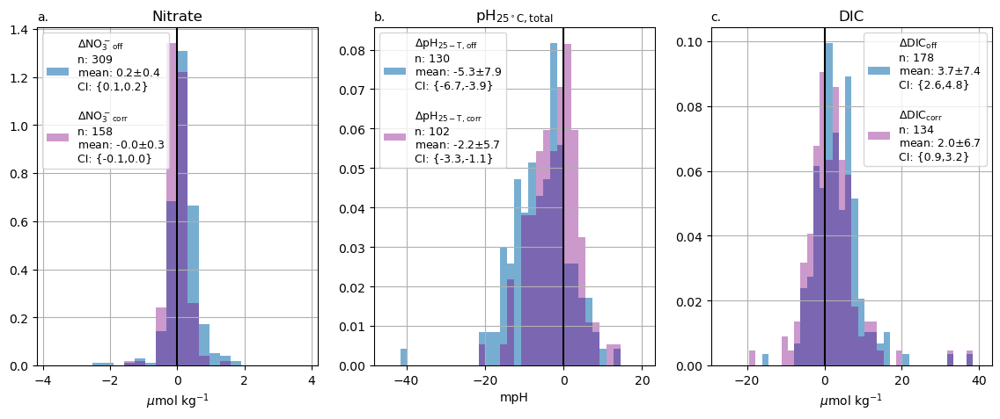

In [7]:
# adding corrected values for comparison
corrected_on = 1

if corrected_on==1:
    # corrected_path = argo_path + '../Corrected/output_100km_1400_to_2100_100m_0.005dens_0.005spice_ESPER_12/glodap_offset_plots/2024_03_20/'
    corrected_path = argo_path + '../Corrected/output_100km_1400_to_2100_100m_0.005dens_0.005spice_ESPER_14/glodap_offset_plots/2024_09_17/'

    corrected_glodap_offsets_mean = xr.load_dataset(corrected_path + 'glodap_offsets_100km_1400_to_2100_100m_0.005dens_0.005spice_ESPER_14_floatmean_withcalibration_depth_grouped_year_filt_0_5_level_1500.nc')
    # corrected_glodap_offsets_mean = xr.load_dataset(corrected_path + 'glodap_offsets_100km_1400_to_2100_100m_0.005dens_0.005spice_ESPER_12_floatmean_withcalibration_depth_grouped_year_filt_0_5_level_1500.nc')

    corrected_o2_offset_data_table = []


CI_level = 0.95
# plt.rcParams.update({'font.size': 12})
o2_offset_data_table = []

var_plot = ['NITRATE_ADJUSTED','pH_25C_TOTAL_ADJUSTED', 'DIC']
# var_plot = ['NITRATE_ADJUSTED','pH_25C_T_P1500', 'DIC']

plt.figure(figsize=(14,5))
for v, var in enumerate(var_plot):

    #All Float Crossovers
    plt.subplot(1,3,v+1)

    if var=='pH_25C_TOTAL_ADJUSTED':
        x_label = r'pH$_{{25}^\circ{\rm C,total}}$'
        x_label_units = 'mpH'
        legend_label = r'$\Delta$pH$_{\rm 25-T,}$'
        plt.xlabel(x_label_units)
        scale = 1000
        bin_v = np.linspace(-45, 20, 37)

    elif var=='pH_25C_T_P1500':
        x_label = r'pH$_{{25}^\circ{\rm C,total}}$'
        x_label_units = 'mpH'
        legend_label = r'$\Delta$pH$_{\rm 25-T,}$'
        plt.xlabel(x_label_units)
        scale = 1000
        bin_v = np.linspace(-45, 20, 37)
    elif var=='NITRATE_ADJUSTED':
        x_label = 'Nitrate'
        x_label_units = '$\mu$mol kg$^{-1}$'
        plt.xlabel(x_label_units)
        legend_label = '$\Delta$NO$_3^-$'
        scale = 1
        bin_v = np.linspace(-3.8, 3.8, 25)

    elif var=='DIC':
        x_label = 'DIC'
        x_label_units = '$\mu$mol kg$^{-1}$'
        plt.xlabel(x_label_units)
        legend_label = '$\Delta$DIC'
        scale = 1
        bin_v = np.linspace(-26, 40, 41)

    ncount = glodap_offsets_mean[var_plot[v] + '_offset'].count().values
    nmean = np.around(glodap_offsets_mean[var_plot[v] + '_offset'].mean().values*scale, decimals=1)
    nstd = np.around(glodap_offsets_mean[var_plot[v] + '_offset'].std().values*scale, decimals=1)
    nmedian = np.around(glodap_offsets_mean[var_plot[v] + '_offset'].median().values*scale, decimals=1)
    nmin = np.around(glodap_offsets_mean[var_plot[v] + '_offset'].min().values*scale, decimals=1)
    nmax = np.around(glodap_offsets_mean[var_plot[v] + '_offset'].max().values*scale, decimals=1)

    temp_var = glodap_offsets_mean[var_plot[v] + '_offset']*scale
    t_stat, p_value = stats.ttest_1samp(a=temp_var, popmean=0, nan_policy='omit') ############
    if p_value>.001:
        p_value = np.around(p_value, decimals=3)
    else:
        p_value = '<0.001'
    CI_vals = stats.norm.interval(confidence=CI_level, 
                    loc=np.nanmean(temp_var[~np.isnan(temp_var)].values), 
                    scale = stats.sem(temp_var[~np.isnan(temp_var)].values))
    CI_low = np.around(CI_vals[0], decimals=1)
    CI_high = np.around(CI_vals[1], decimals=1)
    o2_offset_data_table.append([var_plot[v], 
                                 ncount, 
                                 nmean, 
                                 nstd, 
                                 p_value, CI_low, CI_high, nmedian, nmin, nmax])
    plt.hist(glodap_offsets_mean[var_plot[v] + '_offset']*scale, alpha=0.6,
            label= legend_label + r'$_{\rm off}$' + '\nn: '+str(ncount) +  '\nmean: ' + str(nmean) + '$\pm$' + str(nstd) + 
         '\nCI: {' + str(CI_low) +',' +  str(CI_high) + '}\n',bins=bin_v, density=True) # ,label=str(n) #bins=np.linspace(-65, 65, 61),
    #print(np.around(glodap_offsets_mean['DOXY_ADJUSTED_offset_trimmed'].median().values, decimals=1))

    if corrected_on==1:
        ncount_corr = corrected_glodap_offsets_mean[var_plot[v] + '_offset'].count().values
        nmean_corr = np.around(corrected_glodap_offsets_mean[var_plot[v] + '_offset'].mean().values*scale, decimals=1)
        nstd_corr = np.around(corrected_glodap_offsets_mean[var_plot[v] + '_offset'].std().values*scale, decimals=1)
        nmedian_corr = np.around(corrected_glodap_offsets_mean[var_plot[v] + '_offset'].median().values*scale, decimals=1)
        nmin_corr = np.around(corrected_glodap_offsets_mean[var_plot[v] + '_offset'].min().values*scale, decimals=1)
        nmax_corr = np.around(corrected_glodap_offsets_mean[var_plot[v] + '_offset'].max().values*scale, decimals=1)

        temp_var_corr = corrected_glodap_offsets_mean[var_plot[v] + '_offset']*scale
        t_stat_corr, p_value_corr = stats.ttest_1samp(a=temp_var_corr, popmean=0, nan_policy='omit') ############
        if p_value_corr>.001:
            p_value_corr = np.around(p_value_corr, decimals=3)
        else:
            p_value_corr = '<0.001'
        CI_vals_corr = stats.norm.interval(confidence=CI_level, 
                        loc=np.nanmean(temp_var_corr[~np.isnan(temp_var_corr)].values), 
                        scale = stats.sem(temp_var_corr[~np.isnan(temp_var_corr)].values))
        CI_low_corr = np.around(CI_vals_corr[0], decimals=1)
        CI_high_corr = np.around(CI_vals_corr[1], decimals=1)

        corrected_o2_offset_data_table.append([var_plot[v], 
                                    ncount_corr, 
                                    nmean_corr, 
                                    nstd_corr, 
                                    p_value_corr, CI_low_corr, CI_high_corr, nmedian_corr, nmin_corr, nmax_corr])
        
        plt.hist(corrected_glodap_offsets_mean[var_plot[v] + '_offset']*scale, alpha=0.4,
                label=legend_label + r'$_{\rm corr}$' + '\nn: '+str(ncount_corr) +  '\nmean: ' + str(nmean_corr) + '$\pm$' + str(nstd_corr) + 
            '\nCI: {' + str(CI_low_corr) +',' +  str(CI_high_corr) + '}',bins=bin_v, density=True, color='purple')
    plt.grid()
    
    plt.title(x_label)
    if v==0:
        plt.title('a.', loc='left', fontsize='medium')
    elif v==1:
        plt.title('b.', loc='left', fontsize='medium')
    elif v==2:
        plt.title('c.', loc='left', fontsize='medium')
        
    # plt.ylabel('Count')
    plt.axvline(x=0, color='k')
    plt.legend(fontsize=9)
plt.tight_layout
plt.savefig(manuscript_figs + 'Fig_4 Glodap_offsets_DIC_Nitrate_pH_25C_total_all_corrected_'+ str(corrected_on) + code_ver + plot_ver + '.png', dpi=300)

print(tabulate(o2_offset_data_table, headers=['count', 'mean', 'std', 'p_value', str(CI_level*100) + '% CI low', str(CI_level*100) + '% CI high', 'median', 'min', 'max'], tablefmt='grid'))

headers=['Parameter', 'count', 'mean', 'SD', 'p_value', str(CI_level*100) + '% CI low', str(CI_level*100) + '% CI high', 'median', 'min', 'max']
# save the table as a word document
print_word_table(manuscript_figs + '/Tables/', 'Table_S3' + code_ver, 'Table S3.Statistics for Nitrate, pH 25C total, and DIC crossovers at 1500 db', headers, o2_offset_data_table)

if corrected_on==1:
    print(tabulate(corrected_o2_offset_data_table, headers=['count', 'mean', 'std', 'p_value', str(CI_level*100) + '% CI low', str(CI_level*100) + '% CI high', 'median', 'min', 'max'], tablefmt='grid'))

    headers=['Parameter', 'count', 'mean', 'SD', 'p_value', str(CI_level*100) + '% CI low', str(CI_level*100) + '% CI high', 'median', 'min', 'max']
    # save the table as a word document
    print_word_table(manuscript_figs + '/Tables/', 'Table_S4' + code_ver, 'Table S4.Statistics for Nitrate, pH 25C total, and DIC crossovers at 1500 db', headers, corrected_o2_offset_data_table)


### Calculating pH impact of oxygen bias

In [9]:
# prep for derived 2 & 3 calculations
from multiprocessing import Pool


# LIPHR_path = liar_dir

float_wmo_list = glodap_offsets_p.index.values
# MeasIDVec = [1, 7, 3, 6]
MeasIDVec_LIR = [1, 7, 6]
DesiredVariables_ESPER = [3]
MeasIDVec_ESPER = [1, 2, 6] # S, T, O2 - different numbering than v2 LIRs
Equations_ESPER = 7 # for ESPER - asking to use equation w/ S, T, and O2 only 
n=0
# wmo_n = float_wmo_list[n]
num_processes = 18 



In [10]:
# Derived 2 - pH and nitrate impacts
if __name__ == "__main__":
    
    with Pool(processes=num_processes) as pool:
        # Create a list of arguments for pool.starmap
        derived_2_args = [(liar_dir, MeasIDVec_LIR, MeasIDVec_ESPER, DesiredVariables_ESPER, Equations_ESPER, argo_path_derived, argo_path_interpolated, wmo_n, glodap_offsets_p) for wmo_n in float_wmo_list]
        # argo_args = [(argo_path, liar_dir, argo_path_interpolated, argo_path_derived, file, qc_data_fields, bgc_data_fields, p_interp, derived_list, interpolation_list) for file in argolist_run]
        
        # Use pool.starmap with the list of arguments
        pool.starmap(derived_functions.calc_derived_2_pH_no3_impacts, derived_2_args)
    

1902303 started
1902382 started
3901668 started
2903457 started
5903893 started
2903654 started
5904185 started
2903451 started
4903026 started
1902646 started
5904468 started
5904657 started
5904658 started
3901669 started
5904673 started
5904688 started
5904841 started
5904854 started
5904982 started
2903657 started
5905076 started
5905099 started
2903858 started
5905101 started
5904693 started
5905107 started
5903893 finished
5905132 started
2903858 finished
2903862 started
2903457 finished
2903614 started
2903648 started
5905368 started
5904693 finished
5904694 started
5904695 started
5905107 finished
5905109 started
5904468 finished
5904469 started
5904657 finished
5905635 started
5905636 started
5904185 finished
5904187 started
5904982 finished
5904983 started
5904673 finished
5904674 started
5905076 finished
5905077 started
5905079 started
5904854 finished
5904856 started
5904658 finished
5904659 started
1902303 finished
1902304 started
5904841 finished
5904842 started
1902646 f

Calculate and plot pCO2 impacts
Load all derived_2.nc files, read in offset and pH impacts, plot 

In [11]:
# Derived 3 - calculate pCO2 and DIC impacts from pH impacts
from importlib import reload

reload(derived_functions)

derivedlist = []
for file in os.listdir(argo_path_derived):
    if file.endswith('derived_2.nc'):
        derivedlist.append(file)

print(len(derivedlist))

if __name__ == "__main__":
    
    with Pool(processes=num_processes) as pool:
        # Create a list of arguments for pool.starmap
        derived_3_args = [(argo_path_derived, file) for file in derivedlist]
        
        # Use pool.starmap with the list of arguments
        pool.starmap(derived_functions.calc_derived_3_pCO2_impacts, derived_3_args)

177
Starting: 5906471_derived_2.nc
Starting: 5904660_derived_2.nc
Starting: 5906301_derived_2.nc
Starting: 5906571_derived_2.nc
Starting: 5905132_derived_2.nc
Starting: 5906340_derived_2.nc
Starting: 5906206_derived_2.nc
Starting: 5906519_derived_2.nc
Starting: 5904474_derived_2.nc
Starting: 5906512_derived_2.nc
Starting: 5906215_derived_2.nc
Starting: 6903575_derived_2.nc
Starting: 5906440_derived_2.nc
Starting: 5906437_derived_2.nc
Starting: 5906536_derived_2.nc
Starting: 5904187_derived_2.nc
Starting: 5906213_derived_2.nc
Starting: 5906513_derived_2.nc
Starting: 5906531_derived_2.nc
Starting: 5905075_derived_2.nc
Starting: 5904693_derived_2.nc
Starting: 7901095_derived_2.nc
Starting: 5906314_derived_2.nc
Starting: 5904675_derived_2.nc
Starting: 5906307_derived_2.nc
Starting: 5906553_derived_2.nc
Starting: 5905135_derived_2.nc
Starting: 5906247_derived_2.nc
Starting: 5904679_derived_2.nc
Starting: 5905972_derived_2.nc
Starting: 2903862_derived_2.nc
Starting: 5905992_derived_2.nc
Star

In [22]:
# read in "impacts", adjust original Sprof data by the mean impact amounts
air_cal_only=False

derivedlist = []
for file in os.listdir(argo_path_derived):
    if file.endswith('derived_3.nc'):
        if air_cal_only==True and glodap_offsets_p.loc[str(file[0:7]), "o2_calib_air_group"] == 'air cal':
            derivedlist.append(file)
        elif air_cal_only==False:
            derivedlist.append(file)

print(len(derivedlist))


177


Saving out nitrate, pH, O2, and DIC differences / impacts for corrected version of the data


In [23]:
for n in range(0, len(derivedlist)):

    print(f' {n}' ' File: ' + derivedlist[n]) 

    argo_n = xr.load_dataset(argo_path_derived+ derivedlist[n])

    wmo_n = argo_n['wmo']

    # oxygen bias/offset for this float
    o2_offset_n = glodap_offsets_p.DOXY_ADJUSTED_offset_trimmed[glodap_offsets_p.index==str(wmo_n.values)].values

   
    pH_1500_change_o2 = argo_n['pH_1500_O2_ADJUST_LIPHR'] - argo_n['pH_1500_orig_LIPHR'] # pH change at 1500m due to direct oxygen change
    pH_1500_change_o2_esper = argo_n['pH_1500_O2_ADJUST_ESPER'] - argo_n['pH_1500_orig_ESPER'] # pH change at 1500m due to direct oxygen change

    # print(pH_1500_change_o2)
    deep_1500m = argo_n.where(argo_n.PRES_ADJUSTED<1600, drop=False)
    deep_1500m = deep_1500m.where(deep_1500m.PRES_ADJUSTED>1400, drop=False)

    DIC_diff_1500 = deep_1500m.DIC_pH_O2_TALK_orig.mean(dim='N_LEVELS') - deep_1500m.DIC_pH_orig_TALK_orig.mean(dim='N_LEVELS')
    DIC_diff_1500_ESPER = deep_1500m.DIC_pH_O2_ESPER_TALK_orig.mean(dim='N_LEVELS') - deep_1500m.DIC_pH_orig_TALK_orig.mean(dim='N_LEVELS')

    # print(argo_path)
    corrected_path = argo_path + '../Corrected/Sprof/'

    if not os.path.isdir(corrected_path):
        os.mkdir(corrected_path)

    sprof_n = xr.load_dataset(argo_path + derivedlist[n][0:7] + '_Sprof.nc')

    impact_dataset = xr.Dataset()
    # print(sprof_n)
    if 'NITRATE_ADJUSTED' in argo_n.keys():
        no3_1500_change_o2 = argo_n['NO3_1500_o2_adjust'] - argo_n['NO3_1500_orig_LINR']

        # print(np.nanmean(sprof_n['NITRATE_ADJUSTED'].values))
        impact_dataset['mean_nitrate_impact_change'] = no3_1500_change_o2.mean()

    # print(np.nanmean(sprof_n['NITRATE_ADJUSTED'].values))
    impact_dataset['mean_O2_offset'] = o2_offset_n.item()

    impact_dataset['mean_pH_impact_change'] = pH_1500_change_o2_esper.mean()
    impact_dataset['mean_DIC_1500_impact_change'] = DIC_diff_1500_ESPER.mean()

    impact_dataset.to_netcdf(corrected_path + derivedlist[n][0:7] + '_impact.nc')
    # sprof_n.to_netcdf(corrected_path + derivedlist[n][0:7] + '_Sprof.nc')

    src = argo_path + derivedlist[n][0:7] + '_Sprof.nc'
    dst = corrected_path + derivedlist[n][0:7] + '_Sprof.nc'

    cmd = f'cp "{src}" "{dst}"'
    os.system(cmd)

    src = argo_path + derivedlist[n][0:7] + '_meta.nc'
    dst = corrected_path + derivedlist[n][0:7] + '_meta.nc'

    cmd = f'cp "{src}" "{dst}"'
    os.system(cmd)
    # break

 0 File: 5904678_derived_3.nc
 1 File: 5906436_derived_3.nc
 2 File: 5906340_derived_3.nc
 3 File: 5905972_derived_3.nc
 4 File: 5906237_derived_3.nc
 5 File: 5906513_derived_3.nc
 6 File: 7901095_derived_3.nc
 7 File: 5905135_derived_3.nc
 8 File: 5905132_derived_3.nc
 9 File: 5906553_derived_3.nc
 10 File: 5904695_derived_3.nc
 11 File: 5906471_derived_3.nc
 12 File: 5906307_derived_3.nc
 13 File: 5904472_derived_3.nc
 14 File: 5906246_derived_3.nc
 15 File: 5906213_derived_3.nc
 16 File: 5906562_derived_3.nc
 17 File: 5906440_derived_3.nc
 18 File: 2903862_derived_3.nc
 19 File: 5906214_derived_3.nc
 20 File: 5904187_derived_3.nc
 21 File: 5906525_derived_3.nc
 22 File: 5906522_derived_3.nc
 23 File: 5906206_derived_3.nc
 24 File: 5904693_derived_3.nc
 25 File: 5906224_derived_3.nc
 26 File: 5906301_derived_3.nc
 27 File: 5906507_derived_3.nc
 28 File: 6903551_derived_3.nc
 29 File: 5904474_derived_3.nc
 30 File: 5906236_derived_3.nc
 31 File: 5905973_derived_3.nc
 32 File: 5906512_

### Plot / save pCO2 impacts for figures

In [14]:
# plotting pCO2 impacts for floats and saving out results 

air_cal_only=True
show_plot=False
save_plot=False

derivedlist = []
for file in os.listdir(argo_path_derived):
    if file.endswith('derived_3.nc'):
        if air_cal_only==True and glodap_offsets_p.loc[str(file[0:7]), "o2_calib_air_group"] == 'air cal':
            derivedlist.append(file)
        elif air_cal_only==False:
            derivedlist.append(file)
o2_impact_no3 = pd.DataFrame(columns=['o2_bias', 'no3_impact', 'o2_conc', 'long', 'lat', 'wmo'])
no_o2_impact_no3 = pd.DataFrame(columns=['o2_bias', 'no3_impact', 'o2_conc', 'long', 'lat', 'wmo'])

o2_impact_direct = pd.DataFrame(columns=['o2_bias', 'pH_impact', 'pCO2_impact', 'dic_impact_surf','dic_impact_1500', 'o2_conc', 'long', 'lat', 'wmo','pH'])
o2_impact_direct_esper = pd.DataFrame(columns=['o2_bias', 'pH_impact', 'pCO2_impact','dic_impact_surf','dic_impact_1500','o2_conc', 'long', 'lat', 'wmo'])
no_o2_impact_direct_esper = pd.DataFrame(columns=['o2_bias', 'pH_impact', 'pCO2_impact','dic_impact_surf','dic_impact_1500','o2_conc', 'long', 'lat', 'wmo'])


o2_impact_seasonal = pd.DataFrame(columns=['wmo','o2_bias','long', 'lat', 'day_of_year',
                                           'pCO2_diff_surface_pH_o2_TALK_orig',
                                           'pCO2_diff_surface_pH_o2_esper_TALK_orig' ])
# o2_impact_seasonal = pd.DataFrame(columns=['wmo','o2_conc','dayofyear', 'long', 'lat', 
#                                            'pCO2_diff_surface_pH_o2_TALK_orig',
#                                              'pCO2_diff_surface_pH_o2_esper_TALK_orig'])
# o2_no3_impact_pH_TA = pd.DataFrame(columns=['o2_bias', 'pCO2_impact', 'o2_conc'])

#pCO2_impact = list()


#o2_offset_3 = list()
# last=0

print(len(derivedlist))


for n in range(0, len(derivedlist)):

                
        print(f' {n}' ' File: ' + derivedlist[n]) 
        argo_n = xr.load_dataset(argo_path_derived+ derivedlist[n])

        wmo_n = argo_n['wmo']

        # oxygen bias/offset for this float
        o2_offset_n = glodap_offsets_p.DOXY_ADJUSTED_offset_trimmed[glodap_offsets_p.index==str(wmo_n.values)].values
        lat_n = glodap_offsets_p.main_float_latitude[glodap_offsets_p.index==str(wmo_n.values)].values
        long_n = glodap_offsets_p.main_float_longitude[glodap_offsets_p.index==str(wmo_n.values)].values

        # pH changes 
        pH_1500_change_o2 = argo_n['pH_1500_O2_ADJUST_LIPHR'] - argo_n['pH_1500_orig_LIPHR'] # pH change at 1500m due to direct oxygen change
        pH_1500_change_o2_esper = argo_n['pH_1500_O2_ADJUST_ESPER'] - argo_n['pH_1500_orig_ESPER'] # pH change at 1500m due to direct oxygen change
        pH_1500_remove_o2_esper = argo_n['pH_1500_ESPER_wo_O2'] - argo_n['pH_1500_orig_ESPER'] # pH change at 1500m if ESPER is used w/o oxygen at all 

        # create an index of the upper 25 m 
        upper_25m = argo_n.where(argo_n.PRES_ADJUSTED<25, drop=False)

        # create an index of 1400-1600 m 
        deep_1500m = argo_n.where(argo_n.PRES_ADJUSTED<1600, drop=False)
        deep_1500m = deep_1500m.where(deep_1500m.PRES_ADJUSTED>1400, drop=False)

        # LIPHR pCO2 change at surface due to direct oxygen impact 
        pCO2_diff_surface_pH_o2_TALK_orig = upper_25m.pCO2_pH_O2_TALK_orig.mean(dim='N_LEVELS') - upper_25m.pCO2_pH_orig_TALK_orig.mean(dim='N_LEVELS')
        DIC_diff_surface_pH_o2_TALK_orig = upper_25m.DIC_pH_O2_TALK_orig.mean(dim='N_LEVELS') - upper_25m.DIC_pH_orig_TALK_orig.mean(dim='N_LEVELS')

        # ESPER pCO2 change at surface due to direct oxygen impact 
        pCO2_diff_surface_pH_o2_esper_TALK_orig = upper_25m.pCO2_pH_O2_ESPER_TALK_orig.mean(dim='N_LEVELS') - upper_25m.pCO2_pH_orig_TALK_orig.mean(dim='N_LEVELS')
        DIC_diff_surface_pH_o2_esper_TALK_orig = upper_25m.DIC_pH_O2_ESPER_TALK_orig.mean(dim='N_LEVELS') - upper_25m.DIC_pH_orig_TALK_orig.mean(dim='N_LEVELS')

         # ESPER pCO2 change at surface due to removing oxygen 
        pCO2_diff_surface_pH_no_o2_esper_TALK_orig = upper_25m.pCO2_pH_wo_O2_ESPER_TALK_orig.mean(dim='N_LEVELS') - upper_25m.pCO2_pH_orig_TALK_orig.mean(dim='N_LEVELS')
        DIC_diff_surface_pH_no_o2_esper_TALK_orig = upper_25m.DIC_pH_wo_O2_ESPER_TALK_orig.mean(dim='N_LEVELS') - upper_25m.DIC_pH_orig_TALK_orig.mean(dim='N_LEVELS')

        # LIPHR 1500 m differences
        pCO2_diff_1500 = deep_1500m.pCO2_pH_O2_TALK_orig.mean(dim='N_LEVELS') - deep_1500m.pCO2_pH_orig_TALK_orig.mean(dim='N_LEVELS')
        DIC_diff_1500 = deep_1500m.DIC_pH_O2_TALK_orig.mean(dim='N_LEVELS') - deep_1500m.DIC_pH_orig_TALK_orig.mean(dim='N_LEVELS')

        # ESPER 1500 m differences
        DIC_diff_1500_ESPER = deep_1500m.DIC_pH_O2_ESPER_TALK_orig.mean(dim='N_LEVELS') - deep_1500m.DIC_pH_orig_TALK_orig.mean(dim='N_LEVELS')

        # ESPER 1500 m no o2 differences
        DIC_diff_1500_ESPER_no_o2 = deep_1500m.DIC_pH_wo_O2_ESPER_TALK_orig.mean(dim='N_LEVELS') - deep_1500m.DIC_pH_orig_TALK_orig.mean(dim='N_LEVELS')

   #     TALK_o2_adjust_diff_1500 = deep_1500m.TALK_w_O2_ADJUST.mean(dim='N_LEVELS') - deep_1500m.TALK_LIAR.mean(dim='N_LEVELS')
   #     TALK_o2_adjust_diff_1500_v2 = argo_n['TALK_1500_O2_ADJUST_LIAR'] - argo_n['TALK_1500_orig_LIAR']

        # save impacts due to direct o2 impacts alone
        new_data_o2_direct_impact = [(o2_offset_n.item(), 
                                      pH_1500_change_o2.mean().item(), 
                                      pCO2_diff_surface_pH_o2_TALK_orig.mean().item(),
                                      DIC_diff_surface_pH_o2_TALK_orig.mean().item(),
                                      DIC_diff_1500.mean().item(),
                                      deep_1500m.DOXY_ADJUSTED.mean().item(),
                                      long_n.item(),
                                      lat_n.item(),
                                      wmo_n.item(),
                                      deep_1500m.PH_IN_SITU_TOTAL_ADJUSTED.mean().item())]
        new_df_o2_direct_impact= pd.DataFrame(new_data_o2_direct_impact, columns=['o2_bias', 'pH_impact',
                                                                                   'pCO2_impact', 
                                                                                   'dic_impact_surf',
                                                                                   'dic_impact_1500', 'o2_conc', 'long', 'lat', 'wmo','pH'])
        o2_impact_direct = pd.concat([o2_impact_direct, new_df_o2_direct_impact], ignore_index=True)


        # save impacts due to direct o2 impacts alone
        new_data_o2_direct_impact_esper = [(o2_offset_n.item(), 
                                      pH_1500_change_o2_esper.mean().item(), 
                                      pCO2_diff_surface_pH_o2_esper_TALK_orig.mean().item(),
                                      DIC_diff_surface_pH_o2_esper_TALK_orig.mean().item(),
                                      DIC_diff_1500_ESPER.mean().item(),
                                      deep_1500m.DOXY_ADJUSTED.mean().item(),
                                      long_n.item(),
                                      lat_n.item(),
                                      wmo_n.item())]
        new_df_o2_direct_impact_esper= pd.DataFrame(new_data_o2_direct_impact_esper, columns=['o2_bias', 'pH_impact', 'pCO2_impact', 'dic_impact_surf','dic_impact_1500', 'o2_conc', 'long', 'lat', 'wmo'])
        o2_impact_direct_esper = pd.concat([o2_impact_direct_esper, new_df_o2_direct_impact_esper], ignore_index=True)

        # save impacts due to removing o2 alone
        new_data_no_o2_direct_esper = [(o2_offset_n.item(), 
                                      pH_1500_remove_o2_esper.mean().item(), 
                                      pCO2_diff_surface_pH_no_o2_esper_TALK_orig.mean().item(),
                                      DIC_diff_surface_pH_no_o2_esper_TALK_orig.mean().item(),
                                      DIC_diff_1500_ESPER_no_o2.mean().item(),
                                      deep_1500m.DOXY_ADJUSTED.mean().item(),
                                      long_n.item(),
                                      lat_n.item(),
                                      wmo_n.item())]
        new_df_no_o2_direct_esper= pd.DataFrame(new_data_no_o2_direct_esper, columns=['o2_bias', 'pH_impact', 'pCO2_impact', 'dic_impact_surf','dic_impact_1500', 'o2_conc', 'long', 'lat', 'wmo'])
        no_o2_impact_direct_esper = pd.concat([no_o2_impact_direct_esper, new_df_no_o2_direct_esper], ignore_index=True)

        new_data_o2_impact_seasonal = pd.DataFrame({
                'wmo': np.ones(argo_n.LONGITUDE[~np.isnan(pCO2_diff_surface_pH_o2_TALK_orig)].shape[0])*argo_n.wmo.values,
                'o2_bias': np.ones(argo_n.LONGITUDE[~np.isnan(pCO2_diff_surface_pH_o2_TALK_orig)].shape[0])*o2_offset_n.item(),
                'long': argo_n.LONGITUDE[~np.isnan(pCO2_diff_surface_pH_o2_TALK_orig)].values.tolist(),
                'lat': argo_n.LATITUDE[~np.isnan(pCO2_diff_surface_pH_o2_TALK_orig)].values.tolist(),
                'day_of_year': argo_n.JULD_LOCATION[~np.isnan(pCO2_diff_surface_pH_o2_TALK_orig)].dt.dayofyear.values.tolist(),
                'pCO2_diff_surface_pH_o2_TALK_orig': pCO2_diff_surface_pH_o2_TALK_orig[~np.isnan(pCO2_diff_surface_pH_o2_TALK_orig)].values.tolist(),
                'pCO2_diff_surface_pH_o2_esper_TALK_orig': pCO2_diff_surface_pH_o2_esper_TALK_orig[~np.isnan(pCO2_diff_surface_pH_o2_TALK_orig)].values.tolist()

        })

        # Concatenate the new DataFrame to o2_impact_seasonal
        o2_impact_seasonal = pd.concat([o2_impact_seasonal, new_data_o2_impact_seasonal], ignore_index=True)
        # # calculate seasonal impacts on pCO2
        # new_data_o2_impact_seasonal = [(argo_n.LONGITUDE[~np.isnan(pCO2_diff_surface_pH_o2_TALK_orig)].values.tolist(),
        #                                 argo_n.LATITUDE[~np.isnan(pCO2_diff_surface_pH_o2_TALK_orig)].values.tolist(),
        #                                 pCO2_diff_surface_pH_o2_TALK_orig[~np.isnan(pCO2_diff_surface_pH_o2_TALK_orig)].values.tolist())]
        # new_df_o2_impact_seasonal= pd.DataFrame(new_data_o2_impact_seasonal, columns=['long', 'lat', 'pCO2_diff_surface_pH_o2_TALK_orig'])
        # o2_impact_seasonal = pd.concat([o2_impact_seasonal, new_df_o2_impact_seasonal], ignore_index=True)

        # nitrate impacts, if nitrate is present
        if 'NITRATE_ADJUSTED' in argo_n.keys():
                # pH_1500_change_o2_no3 = argo_n['pH_1500_o2_no3_LIPHR'] - argo_n['pH_1500_orig_LIPHR']# pH change at 1500m due to both oxygen and no3 change
                # pH_1500_change_no3 = argo_n['pH_1500_no3_LIPHR'] - argo_n['pH_1500_orig_LIPHR']# pH change at 1500m due to no3 alone
                # pH_1500_change_no3_v2 = deep_1500m.PH_w_NO3_ADJUST.mean(dim='N_LEVELS') - deep_1500m.PH_IN_SITU_TOTAL_ADJUSTED.mean(dim='N_LEVELS')
               
                # NO3 change due to oxygen bias adjustment 
                no3_1500_change_o2 = argo_n['NO3_1500_o2_adjust'] - argo_n['NO3_1500_orig_LINR']
                no3_1500_remove_o2 = argo_n['NO3_1500_no_o2'] - argo_n['NO3_1500_orig_LINR']

                no3_1500_change_o2_v2 = deep_1500m.NITRATE_ADJUSTED_w_O2_ADJUST.mean(dim='N_LEVELS') - deep_1500m.NITRATE_ADJUSTED.mean(dim='N_LEVELS')

                # # Impact on TA from no3 alone
                # TALK_no3_adjust_surf = upper_25m.TALK_w_NO3_ADJUST.mean(dim='N_LEVELS') - upper_25m.TALK_LIAR.mean(dim='N_LEVELS')
                # TALK_no3_adjust_diff_1500 = deep_1500m.TALK_w_NO3_ADJUST.mean(dim='N_LEVELS') - deep_1500m.TALK_LIAR.mean(dim='N_LEVELS')

                # # pCO2 change at surface due to no3 impact on TA and pH
                # pCO2_diff_surface_pH_NO3_TALK_orig = upper_25m.pCO2_pH_NO3_TALK_orig.mean(dim='N_LEVELS') - upper_25m.pCO2_pH_orig_TALK_orig.mean(dim='N_LEVELS')

                # # pCO2 change at surface due to o2 and no3 impact on pH (no TA change)
                # pCO2_diff_surface_pH_o2_no3_TALK_orig = upper_25m.pCO2_pH_O2_NO3_TALK_orig.mean(dim='N_LEVELS') - upper_25m.pCO2_pH_orig_TALK_orig.mean(dim='N_LEVELS')

                # #pCO2 change at surface due to O2 and NO3 on pH and NO3 on Alk
                # pCO2_diff_surface_pH_o2_no3_TALK_no3 = \
                #         upper_25m.pCO2_pH_O2_NO3_TALK_NO3.mean(dim='N_LEVELS') - upper_25m.pCO2_pH_orig_TALK_orig.mean(dim='N_LEVELS')

                # # pCO2 change at surface due to no3 impact on alkalinity alone
                # pCO2_diff_surface_pH_orig_TALK_no3 = upper_25m.pCO2_pH_orig_TALK_NO3.mean(dim='N_LEVELS') - upper_25m.pCO2_pH_orig_TALK_orig.mean(dim='N_LEVELS')

                # save impacts due to o2 effect on no3 only        
                new_data_o2_impact_no3 = [(o2_offset_n.item(), 
                                                no3_1500_change_o2.mean().item(),  
                                                deep_1500m.DOXY_ADJUSTED.mean().item(),
                                                long_n.item(),
                                                lat_n.item(),
                                                wmo_n.item())]
                new_df_o2_impact_no3 = pd.DataFrame(new_data_o2_impact_no3, 
                                                        columns=['o2_bias', 'no3_impact', 'o2_conc', 'long', 'lat', 'wmo'])
                o2_impact_no3 = pd.concat([o2_impact_no3, new_df_o2_impact_no3], ignore_index=True)

                # save impacts due to removing o2 on no3 only        
                new_data_no_o2_no3 = [(o2_offset_n.item(), 
                                                no3_1500_remove_o2.mean().item(),  
                                                deep_1500m.DOXY_ADJUSTED.mean().item(),
                                                long_n.item(),
                                                lat_n.item(),
                                                wmo_n.item())]
                new_df_no_o2_no3 = pd.DataFrame(new_data_no_o2_no3, 
                                                        columns=['o2_bias', 'no3_impact', 'o2_conc', 'long', 'lat', 'wmo'])
                no_o2_impact_no3 = pd.concat([no_o2_impact_no3, new_df_no_o2_no3], ignore_index=True)
                

                #  # save impacts on pH and pCO2 due to oxygen and nitrate changes (but no TA impact)
                # new_data_o2_no3_impact_pH = [(o2_offset_n.item(), 
                #                         pH_1500_change_o2_no3.mean().item(), 
                #                         pCO2_diff_surface_pH_o2_no3_TALK_orig.mean().item(),
                #                         deep_1500m.DOXY_ADJUSTED.mean().item(),
                #                         long_n.item(),
                #                         lat_n.item(),
                #                         wmo_n.item())]
                # new_df_o2_no3_impact_pH = pd.DataFrame(new_data_o2_no3_impact_pH, columns=['o2_bias', 'pH_impact', 'pCO2_impact', 'o2_conc', 'long', 'lat', 'wmo'])
                # o2_no3_impact_pH = pd.concat([o2_no3_impact_pH, new_df_o2_no3_impact_pH], ignore_index=True)

                # # save impacts on pCO2 due to O2 and NO3 on pH and NO3 on TA
                # new_data_o2_no3_impact_pH_no3_impact_TA = [(o2_offset_n.item(), 
                #                         pCO2_diff_surface_pH_o2_no3_TALK_no3.mean().item(),
                #                         deep_1500m.DOXY_ADJUSTED.mean().item())]
                # new_df_o2_no3_impact_pH_no3_impact_TA = pd.DataFrame(new_data_o2_no3_impact_pH_no3_impact_TA, columns=['o2_bias', 'pCO2_impact', 'o2_conc'])
                # o2_no3_impact_pH_TA = pd.concat([o2_no3_impact_pH_TA, new_df_o2_no3_impact_pH_no3_impact_TA], ignore_index=True)

      
     
        if save_plot is False:
                continue
        else:
                # plot variables and differences 
                plt.figure(figsize=(14,18))

                # pH
                plt.subplot(5,3,1)
                #plt.plot(argo_n.JULD_LOCATION, upper_25m.pCO2_pH_corr.mean(dim='N_LEVELS'))
                plt.plot(argo_n.JULD_LOCATION, upper_25m.PH_IN_SITU_TOTAL_ADJUSTED.mean(dim='N_LEVELS'), label='pH orig', marker='x', color='k')
                plt.plot(argo_n.JULD_LOCATION, upper_25m.PH_IN_SITU_TOTAL_ADJUSTED_w_O2_ADJUST.mean(dim='N_LEVELS'), marker='o', color='m', label='pH + O2 Impact')
                plt.plot(argo_n.JULD_LOCATION, upper_25m.PH_IN_SITU_TOTAL_ADJUSTED_w_O2_ADJUST_ESPER.mean(dim='N_LEVELS'), 
                         marker='+', color='g', label='pH ESPER + O2 Impact')

                # if 'NITRATE_ADJUSTED' in argo_n.keys():
                #         plt.plot(argo_n.JULD_LOCATION, upper_25m.PH_w_O2_NO3_ADJUST.mean(dim='N_LEVELS'), marker='+', color='g', label='pH + O2 NO3 Impact')
                #         plt.plot(argo_n.JULD_LOCATION, upper_25m.PH_w_NO3_ADJUST.mean(dim='N_LEVELS'), marker='*', color='b', label='pH + O2 NO3 Impact')

                plt.xlim([pd.Series(argo_n.JULD_LOCATION).min(), pd.Series(argo_n.JULD_LOCATION).max()])
                plt.legend()
                plt.title(str(wmo_n.values) + ', O2 bias= ' + "%.2f" % o2_offset_n + ' umol kg-1')
                plt.xticks(rotation=45)

                # pH differences at 1500 m
                plt.subplot(5,3,2)
                plt.plot(argo_n.JULD_LOCATION, pH_1500_change_o2*1000, marker='o', color='m', label = 'pH, O2 direct ' + "%.2f" % np.nanmean(pH_1500_change_o2*1000))
                plt.plot(argo_n.JULD_LOCATION, pH_1500_change_o2_esper*1000, marker='+', color='g', 
                         label = 'pH ESPER, O2 direct ' + "%.2f" % np.nanmean(pH_1500_change_o2_esper*1000))

                # if 'NITRATE_ADJUSTED' in argo_n.keys():
                #         plt.plot(argo_n.JULD_LOCATION, pH_1500_change_o2_no3*1000, marker='+', color='g', label = 'pH, O2 NO3 impact ' + "%.2f" % np.nanmean(pH_1500_change_o2_no3*1000))
                #         plt.plot(argo_n.JULD_LOCATION, pH_1500_change_no3*1000, marker='*', color='b', label = 'pH, NO3 alone ' + "%.2f" % np.nanmean(pH_1500_change_no3*1000))
                        #plt.plot(argo_n.JULD_LOCATION, pH_1500_change_no3_v2*1000, marker='*', color='y', label = 'pH, NO3 alone ' + "%.2f" % np.nanmean(pH_1500_change_no3_v2*1000))
                plt.legend()
                plt.xticks(rotation=45)
                plt.title('pH diff at 1500 m (mpH)')
                plt.xlim([pd.Series(argo_n.JULD_LOCATION).min(), pd.Series(argo_n.JULD_LOCATION).max()])

                if 'NITRATE_ADJUSTED' in argo_n.keys():

                        # Nitrate
                        plt.subplot(5,3,4)
                        plt.plot(argo_n.JULD_LOCATION, upper_25m.NITRATE_ADJUSTED.mean(dim='N_LEVELS'), label='NO3 orig')
                        plt.plot(argo_n.JULD_LOCATION, upper_25m.NITRATE_ADJUSTED_w_O2_ADJUST.mean(dim='N_LEVELS'), label='NO3, O2 Impact')
                        plt.legend()
                        plt.title('Nitrate')
                        plt.xticks(rotation=45)
                        plt.xlim([pd.Series(argo_n.JULD_LOCATION).min(), pd.Series(argo_n.JULD_LOCATION).max()])

                        plt.subplot(5,3,5)
                        plt.plot(argo_n.JULD_LOCATION, no3_1500_change_o2, label = 'NO3, O2 impact ' + "%.2f" % np.nanmean(no3_1500_change_o2))
                        
                        #plt.plot(argo_n.JULD_LOCATION, no3_1500_change_o2_v2, label = 'NO3, O2 impact ' + "%.2f" % np.nanmean(no3_1500_change_o2_v2))
                        plt.legend()
                        plt.xticks(rotation=45)
                        plt.title('NO3 diff at 1500 m (umol/kg)')
                        plt.xlim([pd.Series(argo_n.JULD_LOCATION).min(), pd.Series(argo_n.JULD_LOCATION).max()])

                # TALK
                plt.subplot(5,3,7)
                plt.plot(argo_n.JULD_LOCATION, upper_25m.TALK_LIAR.mean(dim='N_LEVELS'), label='pH no bias corr + O2 Impact')
                plt.title('TALK from LIAR algorithm')
                plt.xticks(rotation=45)
                plt.xlim([pd.Series(argo_n.JULD_LOCATION).min(), pd.Series(argo_n.JULD_LOCATION).max()])

                # plt.subplot(5,3,8)
                # # if 'NITRATE_ADJUSTED' in argo_n.keys():
                # #         plt.plot(argo_n.JULD_LOCATION, TALK_no3_adjust_diff_1500, label = 'NO3 impact ' + "%.2f" % np.nanmean(TALK_no3_adjust_diff_1500))

                # # plt.plot(argo_n.JULD_LOCATION, TALK_o2_adjust_diff_1500, label = 'O2 impact ' + "%.2f" % np.nanmean(TALK_o2_adjust_diff_1500))
                # # plt.plot(argo_n.JULD_LOCATION, TALK_o2_adjust_diff_1500_v2, label = 'O2 impact v2' + "%.2f" % np.nanmean(TALK_o2_adjust_diff_1500_v2))
                # plt.xlim([pd.Series(argo_n.JULD_LOCATION).min(), pd.Series(argo_n.JULD_LOCATION).max()])

                # plt.title('TALK diff at 1500 m (umol/kg)')
                # plt.legend()

                # plt.xticks(rotation=45)

                # if 'NITRATE_ADJUSTED' in argo_n.keys():
                #         plt.subplot(5,3,9)
                #         plt.plot(argo_n.JULD_LOCATION, TALK_no3_adjust_surf, label = 'NO3 impact ' + "%.2f" % np.nanmean(TALK_no3_adjust_surf))
                #         plt.legend()
                #         plt.title('TALK diff upper 25 m (umol/kg)')
                #         plt.xticks(rotation=45)

                # pCO2 
                plt.subplot(5,3,10)
                plt.plot(argo_n.JULD_LOCATION, upper_25m.pCO2_pH_orig_TALK_orig.mean(dim='N_LEVELS'),
                        marker='x', color='k', label='pH: orig; TA: orig')
                plt.plot(argo_n.JULD_LOCATION, upper_25m.pCO2_pH_O2_TALK_orig.mean(dim='N_LEVELS'), 
                        marker='o', color='m', label='pH: O2; TA: orig')
                plt.plot(argo_n.JULD_LOCATION, upper_25m.pCO2_pH_O2_ESPER_TALK_orig.mean(dim='N_LEVELS'), 
                        marker='+', color='g', label='pH ESPER: O2; TA: orig')
                # if 'NITRATE_ADJUSTED' in argo_n.keys():
                #         # plt.plot(argo_n.JULD_LOCATION, upper_25m.pCO2_pH_orig_TALK_NO3.mean(dim='N_LEVELS'), 
                #         #         marker='*', color='b', label='pH: orig; TA: NO3')
                #         plt.plot(argo_n.JULD_LOCATION, upper_25m.pCO2_pH_O2_NO3_TALK_orig.mean(dim='N_LEVELS'), 
                #                 marker='+', color='g', label= 'pH: O2, NO3; TA: orig')
                #         # plt.plot(argo_n.JULD_LOCATION, upper_25m.pCO2_pH_O2_NO3_TALK_NO3.mean(dim='N_LEVELS'), 
                #         #         marker='s', color='c', label= 'pH: O2, NO3; TA: NO3')
                plt.xlim([pd.Series(argo_n.JULD_LOCATION).min(), pd.Series(argo_n.JULD_LOCATION).max()])

                plt.title('pCO2')
                plt.legend()
                plt.xticks(rotation=45)

                #        plt.subplot(5,3,11)
                #plt.plot(argo_n.JULD_LOCATION, pCO2_diff_1500, marker='x',
                #        label='pH + O2 Impact ' + "%.2f" % np.nanmean(pCO2_diff_1500))
                #plt.legend()
                #plt.xticks(rotation=45)
                #plt.title('pCO2 diff at 1500 m (uatm)')

                plt.subplot(5,3,12)
                plt.plot(argo_n.JULD_LOCATION, pCO2_diff_surface_pH_o2_TALK_orig,  marker='o', color='m',
                        label='pH: O2; TA: orig ' + "%.2f" % np.nanmean(pCO2_diff_surface_pH_o2_TALK_orig))
                plt.plot(argo_n.JULD_LOCATION, pCO2_diff_surface_pH_o2_esper_TALK_orig,  marker='+', color='g',
                        label='pH ESPER: O2; TA: orig ' + "%.2f" % np.nanmean(pCO2_diff_surface_pH_o2_esper_TALK_orig))
                
                # if 'NITRATE_ADJUSTED' in argo_n.keys():
                #         # plt.plot(argo_n.JULD_LOCATION, pCO2_diff_surface_pH_orig_TALK_no3,  marker='*', color='b',
                #         #         label='pH: orig; TA: NO3 ' + "%.2f" % np.nanmean(pCO2_diff_surface_pH_orig_TALK_no3))
                #         plt.plot(argo_n.JULD_LOCATION, pCO2_diff_surface_pH_o2_no3_TALK_orig, marker='+', color='g',
                #                 label='pH: O2, NO3; TA: orig ' + "%.2f" % np.nanmean(pCO2_diff_surface_pH_o2_no3_TALK_orig))
                #         # plt.plot(argo_n.JULD_LOCATION, pCO2_diff_surface_pH_o2_no3_TALK_no3,
                #         #         label='pH: O2, NO3; TA: NO3 ' + "%.2f" % np.nanmean(pCO2_diff_surface_pH_o2_no3_TALK_no3))
                plt.legend()
                plt.xticks(rotation=45)
                plt.title('pCO2 diff at surface')

                # plt.subplot(5,3,5)
                # #plt.plot(argo_n.JULD_LOCATION, upper_25m.pCO2_pH_corr.mean(dim='N_LEVELS'))
                # if pCO2_diff.isnull().sum()!=len(pCO2_diff):
                #     plt.hist(pCO2_diff)
                
                # plt.title('pCO2 O2 impact minus pCO2 orig: mean ' + "%.2f" % np.mean(pCO2_diff))
                plt.tight_layout()

                plt.savefig(output_dir_figs + 'pCO2_impacts_by_float/' + str(wmo_n.values) + '_pCO2_impact' + code_ver + plot_ver + '.png')

                if show_plot is False:
                        plt.close()
                last = n

153
 0 File: 5904678_derived_3.nc
 1 File: 5906436_derived_3.nc
 2 File: 5906340_derived_3.nc
 3 File: 5905972_derived_3.nc
 4 File: 5906237_derived_3.nc
 5 File: 5906513_derived_3.nc
 6 File: 5905135_derived_3.nc
 7 File: 5905132_derived_3.nc
 8 File: 5906553_derived_3.nc
 9 File: 5904695_derived_3.nc
 10 File: 5906471_derived_3.nc
 11 File: 5904472_derived_3.nc
 12 File: 5906246_derived_3.nc
 13 File: 5906213_derived_3.nc
 14 File: 5906562_derived_3.nc
 15 File: 5906440_derived_3.nc
 16 File: 2903862_derived_3.nc
 17 File: 5906214_derived_3.nc
 18 File: 5906525_derived_3.nc
 19 File: 5906522_derived_3.nc
 20 File: 5906206_derived_3.nc
 21 File: 5904693_derived_3.nc
 22 File: 5906224_derived_3.nc
 23 File: 5906301_derived_3.nc
 24 File: 5906507_derived_3.nc
 25 File: 6903551_derived_3.nc
 26 File: 5904474_derived_3.nc
 27 File: 5906236_derived_3.nc
 28 File: 5905973_derived_3.nc
 29 File: 5906512_derived_3.nc
 30 File: 5906314_derived_3.nc
 31 File: 5906515_derived_3.nc
 32 File: 5906

### Figure S3 Nitrate Impact plot

/var/folders/7r/4f_w_nb56llcwh96t_pjq_qh0000gn/T/ipykernel_27613/2518529142.py:8: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  plt.subplot(121)


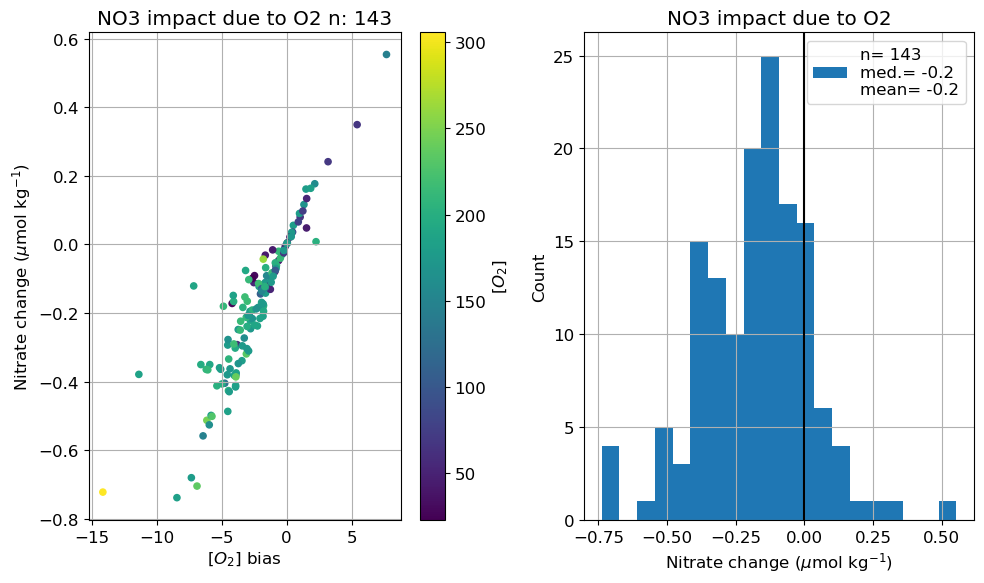

In [15]:
# unused? 

# Figure plotting
# Nitrate impact plot

fig = plt.subplots(figsize=(10,6))

plt.subplot(121)
pos = plt.scatter(o2_impact_no3['o2_bias'], o2_impact_no3['no3_impact'], 20, o2_impact_no3['o2_conc'])
plt.title('NO3 impact due to O2' + ' n: ' + str(len(o2_impact_no3['o2_conc'])))
plt.ylabel(r'Nitrate change ($\mu$mol kg$^{-1}$)')
plt.xlabel('$[O_{2}]$ bias')

cbar = plt.colorbar(pos)
cbar.set_label('$[O_{2}]$')
plt.grid()


plt.subplot(122)
nmedian = np.around(o2_impact_no3['no3_impact'].median(), decimals=1)
nmean = np.around(o2_impact_no3['no3_impact'].mean(), decimals=1)

pos = plt.hist(o2_impact_no3['no3_impact'], bins=20, label='n= ' + str(o2_impact_no3['no3_impact'].count()) + '\nmed.= '+str(nmedian) + '\nmean= '+str(nmean) )
plt.title('NO3 impact due to O2')
plt.xlabel(r'Nitrate change ($\mu$mol kg$^{-1}$)')# plt.xlabel(r'DOXY Offset ($\mu$mol kg$^{-1}$)')

plt.ylabel('Count')
plt.grid()

plt.axvline(x=0, color='k')
plt.legend()
plt.tight_layout()
# plt.show()

if air_cal_only==True:
    plot_filename = 'Fig_S3 NO3 impacts due to O2 bias - scatter plot - air_cal_only'
else:
    plot_filename = 'Fig_S3 impacts due to O2 bias - scatter plot - all pH floats'

plt.savefig(manuscript_figs + plot_filename + code_ver + plot_ver + '.png', dpi=300)


### Figure 5. pH and pCO2 impacts

0
1
2


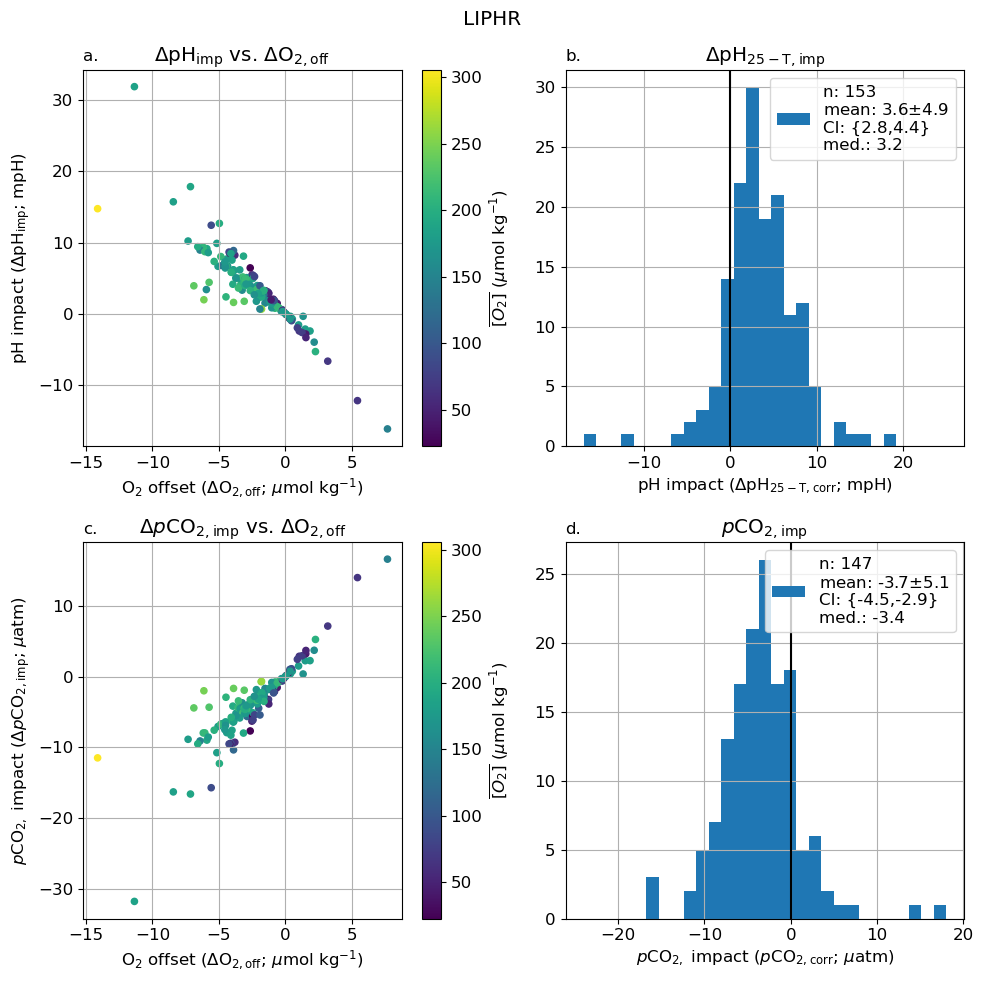

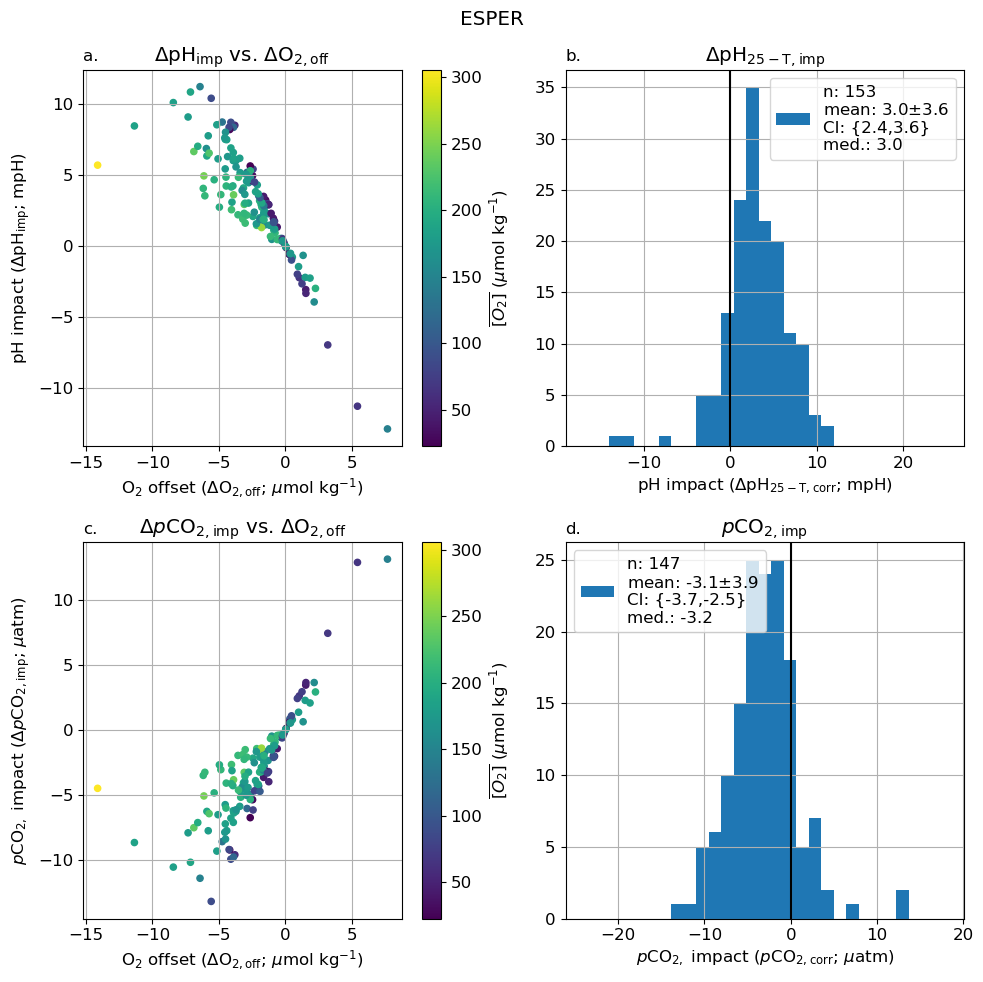

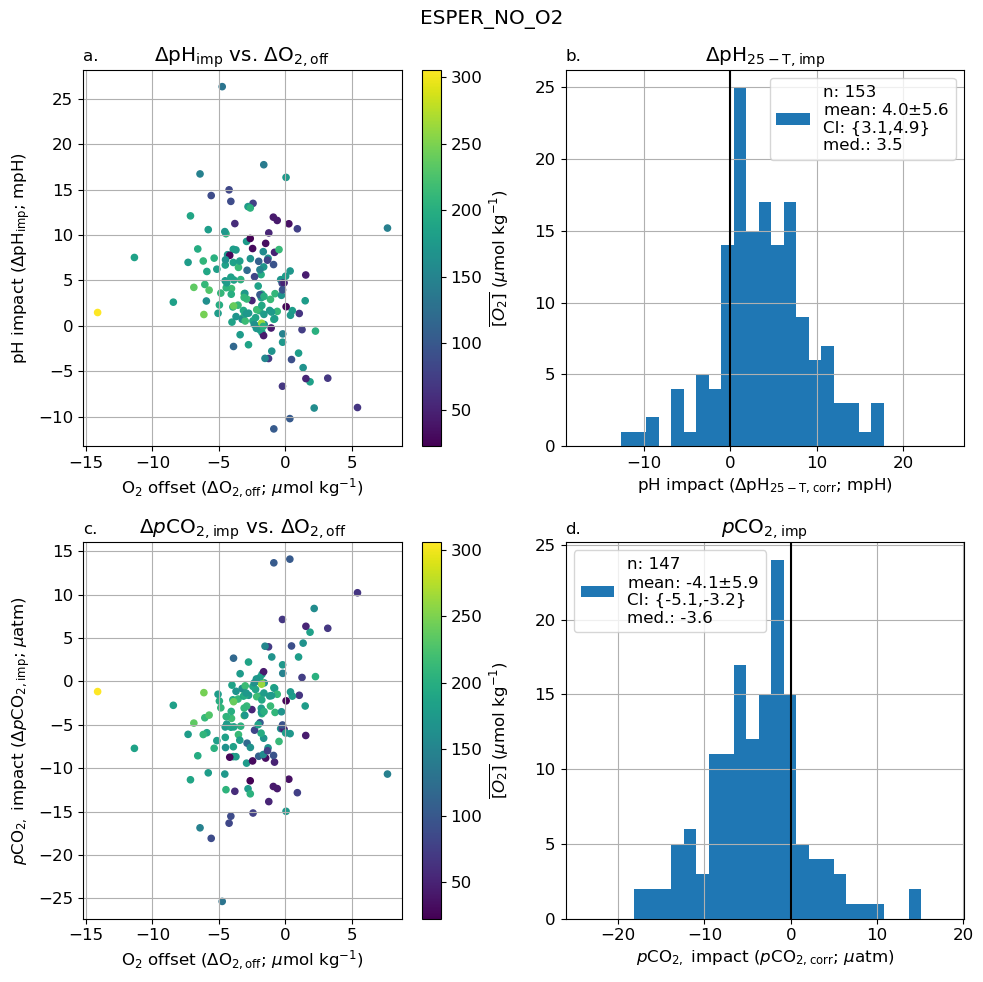

In [16]:
CI_level = 0.95

pH_types = ['LIPHR', 'ESPER', 'ESPER_NO_O2']

if air_cal_only==True:
    air_cal_text = 'Air cal. floats only'
else:
    air_cal_text = 'All pH floats'
pH_pCO2 = ['pH_impact','pCO2_impact']

for idx, ph_alg in enumerate(pH_types):
    print(idx)
    if ph_alg=='LIPHR':
        pH_impact_data = o2_impact_direct
    elif ph_alg=='ESPER':
        pH_impact_data = o2_impact_direct_esper
    elif ph_alg=='ESPER_NO_O2':
        pH_impact_data = no_o2_impact_direct_esper
    plot_filename = 'Fig_5 pH pCO2 impacts ' + air_cal_text + ' ' + ph_alg + code_ver + plot_ver

    fig = plt.subplots(2,2, figsize=(10,10))
    
    for v, var in enumerate(pH_pCO2):    
        ncount = pH_impact_data[var].count()
        if var=='pH_impact':
            scale = 1000
            x_label_units = 'mpH'
            fig_title = 'pH'
            delta_label = r'$\Delta$pH$_{\rm 25-T,}$'
            bin_vals = np.linspace(-17, 25, 30)
        else:
            scale = 1
            x_label_units = '$\mu$atm'
            fig_title = r'$\mathit{p}$CO$_{\rm 2,}$'
            delta_label = r'$\mathit{p}$' + r'CO$_{\rm 2,}$'
            bin_vals = np.linspace(-24, 18, 30)

        nmean = np.around(pH_impact_data[var].mean()*scale, decimals=1)
        nstd = np.around(pH_impact_data[var].std()*scale, decimals=1)
        nmedian = np.around(pH_impact_data[var].median()*scale, decimals=1)

        temp_var = pH_impact_data[var]
        temp_var = pd.to_numeric(temp_var, errors='coerce')

        # t_stat, p_value = stats.ttest_1samp(a=temp_var, popmean=0, nan_policy='omit') ############

        CI_vals = stats.norm.interval(confidence=CI_level, 
                        loc=np.nanmean(temp_var[~np.isnan(temp_var)].values), 
                        scale = stats.sem(temp_var[~np.isnan(temp_var)].values))
        CI_low = np.around(CI_vals[0]*scale, decimals=1)
        CI_high = np.around(CI_vals[1]*scale, decimals=1)
    
        plt.subplot(2,2,v+1+(v))
        
        pos = plt.scatter(pH_impact_data['o2_bias'], pH_impact_data[var]*scale, 20, pH_impact_data['o2_conc'])
        plt.title('$\Delta$' + fig_title + r'$_{\rm imp}$ vs. $\Delta$O$_{\rm 2,off}$')
        
        if v==0:
            plt.title('a.', loc='left', fontsize='medium')
        else:
            plt.title('c.', loc='left', fontsize='medium')

        plt.ylabel(fig_title + ' impact ($\Delta$' + fig_title + r'$_{\rm imp}$; ' + x_label_units + ')' )
        plt.xlabel(r'O$_{2}$ offset ($\Delta$O$_{\rm 2,off}$; $\mu$mol kg$^{-1}$)')
        cbar = plt.colorbar(pos)
        cbar.set_label(r'$\overline{[O_2]}$ ($\mu$mol kg$^{-1}$)')
        plt.grid()
        
        plt.subplot(2,2,v+2+(v))

        pos = plt.hist(pH_impact_data[var]*scale, bins=bin_vals, 
                        label='n: '+str(ncount) +  '\nmean: ' + str(nmean) + '$\pm$' + str(nstd) + 
                        '\nCI: {' + str(CI_low) +',' +  str(CI_high) + '}' + '\nmed.: ' + str(nmedian))
        plt.title(delta_label + r'$_{\rm imp}$')
        if v==0:
            plt.title('b.', loc='left', fontsize='medium')
        else:
            plt.title('d.', loc='left', fontsize='medium')
        plt.xlabel(fig_title + ' impact (' + delta_label + r'$_{\rm corr}$; ' + x_label_units + ')' )
        plt.axvline(x=0, color='k')
        plt.legend()
        plt.grid()


    plt.suptitle(ph_alg)
    plt.tight_layout()

    plt.savefig(manuscript_figs + plot_filename + '.png', dpi=300)



Table 1: oxygen impacts on derived paramters with statistics

In [17]:
pH_types = ['LIPHR', 'ESPER']
CI_level = 0.95
if air_cal_only==True:
    air_cal_text = 'Air cal. floats only'
else:
    air_cal_text = 'All pH floats'

pH_pCO2 = ['pH_impact','pCO2_impact']
for ph_alg in pH_types:
    o2_offset_data_table = []

    if ph_alg=='LIPHR':
        pH_impact_data = o2_impact_direct
    elif ph_alg=='ESPER':
        pH_impact_data = o2_impact_direct_esper
    
    for var in pH_pCO2:    
        ncount = pH_impact_data[var].count()
        o2_offset_mean = np.around(pH_impact_data['o2_bias'].mean(), decimals=1)

        if var=='pH_impact':
            scale = 1000
        else:
            scale = 1
        pH_impact_mean = np.around(pH_impact_data[var].mean()*scale, decimals=1)
        pH_impact_std = np.around(pH_impact_data[var].std()*scale, decimals=1)
        pH_impact_med = np.around(pH_impact_data[var].median()*scale, decimals=1)
        pH_impact_min = np.around(pH_impact_data[var].min()*scale, decimals=1)
        pH_impact_max = np.around(pH_impact_data[var].max()*scale, decimals=1)

        temp_var = pH_impact_data[var]
        temp_var = pd.to_numeric(temp_var, errors='coerce')

        t_stat, p_value = stats.ttest_1samp(a=temp_var, popmean=0, nan_policy='omit') ############
        if p_value>.001:
            p_value = np.around(p_value, decimals=3)
        else:
            p_value = '<0.001'
        CI_vals = stats.norm.interval(alpha=CI_level, 
                        loc=np.nanmean(temp_var[~np.isnan(temp_var)].values), 
                        scale = stats.sem(temp_var[~np.isnan(temp_var)].values))

        o2_offset_data_table.append((var, ncount, pH_impact_mean, pH_impact_std, p_value, 
                                     np.around(CI_vals[0]*scale, decimals=1), np.around(CI_vals[1]*scale, decimals=1), 
                                                                                        pH_impact_med, pH_impact_min, pH_impact_max))
    print(ph_alg)
    
    print(tabulate(o2_offset_data_table, ['O2 offset=' + str(o2_offset_mean), 'Count', 'Mean', 'SD', 'p_value', str(CI_level*100) + '% CI low', str(CI_level*100) + '% CI high', 'median', 'min', 'max'], tablefmt='grid'))
    
    
    headers= ['O2 offset=' + str(o2_offset_mean), 'Count', 'Mean', 'SD', 'p_value', str(CI_level*100) + '% CI low', str(CI_level*100) + '% CI high', 'median', 'min', 'max']
    # save the table as a word document
    print_word_table(manuscript_figs + '/Tables/', 'Table_1_' + ph_alg + code_ver + air_cal_text, 'Table 1.Statistics for pH 25C total (1500 db), and pCO2 (surface) impacts', headers, o2_offset_data_table)


LIPHR
+------------------+---------+--------+------+-----------+----------------+-----------------+----------+-------+-------+
| O2 offset=-2.4   |   Count |   Mean |   SD | p_value   |   95.0% CI low |   95.0% CI high |   median |   min |   max |
+==================+=========+========+======+===========+================+=================+==========+=======+=======+
| pH_impact        |     153 |    3.6 |  4.9 | <0.001    |            2.8 |             4.4 |      3.2 | -16.2 |  31.9 |
+------------------+---------+--------+------+-----------+----------------+-----------------+----------+-------+-------+
| pCO2_impact      |     147 |   -3.7 |  5.1 | <0.001    |           -4.5 |            -2.9 |     -3.4 | -31.8 |  16.6 |
+------------------+---------+--------+------+-----------+----------------+-----------------+----------+-------+-------+
ESPER
+------------------+---------+--------+------+-----------+----------------+-----------------+----------+-------+-------+
| O2 offset=-2.4   |

/var/folders/7r/4f_w_nb56llcwh96t_pjq_qh0000gn/T/ipykernel_27613/2412448563.py:39: DeprecationWarning: Use of keyword argument `alpha` for method `interval` is deprecated. Use first positional argument or keyword argument `confidence` instead.
  CI_vals = stats.norm.interval(alpha=CI_level,


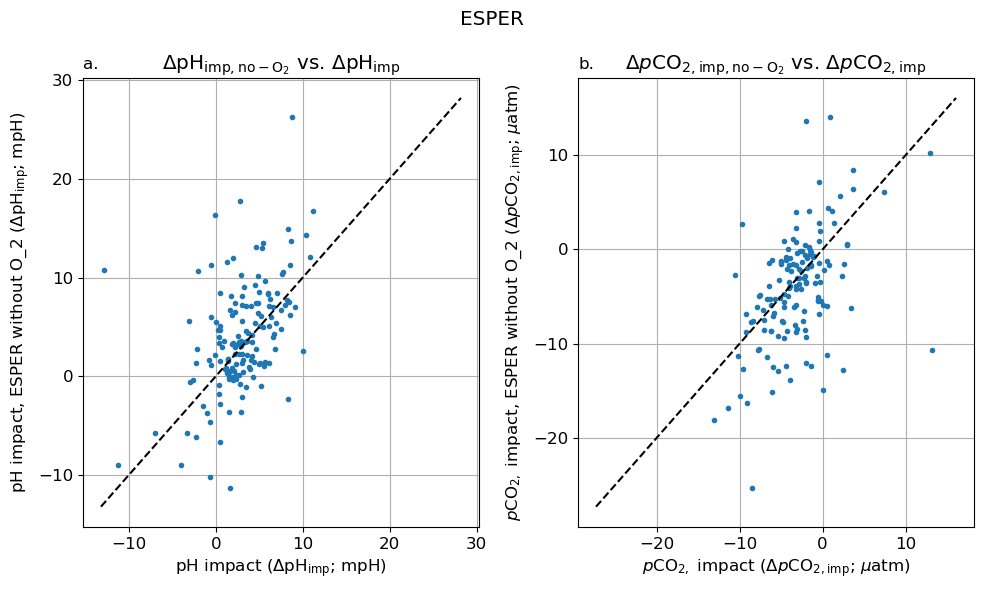

In [18]:
# plotting pH impact of ESPER vs pH impact of ESPER w/o O2 as an input

pH_impact_data = o2_impact_direct_esper
pH_impact_data_no_o2 = no_o2_impact_direct_esper
plot_filename = 'Fig_SQQ pH pCO2 impacts ' + air_cal_text + ' ESPER vs ESPER wo O2 ' + code_ver + plot_ver

fig = plt.subplots(1,2, figsize=(10,6))
    
pH_pCO2 = ['pH_impact','pCO2_impact']

for v, var in enumerate(pH_pCO2):    
    # ncount = pH_impact_data[var].count()
    if var=='pH_impact':
        scale = 1000
        x_label_units = 'mpH'
        fig_title = 'pH'
        delta_label = r'$\Delta$pH$_{\rm 25-T,}$'
        bin_vals = np.linspace(-17, 25, 30)
    else:
        scale = 1
        x_label_units = '$\mu$atm'
        fig_title = r'$\mathit{p}$CO$_{\rm 2,}$'
        delta_label = r'$\mathit{p}$' + r'CO$_{\rm 2,}$'
        bin_vals = np.linspace(-24, 18, 30)

    # nmean = np.around(pH_impact_data[var].mean()*scale, decimals=1)
    # nstd = np.around(pH_impact_data[var].std()*scale, decimals=1)
    # nmedian = np.around(pH_impact_data[var].median()*scale, decimals=1)

    temp_var = pH_impact_data[var]
    temp_var = pd.to_numeric(temp_var, errors='coerce')

    # t_stat, p_value = stats.ttest_1samp(a=temp_var, popmean=0, nan_policy='omit') ############

    # CI_vals = stats.norm.interval(confidence=CI_level, 
    #                 loc=np.nanmean(temp_var[~np.isnan(temp_var)].values), 
    #                 scale = stats.sem(temp_var[~np.isnan(temp_var)].values))
    # CI_low = np.around(CI_vals[0]*scale, decimals=1)
    # CI_high = np.around(CI_vals[1]*scale, decimals=1)

    plt.subplot(1,2,v+1)
    pos = plt.plot(pH_impact_data[var]*scale, pH_impact_data_no_o2[var]*scale, '.')
    plt.title('$\Delta$' + fig_title + r'$_{\rm imp, no-O_2}$ vs. $\Delta$' + fig_title + r'$_{\rm imp}$')
    y_limits = plt.ylim()
    plt.plot(y_limits, y_limits, '--k')
    if v==0:
        plt.title('a.', loc='left', fontsize='medium')
    else:
        plt.title('b.', loc='left', fontsize='medium')

    plt.ylabel(fig_title + ' impact, ESPER without O_2 ($\Delta$' + fig_title + r'$_{\rm imp}$; ' + x_label_units + ')' )
    plt.xlabel(fig_title + ' impact ($\Delta$' + fig_title + r'$_{\rm imp}$; ' + x_label_units + ')' )

    # plt.xlabel(r'O$_{2}$ offset ($\Delta$O$_{\rm 2,off}$; $\mu$mol kg$^{-1}$)')
    # cbar = plt.colorbar(pos)
    # cbar.set_label(r'$\overline{[O_2]}$ ($\mu$mol kg$^{-1}$)')
    # plt.grid()
    
    # plt.subplot(2,2,v+2+(v))

    # pos = plt.hist(pH_impact_data[var]*scale, bins=bin_vals, 
    #                 label='n: '+str(ncount) +  '\nmean: ' + str(nmean) + '$\pm$' + str(nstd) + 
    #                 '\nCI: {' + str(CI_low) +',' +  str(CI_high) + '}' + '\nmed.: ' + str(nmedian))
    # plt.title(delta_label + r'$_{\rm imp}$')
    # if v==0:
    #     plt.title('b.', loc='left', fontsize='medium')
    # else:
    #     plt.title('d.', loc='left', fontsize='medium')
    # plt.xlabel(fig_title + ' impact (' + delta_label + r'$_{\rm corr}$; ' + x_label_units + ')' )
    # plt.axvline(x=0, color='k')
    # plt.legend()
    plt.grid()


    plt.suptitle(ph_alg)
    plt.tight_layout()

plt.savefig(manuscript_figs + plot_filename + '.png', dpi=300)

### DIC impacts at surface and at depth - supplemental figure/table

LIPHR
+------------------+---------+--------+------+-----------+----------------+-----------------+----------+-------+-------+
| O2 offset=-2.4   |   Count |   Mean |   SD | p_value   |   95.0% CI low |   95.0% CI high |   median |   min |   max |
+==================+=========+========+======+===========+================+=================+==========+=======+=======+
| dic_impact_surf  |     147 |   -1.5 |  2.1 | <0.001    |          -1.84 |           -1.17 |     -1.4 | -11.2 |   7.4 |
+------------------+---------+--------+------+-----------+----------------+-----------------+----------+-------+-------+
| dic_impact_1500  |     119 |   -1.2 |  1.7 | <0.001    |          -1.5  |           -0.9  |     -1.1 | -10.8 |   5.1 |
+------------------+---------+--------+------+-----------+----------------+-----------------+----------+-------+-------+
ESPER
+------------------+---------+--------+------+-----------+----------------+-----------------+----------+-------+-------+
| O2 offset=-2.4   |

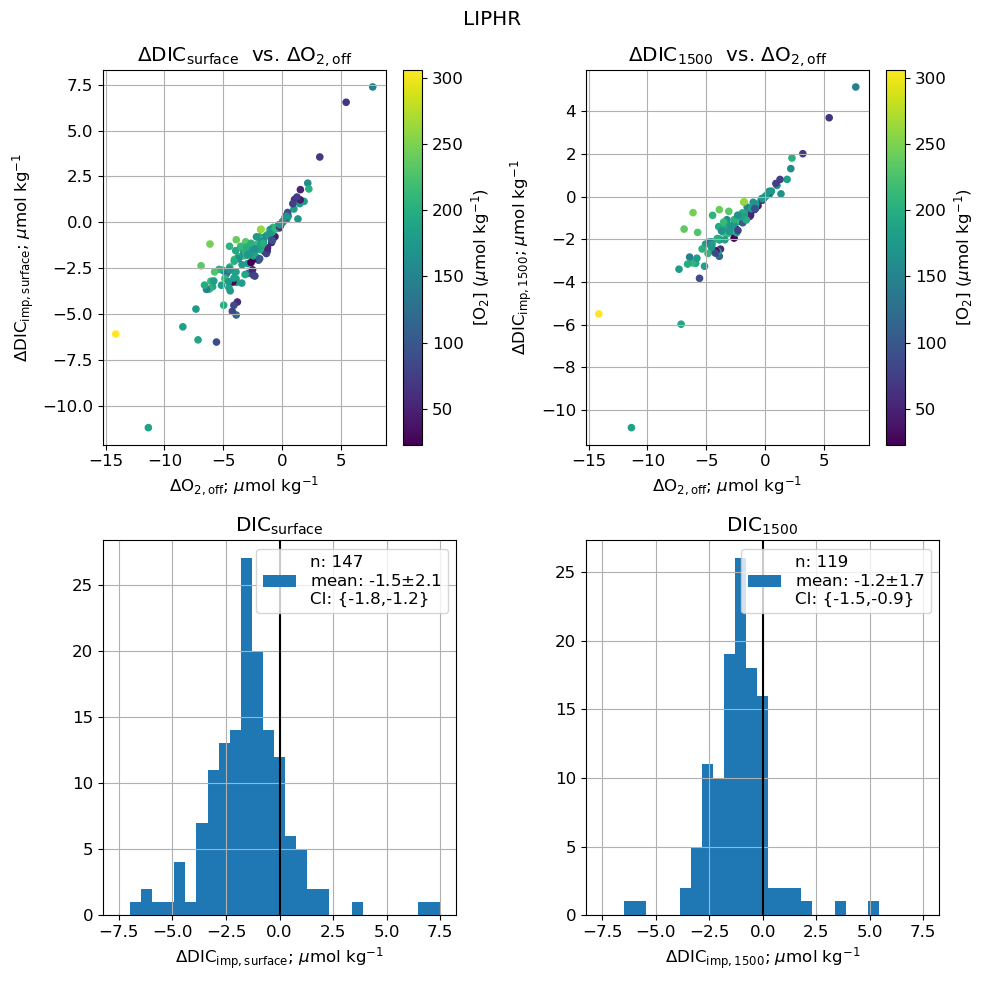

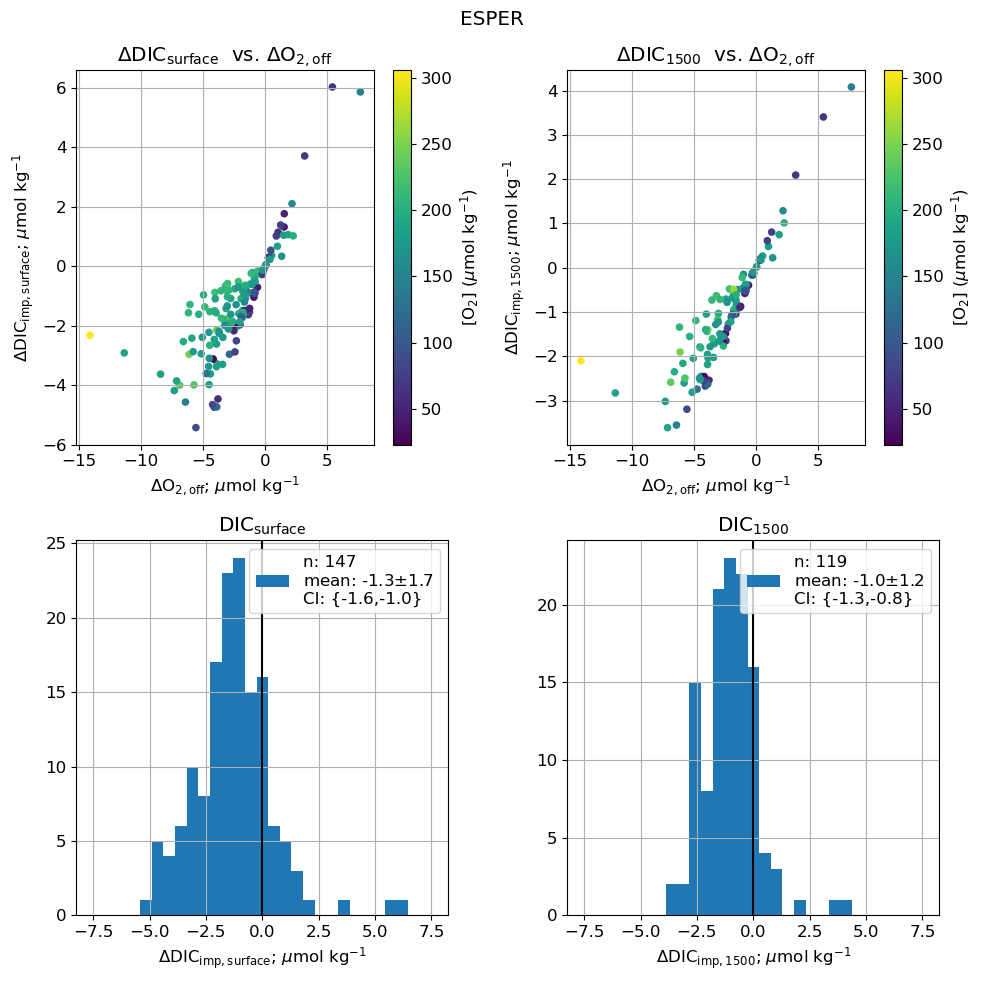

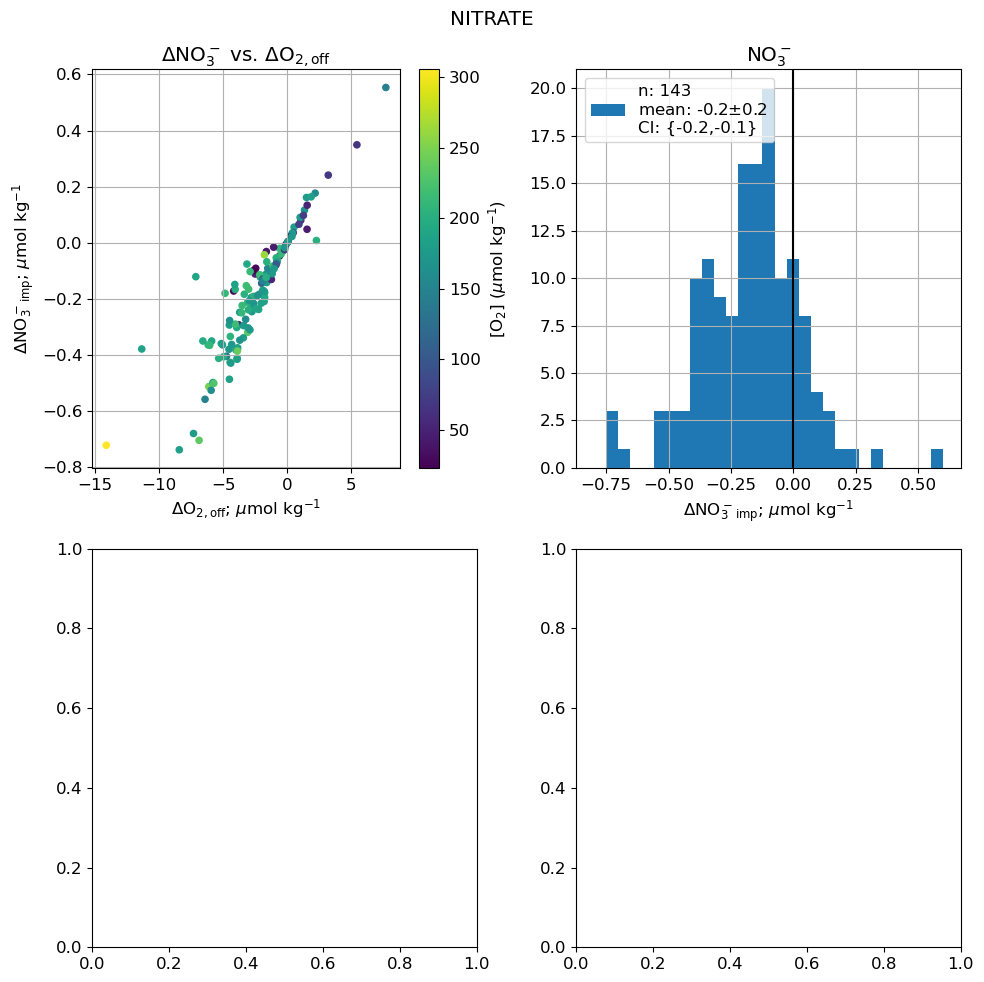

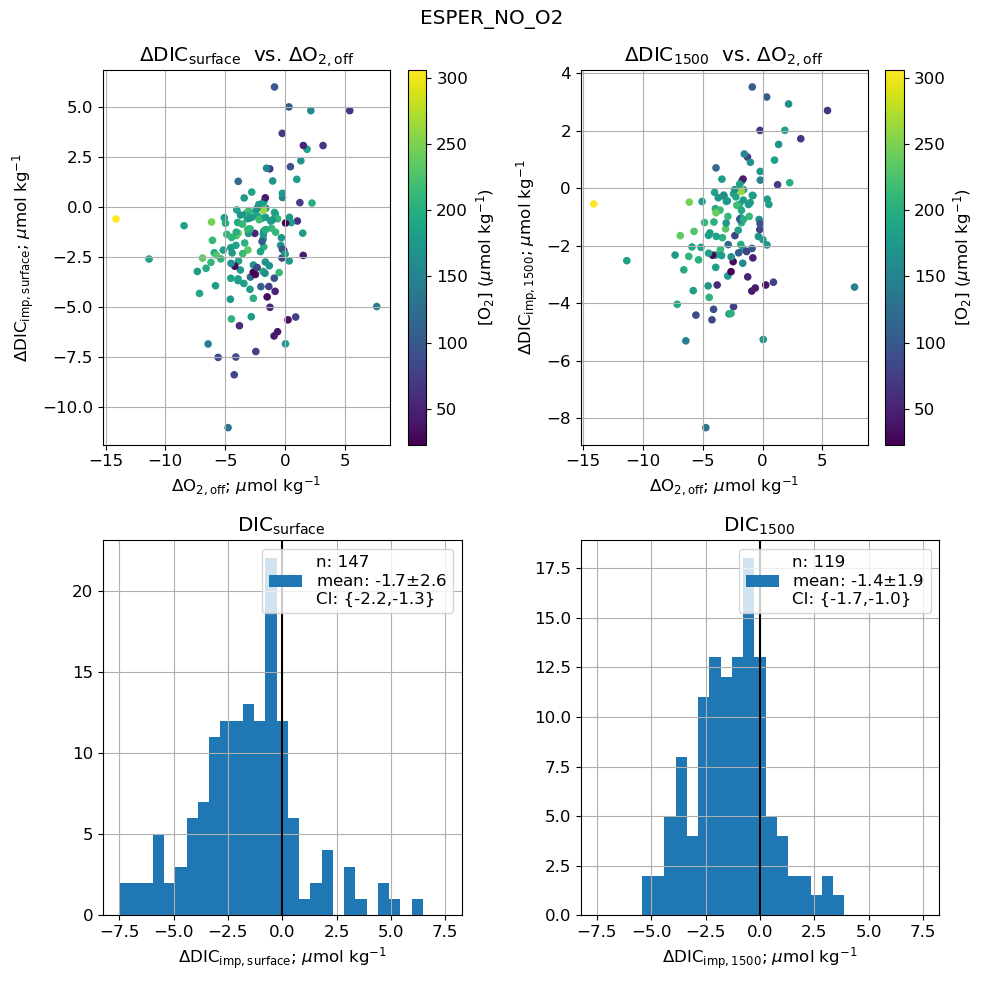

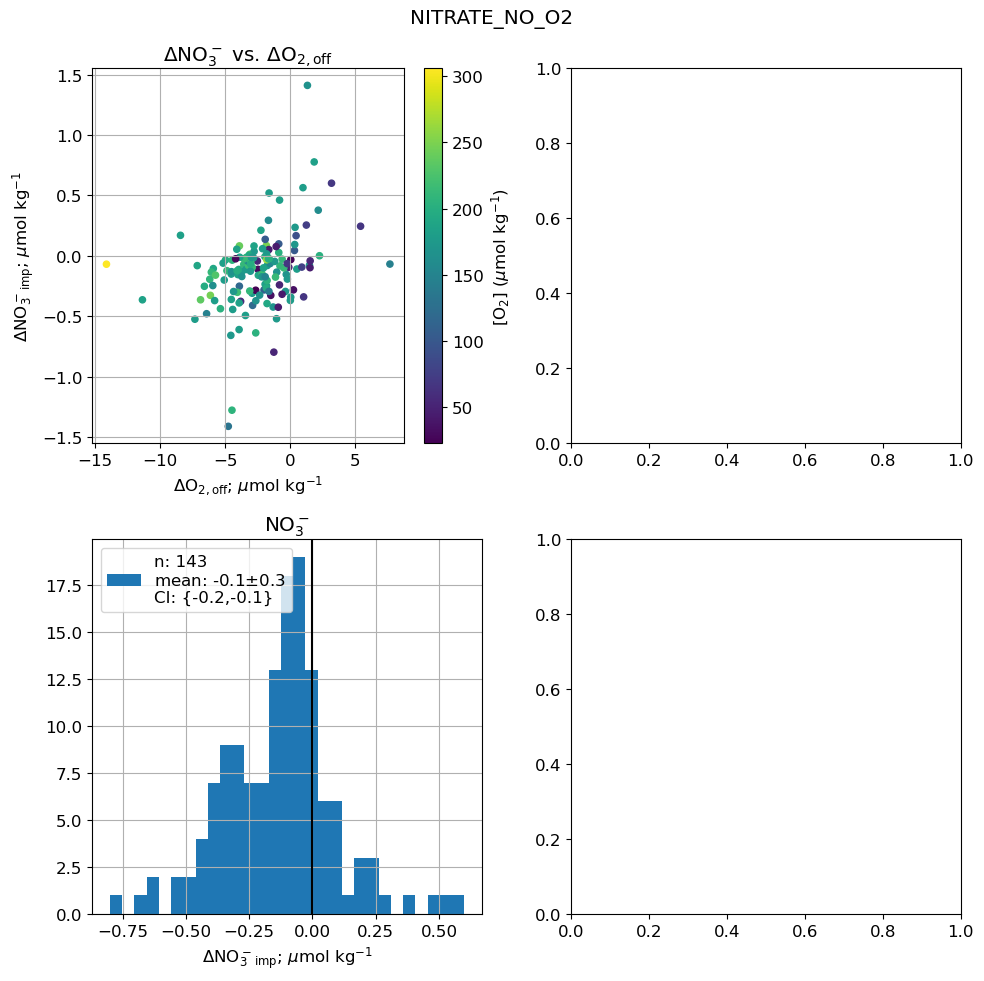

In [19]:
pH_types = ['LIPHR', 'ESPER','NITRATE', 'ESPER_NO_O2','NITRATE_NO_O2']
CI_level = 0.95
if air_cal_only==True:
    air_cal_text = 'Air cal. floats only'
else:
    air_cal_text = 'All pH floats'

for ph_alg in pH_types:
    o2_offset_data_table = []

    if ph_alg=='LIPHR':
        pH_impact_data = o2_impact_direct
        pH_pCO2 = ['dic_impact_surf','dic_impact_1500']
        bin_vals = np.linspace(-7.5, 7.5, 30)
    elif ph_alg=='ESPER':
        pH_impact_data = o2_impact_direct_esper
        pH_pCO2 = ['dic_impact_surf','dic_impact_1500']
        bin_vals = np.linspace(-7.5, 7.5, 30)
    elif ph_alg=='ESPER_NO_O2':
        pH_impact_data = no_o2_impact_direct_esper
        pH_pCO2 = ['dic_impact_surf','dic_impact_1500']
        bin_vals = np.linspace(-7.5, 7.5, 30)
    elif ph_alg=='NITRATE':
        pH_impact_data = o2_impact_no3
        pH_pCO2 = ['no3_impact']
        bin_vals = np.linspace(-0.8, 0.6, 30)
    elif ph_alg=='NITRATE_NO_O2':
        pH_impact_data = no_o2_impact_no3
        pH_pCO2 = ['no3_impact']
        bin_vals = np.linspace(-0.8, 0.6, 30)

    fig = plt.subplots(2,2, figsize=(10,10))
    plot_filename = 'Fig_SXX DIC impacts ' + air_cal_text + ' ' + ph_alg + code_ver + plot_ver

    for idx, var in enumerate(pH_pCO2):    
        ncount = pH_impact_data[var].count()
        o2_offset_mean = np.around(pH_impact_data['o2_bias'].mean(), decimals=1)

        if var=='pH_impact':
            scale = 1000
        else:
            scale = 1
        
        if var=='dic_impact_surf':
            fig_title = 'DIC' + r'$_{\rm surface}$ '
            x_lab = '$\Delta$DIC' + r'$_{\rm imp,surface}$; ' + '$\mu$mol kg$^{-1}$'

        elif var=='dic_impact_1500':
            fig_title = 'DIC' + r'$_{\rm 1500}$ '
            x_lab = '$\Delta$DIC' + r'$_{\rm imp,1500}$; ' + '$\mu$mol kg$^{-1}$'

        elif var=='no3_impact':
            fig_title='NO$_3^-$'
            x_lab = '$\Delta$NO$_3^-$' + r'$_{\rm imp}$; ' + '$\mu$mol kg$^{-1}$'


        pH_impact_mean = np.around(pH_impact_data[var].mean()*scale, decimals=1)
        pH_impact_std = np.around(pH_impact_data[var].std()*scale, decimals=1)
        pH_impact_med = np.around(pH_impact_data[var].median()*scale, decimals=1)
        pH_impact_min = np.around(pH_impact_data[var].min()*scale, decimals=1)
        pH_impact_max = np.around(pH_impact_data[var].max()*scale, decimals=1)

        temp_var = pH_impact_data[var]
        temp_var = pd.to_numeric(temp_var, errors='coerce')

        t_stat, p_value = stats.ttest_1samp(a=temp_var, popmean=0, nan_policy='omit') ############
        if p_value>.001:
            p_value = np.around(p_value, decimals=3)
        else:
            p_value = '<0.001'

        CI_vals = stats.norm.interval(confidence=CI_level, 
                        loc=np.nanmean(temp_var[~np.isnan(temp_var)].values), 
                        scale = stats.sem(temp_var[~np.isnan(temp_var)].values))
        CI_low = np.around(CI_vals[0]*scale, decimals=1)
        CI_high = np.around(CI_vals[1]*scale, decimals=1)
    
        o2_offset_data_table.append((var, ncount, pH_impact_mean, pH_impact_std, p_value, 
                                     np.around(CI_vals[0]*scale, decimals=2), np.around(CI_vals[1]*scale, decimals=2), 
                                                                                        pH_impact_med, pH_impact_min, pH_impact_max))
        plt.subplot(2,2,idx+1)
        pos = plt.scatter(pH_impact_data['o2_bias'], pH_impact_data[var], 20, pH_impact_data['o2_conc'])
        plt.title('$\Delta$' + fig_title + ' vs. ' + r'$\Delta$O$_{\rm 2,off}$')

        plt.ylabel(x_lab)
        plt.xlabel(r'$\Delta$O$_{\rm 2,off}$; $\mu$mol kg$^{-1}$')
        cbar = plt.colorbar(pos)
        cbar.set_label(r'[O$_2$] ($\mu$mol kg$^{-1}$)')
        plt.grid()


        if ph_alg=='NITRATE':
            plt.subplot(2,2, idx + 2)

        else:
            plt.subplot(2,2, idx + 3)
        # nmedian = np.around(pH_impact_data[var].median(), decimals=1)
        # nmean = np.around(pH_impact_data[var].mean(), decimals=1)

        CI_low = np.around(CI_vals[0]*scale, decimals=1)
        CI_high = np.around(CI_vals[1]*scale, decimals=1)
    

        pos = plt.hist(pH_impact_data[var], 
                       bins=bin_vals,
                       label='n: '+str(ncount) +  '\nmean: ' + str(pH_impact_mean) + '$\pm$' + str(pH_impact_std) + 
                        '\nCI: {' + str(CI_low) +',' +  str(CI_high) + '}')
        
                # label='n= ' + str(pH_impact_data[var].count()) + '\nmed.= '+str(nmedian) + '\nmean= '+str(nmean) ) #  
        plt.title(fig_title)
        plt.xlabel(x_lab)
        plt.axvline(x=0, color='k')
        plt.legend()
        plt.grid()

    print(ph_alg)
    
    print(tabulate(o2_offset_data_table, ['O2 offset=' + str(o2_offset_mean), 
                                          'Count', 'Mean', 'SD', 'p_value', str(CI_level*100) + '% CI low', 
                                          str(CI_level*100) + '% CI high', 'median', 'min', 'max'], tablefmt='grid'))

    
    plt.suptitle(ph_alg)
    plt.tight_layout()

    plt.savefig(manuscript_figs + plot_filename + '.png', dpi=300)

    headers=['Parameter', 'count', 'mean', 'SD', 'p_value', str(CI_level*100) + '% CI low', str(CI_level*100) + '% CI high', 'median', 'min', 'max']
    # save the table as a word document
    print_word_table(manuscript_figs + '/Tables/', 'Table_SXX' + ph_alg + code_ver, 'Table SXX.Statistics for ' + ph_alg, headers, o2_offset_data_table)



### Figure 6: Maps of offsets and impacts

LIPHR
min pH impact per umol kg-1 O2: -2.8096217865132327
max pH impact per umol kg-1 O2: -0.2791984981347279
ESPER
min pH impact per umol kg-1 O2: -2.3275730782532196
max pH impact per umol kg-1 O2: -0.4019627009974451


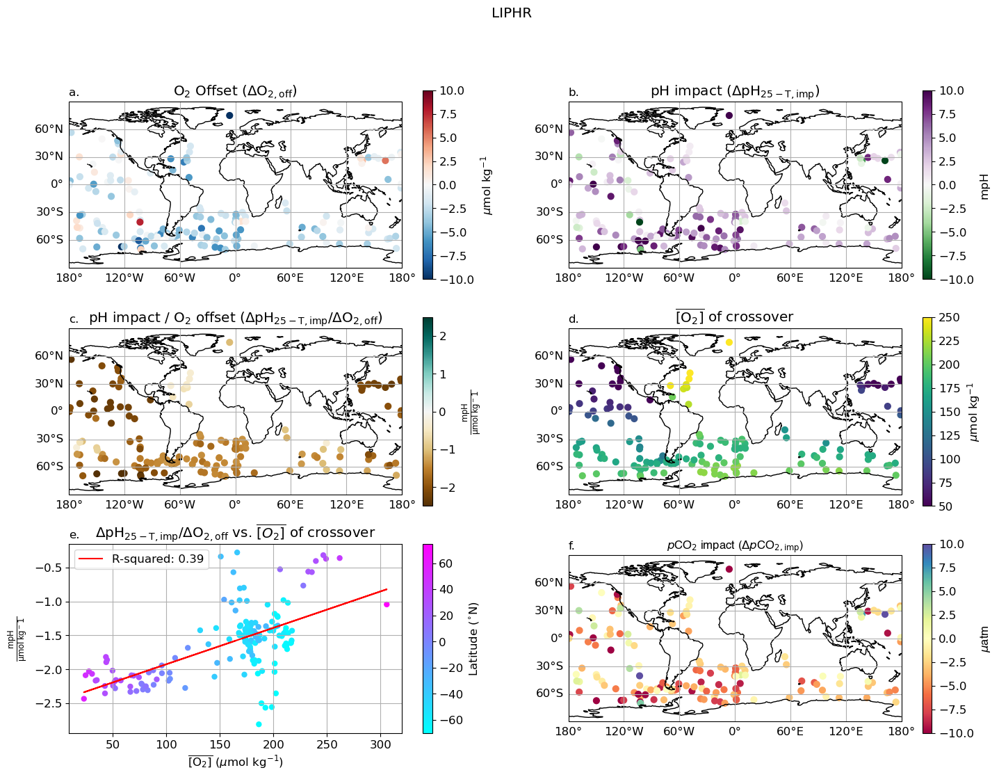

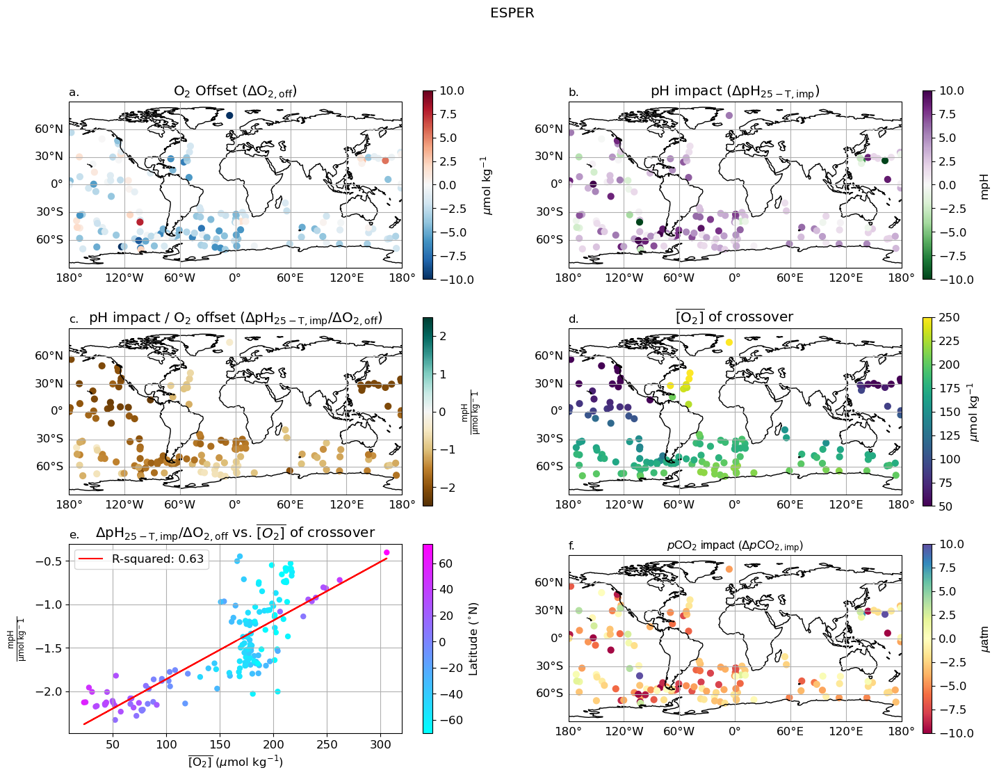

In [21]:

plt.rcParams["font.family"] = 'sans-serif'
plt.rcParams["font.serif"] = 'Helvetica'

c_bar_font_size = 12
title_font_size = 12

pH_types = ['LIPHR', 'ESPER']
# pH_types = ['LIPHR']

if air_cal_only==True:
    air_cal_text = 'Air cal. floats only'
else:
    air_cal_text = 'All pH floats'

for ph_alg in pH_types:

    if ph_alg=='LIPHR':
        pH_impact_data = o2_impact_direct
    elif ph_alg=='ESPER':
        pH_impact_data = o2_impact_direct_esper
    


    plot_filename = 'Fig_6 Maps of O2 offsets and impacts '+ air_cal_text + '_' + ph_alg

    fig = plt.figure(figsize=(17, 12))
    gs = gridspec.GridSpec(3, 2, width_ratios=[1, 1], height_ratios=[1, 1, 1])
    # fig, axs = plt.subplot_mosaic([['a.', 'b.'],['c.','d.'],['e.','f.']], layout='constrained', figsize=(15, 10), subplot_kw={'projection': ccrs.PlateCarree()})
    axs = [fig.add_subplot(gs[0, 0], projection=ccrs.PlateCarree()), 
           fig.add_subplot(gs[0, 1], projection=ccrs.PlateCarree()), 
           fig.add_subplot(gs[1, 0], projection=ccrs.PlateCarree()),
           fig.add_subplot(gs[1, 1], projection=ccrs.PlateCarree()),
           fig.add_subplot(gs[2, 0]),
           fig.add_subplot(gs[2, 1], projection=ccrs.PlateCarree())]

    # # initialize and label subplots
    for i, ax in enumerate(axs):
        if i==4:
            continue
        else:
            ax.coastlines()
            ax.set_global()
            gl = ax.gridlines(draw_labels=True)
            gl.right_labels = False
            gl.top_labels = False

            # ax.set_title('Normal Title', font='helvetica')
            # ax.set_title(label, loc='left', fontsize='medium', font='helvetica')

    # Oxygen offset
    sct = axs[0].scatter(pH_impact_data['long'], pH_impact_data['lat'],
                        c=pH_impact_data['o2_bias'], cmap='RdBu_r',s=40,vmin=-10,vmax=10)
    cbar = plt.colorbar(sct)
    cbar.set_label(r'$\mu$mol kg$^{-1}$', labelpad=5, fontsize=c_bar_font_size)
    axs[0].set_title(r'O$_2$ Offset ($\Delta$O$_{\rm 2,off}$)')
    axs[0].set_title('a.', loc='left', fontsize='medium')

    # pH impact
    sct = axs[1].scatter(pH_impact_data['long'], pH_impact_data['lat'],
                        c=pH_impact_data['pH_impact']*1000, cmap='PRGn_r',s=40,vmin=-10,vmax=10)

    cbar = plt.colorbar(sct)
    cbar.set_label('mpH', labelpad=5, fontsize=c_bar_font_size)
    axs[1].set_title(r'pH impact ($\Delta$pH$_{\rm 25-T,imp}$)')
    axs[1].set_title('b.', loc='left', fontsize='medium')

    # map of dpH to o2 offset
    axs[2].set_title(r'pH impact / O$_2$ offset ($\Delta$pH$_{\rm 25-T,imp}$/$\Delta$O$_{\rm 2,off}$)')

    sct = axs[2].scatter(pH_impact_data['long'], pH_impact_data['lat'],
                        c=(pH_impact_data['pH_impact']*1000)/pH_impact_data['o2_bias'], cmap='BrBG',s=40,vmin=-2.5,vmax=2.5)

    cbar = plt.colorbar(sct)
    # cbar.set_label('mpH / $\mu$mol kg$^-1$', labelpad=5, fontsize=c_bar_font_size)
    # cbar.set_label(r'$\frac{mpH}{\mu\text{mol kg}^{-1}}$', labelpad=5, fontsize=c_bar_font_size)
    cbar.set_label(r'$\frac{\rm mpH}{{\mu}mol{\,} kg^-1}$', labelpad=5, fontsize=c_bar_font_size)
    axs[2].set_title('c.', loc='left', fontsize='medium')


    # mean oxygen at crossover
    axs[3].set_title(r'$\overline{\rm [O_2]}$ of crossover')
    sct = axs[3].scatter(pH_impact_data['long'], pH_impact_data['lat'],
                        c=pH_impact_data['o2_conc'], cmap='viridis',s=40,vmin=50,vmax=250)

    cbar = plt.colorbar(sct)
    cbar.set_label('$\mu$mol kg$^{-1}$', labelpad=5, fontsize=c_bar_font_size)
    axs[3].set_title('d.', loc='left', fontsize='medium')

    #scatter of dpH to O2 offset
    # fig.delaxes(axs['e.'])
    # ax = plt.subplot(325)
    axs[4].set_title(r'$\Delta$pH$_{\rm 25-T,imp}$/$\Delta$O$_{\rm 2,off}$ vs. $\overline{[O_2]}$ of crossover')
    axs[4].set_title('e.', loc='left', fontsize='medium')

    # plt.title('$\Delta$pH/O$_2$ vs. $\overline{[O_2]}$ of crossover')
    # ax.set_title('e.', loc='left', fontsize='medium', font='helvetica')
    # axs[4].plot(pH_impact_data['o2_conc'], (pH_impact_data['pH_impact']*1000)/pH_impact_data['o2_bias'],
    #             linestyle='None', marker='x')
    sc = axs[4].scatter(pH_impact_data['o2_conc'], (pH_impact_data['pH_impact']*1000)/pH_impact_data['o2_bias'], 25, pH_impact_data['lat'],
                linestyle='None', marker='o', cmap='cool')
    cbar = plt.colorbar(sc)
    cbar.set_label('Latitude ($^{\circ}$N)', labelpad=5, fontsize=c_bar_font_size)

    print(ph_alg)
    print('min pH impact per umol kg-1 O2: ' + str(np.nanmin((pH_impact_data['pH_impact']*1000)/pH_impact_data['o2_bias'])))
    print('max pH impact per umol kg-1 O2: ' + str(np.nanmax((pH_impact_data['pH_impact']*1000)/pH_impact_data['o2_bias'])))

    res = stats.linregress(pH_impact_data['o2_conc'], 
                            (pH_impact_data['pH_impact']*1000)/pH_impact_data['o2_bias'])
    axs[4].plot(pH_impact_data['o2_conc'], 
                res.intercept + res.slope*pH_impact_data['o2_conc'], 'r', label=f"R-squared: {res.rvalue**2:.2f}")
                
    axs[4].set_ylabel(r'$\frac{\rm mpH}{{\mu}mol{\,} kg^-1}$')
    axs[4].set_xlabel(r'$\overline{\rm [O_2]}$ ($\mu$mol kg$^{-1}$)')
    # axs[4].set
    # Get the x-limit values
    # x_limits = plt.xlim()
    # y_limits = plt.ylim()
    axs[4].grid('on')
    axs[4].legend(loc='upper left')

    # pCO2 impact
    axs[5].set_title(r'$\mathit{p}$CO$_2$ impact ($\Delta$$\mathit{p}$CO$_{\rm 2,imp}$)', font='helvetica')
    sct = axs[5].scatter(pH_impact_data['long'], pH_impact_data['lat'],
                        c=pH_impact_data['pCO2_impact'], cmap='Spectral',s=40,vmin=-10,vmax=10)

    cbar = plt.colorbar(sct)
    cbar.set_label('$\mu$atm', labelpad=5, fontsize=c_bar_font_size, font='helvetica')
    axs[5].set_title('f.', loc='left', fontsize='medium')

    plt.suptitle(ph_alg)

    plt.tight_layout
    plt.savefig(manuscript_figs + plot_filename + code_ver + plot_ver + '.png', dpi=600)


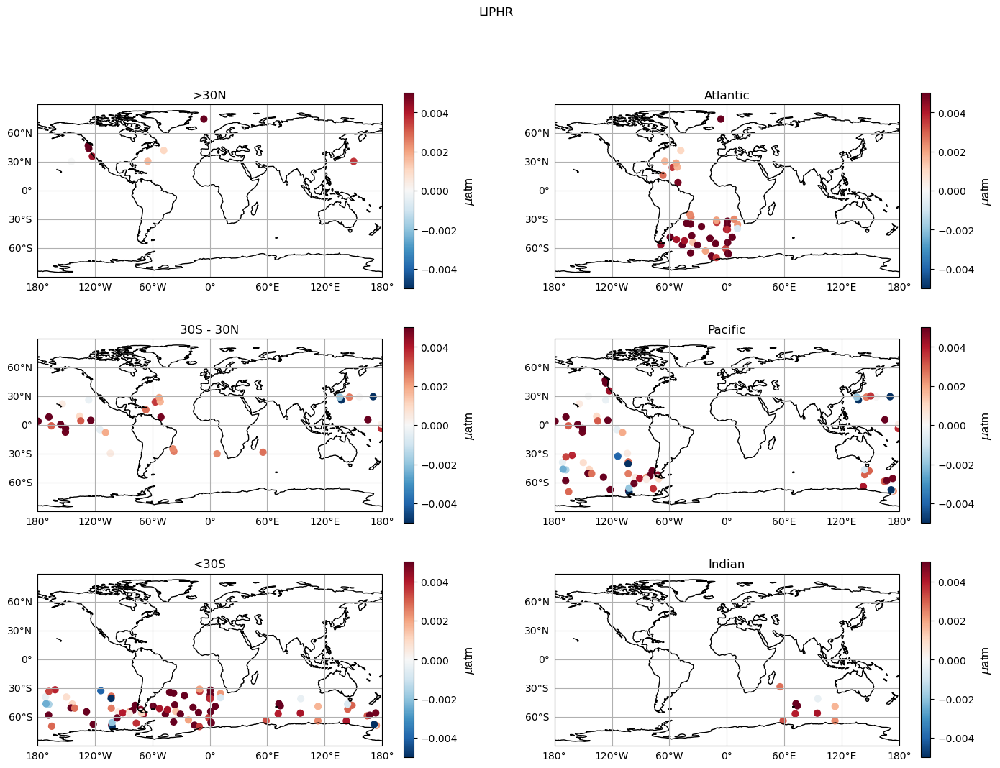

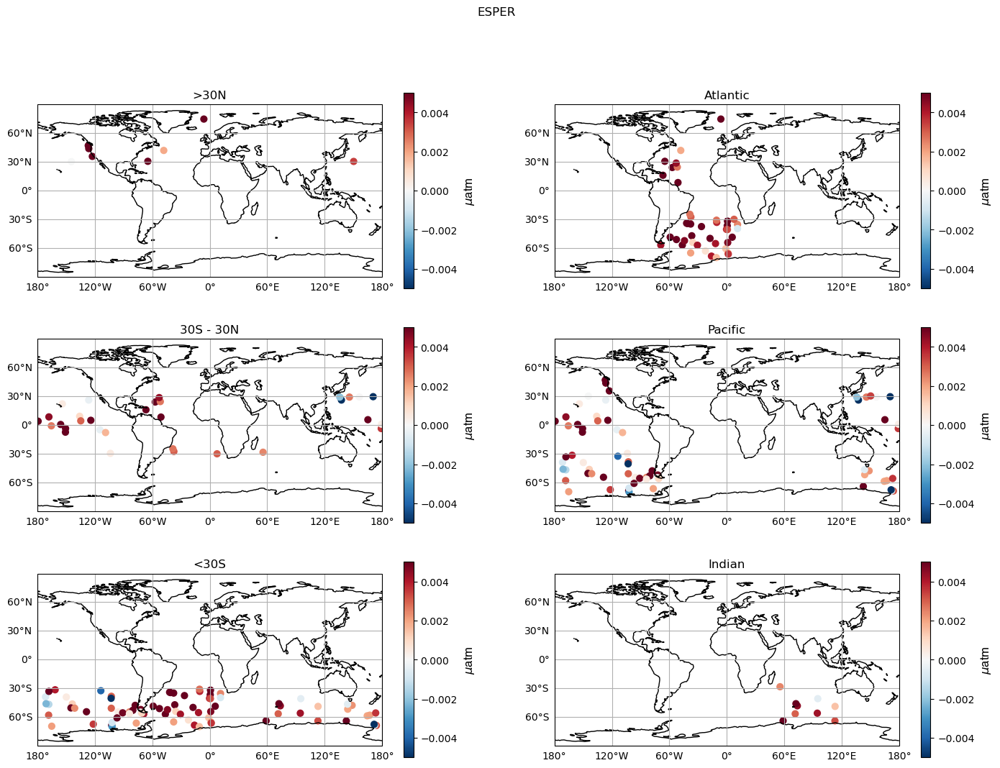

In [49]:
# calculating offsets/impacts regionally
pH_types = ['LIPHR', 'ESPER']
c_bar_font_size = 12

for ph_alg in pH_types:

    if ph_alg=='LIPHR':
        pH_impact_data = o2_impact_direct
    elif ph_alg=='ESPER':
        pH_impact_data = o2_impact_direct_esper
            
    # use lat/lon to create indexes of different regions
    regions = ['>30N','Atlantic', '30S - 30N', 'Pacific', '<30S',   'Indian']



    # maps to make sure you have the breakdown correct:
    fig = plt.figure(figsize=(17, 12))
    gs = gridspec.GridSpec(3, 2, width_ratios=[1, 1], height_ratios=[1, 1, 1])
    # fig, axs = plt.subplot_mosaic([['a.', 'b.'],['c.','d.'],['e.','f.']], layout='constrained', figsize=(15, 10), subplot_kw={'projection': ccrs.PlateCarree()})
    axs = [fig.add_subplot(gs[0, 0], projection=ccrs.PlateCarree()), 
            fig.add_subplot(gs[0, 1], projection=ccrs.PlateCarree()), 
            fig.add_subplot(gs[1, 0], projection=ccrs.PlateCarree()),
            fig.add_subplot(gs[1, 1], projection=ccrs.PlateCarree()),
            fig.add_subplot(gs[2, 0], projection=ccrs.PlateCarree()),
            fig.add_subplot(gs[2, 1], projection=ccrs.PlateCarree())]

    # # initialize and label subplots
    for i, ax in enumerate(axs):
        ax.coastlines()
        ax.set_global()
        gl = ax.gridlines(draw_labels=True)
        gl.right_labels = False
        gl.top_labels = False

    for idx, reg in enumerate(regions):
        if reg=='>30N':
            geo_index = pH_impact_data['lat']>30
        elif reg=='30S - 30N':
            geo_index = np.logical_and(pH_impact_data['lat']<30, pH_impact_data['lat']>-30)
        elif reg=='<30S':
            geo_index = pH_impact_data['lat']<-30
        elif reg=='Atlantic':
            geo_index = np.logical_and(pH_impact_data['long']<40, pH_impact_data['long']>-70)
        elif reg=='Pacific':
            geo_index = np.logical_or(pH_impact_data['long']<-70, pH_impact_data['long']>120)
        elif reg=='Indian':
            geo_index = np.logical_and(pH_impact_data['long']>40, pH_impact_data['long']<120)
    
        axs[idx].set_title(reg)

        sct = axs[idx].scatter(pH_impact_data['long'][geo_index], pH_impact_data['lat'][geo_index],
                        c=pH_impact_data['pH_impact'][geo_index], cmap='RdBu_r',s=40,vmin=-.005,vmax=.005)
        cbar = plt.colorbar(sct)
        cbar.set_label('$\mu$atm', labelpad=5, fontsize=c_bar_font_size, font='helvetica')

    plt.suptitle(ph_alg)

   


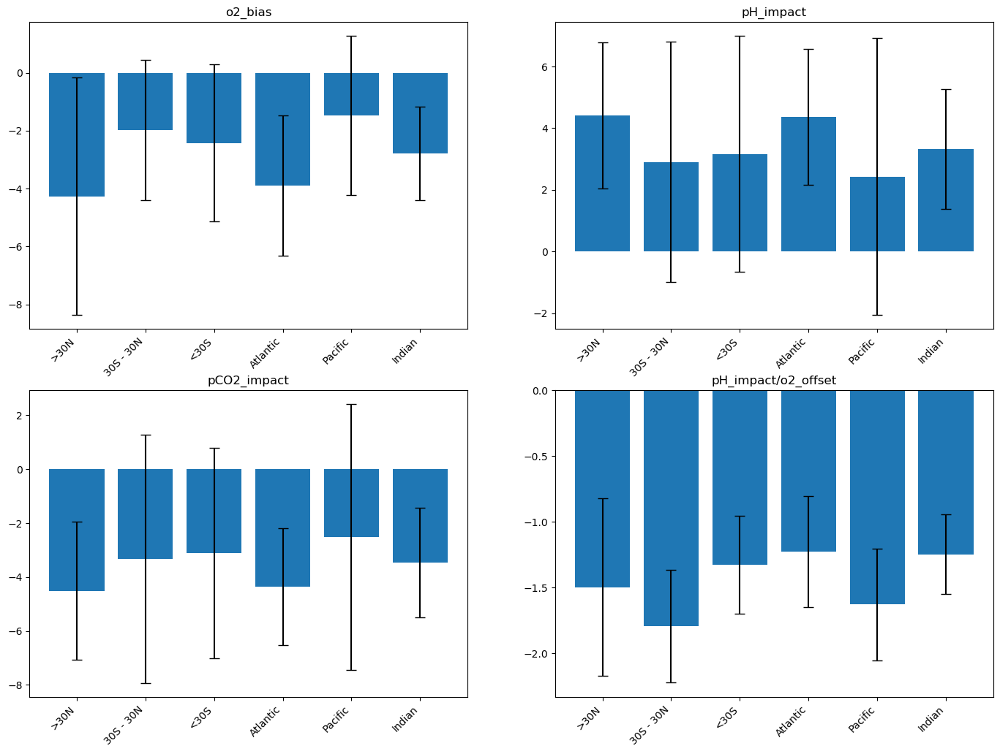

In [46]:
# bar plot by region
pH_types = ['ESPER']
c_bar_font_size = 12

plot_types = ['o2_bias', 'pH_impact', 'pCO2_impact', 'pH_impact/o2_offset']

for ph_alg in pH_types:

    if ph_alg=='LIPHR':
        pH_impact_data = o2_impact_direct
    elif ph_alg=='ESPER':
        pH_impact_data = o2_impact_direct_esper
            
    # use lat/lon to create indexes of different regions
    regions = ['>30N','30S - 30N', '<30S', 'Atlantic',  'Pacific',   'Indian']



    # maps to make sure you have the breakdown correct:
    fig = plt.figure(figsize=(17, 12))

    for plot_num, par in enumerate(plot_types):
        ax = fig.add_subplot(2,2,plot_num+1)
        means = []
        stds = []
        for idx, reg in enumerate(regions):
            if reg=='>30N':
                geo_index = pH_impact_data['lat']>30
            elif reg=='30S - 30N':
                geo_index = np.logical_and(pH_impact_data['lat']<30, pH_impact_data['lat']>-30)
            elif reg=='<30S':
                geo_index = pH_impact_data['lat']<-30
            elif reg=='Atlantic':
                geo_index = np.logical_and(pH_impact_data['long']<40, pH_impact_data['long']>-70)
            elif reg=='Pacific':
                geo_index = np.logical_or(pH_impact_data['long']<-70, pH_impact_data['long']>120)
            elif reg=='Indian':
                geo_index = np.logical_and(pH_impact_data['long']>40, pH_impact_data['long']<120)

            if par=='pH_impact/o2_offset':
                reg_mean = np.nanmean((pH_impact_data['pH_impact'][geo_index]*1000)/pH_impact_data['o2_bias'][geo_index])
                reg_std = np.nanstd((pH_impact_data['pH_impact'][geo_index]*1000)/pH_impact_data['o2_bias'][geo_index])
            elif par =='pH_impact' :
                reg_mean = np.nanmean(pH_impact_data[par][geo_index])*1000
                reg_std = np.nanstd(pH_impact_data[par][geo_index])   *1000
            else:
                reg_mean = np.nanmean(pH_impact_data[par][geo_index])
                reg_std = np.nanstd(pH_impact_data[par][geo_index])   

            means.append(reg_mean)
            stds.append(reg_std)
        x = np.arange(len(regions))
        ax.bar(x, means, yerr=stds, capsize=5)
        ax.set_xticks(x)
        ax.set_xticklabels(regions, rotation=45, ha='right')
        ax.set_title(par)

        
    # gs = gridspec.GridSpec(3, 2, width_ratios=[1, 1], height_ratios=[1, 1, 1])
    # # fig, axs = plt.subplot_mosaic([['a.', 'b.'],['c.','d.'],['e.','f.']], layout='constrained', figsize=(15, 10), subplot_kw={'projection': ccrs.PlateCarree()})
    # axs = [fig.add_subplot(gs[0, 0], projection=ccrs.PlateCarree()), 
    #         fig.add_subplot(gs[0, 1], projection=ccrs.PlateCarree()), 
    #         fig.add_subplot(gs[1, 0], projection=ccrs.PlateCarree()),
    #         fig.add_subplot(gs[1, 1], projection=ccrs.PlateCarree()),
    #         fig.add_subplot(gs[2, 0], projection=ccrs.PlateCarree()),
    #         fig.add_subplot(gs[2, 1], projection=ccrs.PlateCarree())]

    # # # initialize and label subplots
    # for i, ax in enumerate(axs):
    #     ax.coastlines()
    #     ax.set_global()
    #     gl = ax.gridlines(draw_labels=True)
    #     gl.right_labels = False
    #     gl.top_labels = False

   
    
    #     axs[idx].set_title(reg)

    #     sct = axs[idx].scatter(pH_impact_data['long'][geo_index], pH_impact_data['lat'][geo_index],
    #                     c=pH_impact_data['o2_bias'][geo_index], cmap='RdBu_r',s=40,vmin=-10,vmax=10)
    #     cbar = plt.colorbar(sct)
    #     cbar.set_label('$\mu$atm', labelpad=5, fontsize=c_bar_font_size, font='helvetica')

    # plt.suptitle(ph_alg)

In [40]:
par
reg


4.098220721367403

### Deprecated

/var/folders/7r/4f_w_nb56llcwh96t_pjq_qh0000gn/T/ipykernel_39651/275399132.py:4: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  plt.subplot(331)


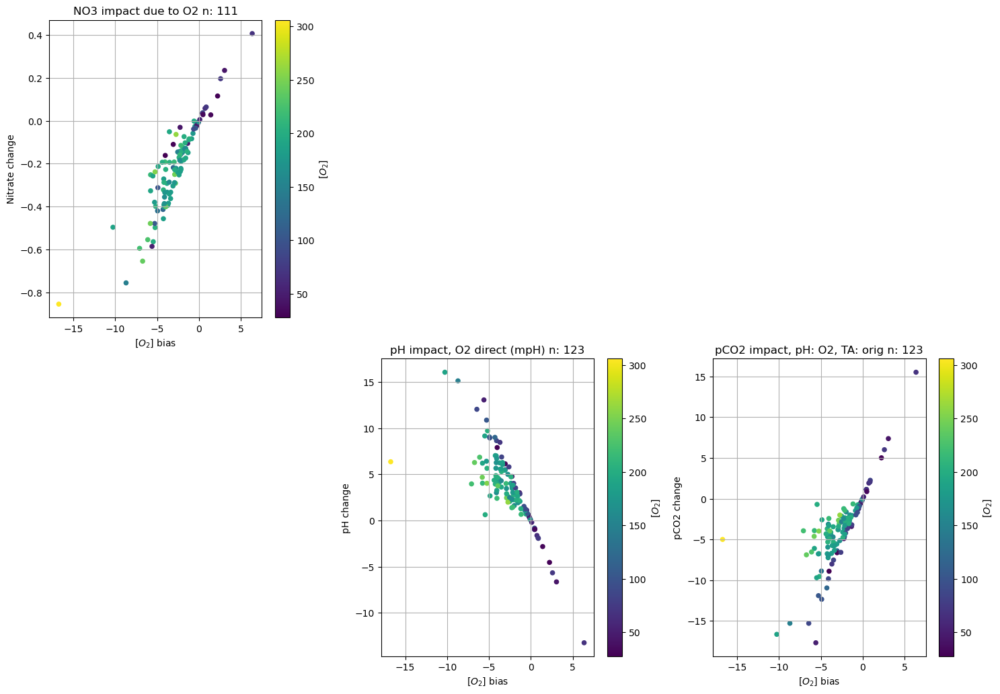

In [34]:
# plotting total impacts from various combination of factors
fig = plt.subplots(figsize=(15,15))

plt.subplot(331)
pos = plt.scatter(o2_impact_no3['o2_bias'], o2_impact_no3['no3_impact'], 20, o2_impact_no3['o2_conc'])
plt.title('NO3 impact due to O2' + ' n: ' + str(len(o2_impact_no3['o2_conc'])))
plt.ylabel('Nitrate change')
plt.xlabel('$[O_{2}]$ bias')

cbar = plt.colorbar(pos)
cbar.set_label('$[O_{2}]$')
plt.grid()

# plt.subplot(332)
# pos = plt.scatter(o2_impact_no3_alone['o2_bias'], o2_impact_no3_alone['pH_impact']*1000, 20, o2_impact_no3_alone['o2_conc'])
# plt.title('pH impact, NO3 alone (mpH)'+ ' n: ' + str(len(o2_impact_no3_alone['o2_conc'])))
# plt.ylabel('pH change')
# plt.xlabel('$[O_{2}]$ bias')
# cbar = plt.colorbar(pos)
# cbar.set_label('$[O_{2}]$')
# plt.grid()

# plt.subplot(443)
# pos = plt.scatter(o2_impact_no3_alone['o2_bias'], o2_impact_no3_alone['TA_impact'], 20, o2_impact_no3_alone['o2_conc'])
# plt.title('TA impact, NO3 alone')
# plt.ylabel('TA change')
# plt.xlabel('$[O_{2}]$ bias')
# cbar = plt.colorbar(pos)
# cbar.set_label('$[O_{2}]$')
# plt.grid()

# plt.subplot(333)
# pos = plt.scatter(o2_impact_no3_alone['o2_bias'], o2_impact_no3_alone['pCO2_impact'], 20, o2_impact_no3_alone['o2_conc'])
# plt.title('pCO2 impact, pH: NO3, TA: orig'+ ' n: ' + str(len(o2_impact_no3_alone['o2_conc'])))
# plt.ylabel('pCO2 change')
# plt.xlabel('$[O_{2}]$ bias')
# cbar = plt.colorbar(pos)
# cbar.set_label('$[O_{2}]$')
# plt.grid()


plt.subplot(335)
pos = plt.scatter(o2_impact_direct_esper['o2_bias'], o2_impact_direct_esper['pH_impact']*1000, 20, o2_impact_direct_esper['o2_conc'])
plt.title('pH impact, O2 direct (mpH)'+ ' n: ' + str(len(o2_impact_direct_esper['o2_conc'])))
plt.ylabel('pH change')
plt.xlabel('$[O_{2}]$ bias')
cbar = plt.colorbar(pos)
cbar.set_label('$[O_{2}]$')
plt.grid()

plt.subplot(336)
pos = plt.scatter(o2_impact_direct_esper['o2_bias'], o2_impact_direct_esper['pCO2_impact'], 20, o2_impact_direct_esper['o2_conc'])
plt.title('pCO2 impact, pH: O2, TA: orig'+ ' n: ' + str(len(o2_impact_direct_esper['o2_conc'])))
plt.ylabel('pCO2 change')
plt.xlabel('$[O_{2}]$ bias')
cbar = plt.colorbar(pos)
cbar.set_label('$[O_{2}]$')
plt.grid()

# plt.subplot(338)
# pos = plt.scatter(o2_no3_impact_pH['o2_bias'], o2_no3_impact_pH['pH_impact']*1000, 20, o2_no3_impact_pH['o2_conc'])
# plt.title('pH impact, O2, NO3 (mpH)'+ ' n: ' + str(len(o2_impact_no3_alone['o2_conc'])))
# plt.ylabel('pH change')
# plt.xlabel('$[O_{2}]$ bias')
# cbar = plt.colorbar(pos)
# cbar.set_label('$[O_{2}]$')
# plt.grid()

# plt.subplot(339)
# pos = plt.scatter(o2_no3_impact_pH['o2_bias'], o2_no3_impact_pH['pCO2_impact'], 20, o2_no3_impact_pH['o2_conc'])
# plt.title('pCO2 impact, pH: O2, NO3 TA: orig'+ ' n: ' + str(len(o2_impact_no3_alone['o2_conc'])))
# plt.ylabel('pCO2 change')
# plt.xlabel('$[O_{2}]$ bias')
# cbar = plt.colorbar(pos)
# cbar.set_label('$[O_{2}]$')
# plt.grid()

# plt.subplot(4,4, 16)
# pos = plt.scatter(o2_no3_impact_pH_TA['o2_bias'], o2_no3_impact_pH_TA['pCO2_impact'], 20, o2_no3_impact_pH_TA['o2_conc'])
# plt.title('pCO2 impact, pH: O2, NO3 TA: NO3')
# plt.ylabel('pCO2 change')
# plt.xlabel('$[O_{2}]$ bias')
# cbar = plt.colorbar(pos)
# cbar.set_label('$[O_{2}]$')
# plt.grid()

plt.tight_layout()

if air_cal_only==True:
    plot_filename = 'BGC impacts due to O2 bias - scatter plot - air_cal_only_ESPERv2'
else:
    plot_filename = 'BGC impacts due to O2 bias - scatter plot - all pH floats_ESPERv2'

plt.savefig(output_dir_figs + plot_filename + '.png', dpi=300)



/var/folders/7r/4f_w_nb56llcwh96t_pjq_qh0000gn/T/ipykernel_39651/2695638367.py:4: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  plt.subplot(331)


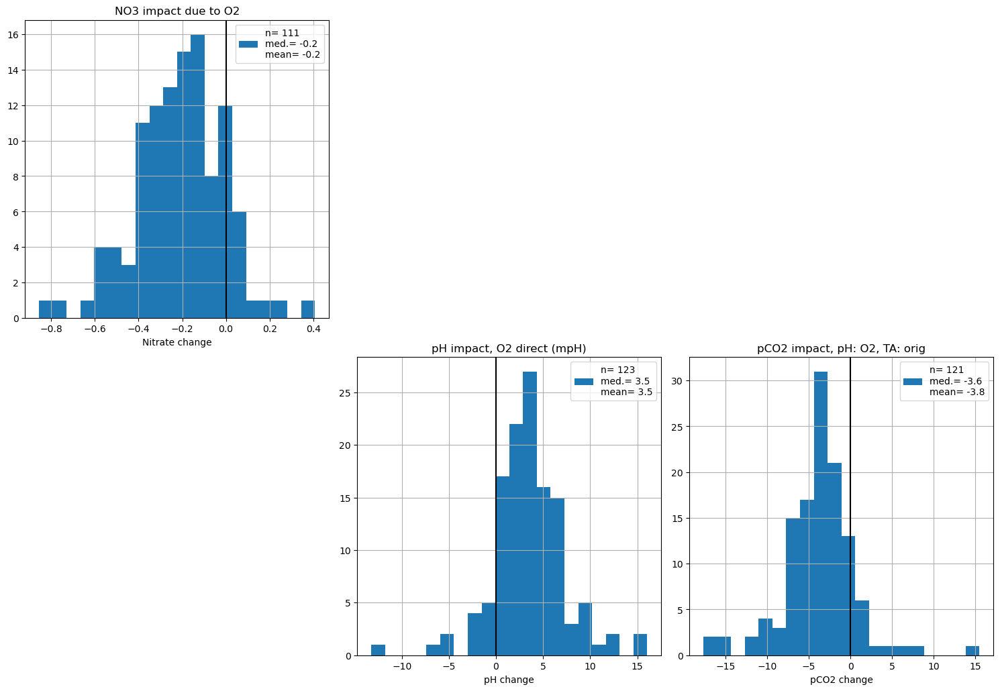

In [35]:
# plotting histograms of total impacts from various combination of factors
fig = plt.subplots(figsize=(15,15))

plt.subplot(331)
nmedian = np.around(o2_impact_no3['no3_impact'].median(), decimals=1)
nmean = np.around(o2_impact_no3['no3_impact'].mean(), decimals=1)

pos = plt.hist(o2_impact_no3['no3_impact'], bins=20, label='n= ' + str(o2_impact_no3['no3_impact'].count()) + '\nmed.= '+str(nmedian) + '\nmean= '+str(nmean) )
plt.title('NO3 impact due to O2')
plt.xlabel('Nitrate change')
plt.grid()

plt.axvline(x=0, color='k')
plt.legend()

# plt.subplot(332)
# nmedian = np.around(o2_impact_no3_alone['pH_impact'].median()*1000, decimals=1)
# nmean = np.around(o2_impact_no3_alone['pH_impact'].mean()*1000, decimals=1)

# pos = plt.hist(o2_impact_no3_alone['pH_impact']*1000, bins=20, label='n= ' + str(o2_impact_no3_alone['pH_impact'].count()) + '\nmed.= '+str(nmedian) + '\nmean= '+str(nmean) )
# plt.title('pH impact, NO3 alone (mpH)')
# plt.xlabel('pH change')
# plt.grid()
# plt.axvline(x=0, color='k')
# plt.legend()

# plt.subplot(443)
# nmedian = np.around(o2_impact_no3_alone['TA_impact'].median(), decimals=1)

# pos = plt.hist(o2_impact_no3_alone['TA_impact'], bins=20, label='n= ' + str(o2_impact_no3_alone['TA_impact'].count()) + '\nmed.= '+str(nmedian) )
# plt.title('TA impact, NO3 alone')
# plt.xlabel('TA change')
# plt.axvline(x=0, color='k')
# plt.legend()
# plt.grid()

# plt.subplot(333)
# nmedian = np.around(o2_impact_no3_alone['pCO2_impact'].median(), decimals=1)
# nmean = np.around(o2_impact_no3_alone['pCO2_impact'].mean(), decimals=1)

# pos = plt.hist(o2_impact_no3_alone['pCO2_impact'], bins=20, label='n= ' + str(o2_impact_no3_alone['o2_bias'].count()) + '\nmed.= '+str(nmedian) + '\nmean= '+str(nmean) )
# plt.title('pCO2 impact, pH: NO3, TA: orig')
# plt.ylabel('pCO2 change')
# plt.axvline(x=0, color='k')
# plt.legend()
# plt.grid()


plt.subplot(335)
nmedian = np.around(o2_impact_direct_esper['pH_impact'].median()*1000, decimals=1)
nmean = np.around(o2_impact_direct_esper['pH_impact'].mean()*1000, decimals=1)

pos = plt.hist(o2_impact_direct_esper['pH_impact']*1000, bins=20, label='n= ' + str(o2_impact_direct_esper['pH_impact'].count()) + '\nmed.= '+str(nmedian) + '\nmean= '+str(nmean) )
plt.title('pH impact, O2 direct (mpH)')
plt.xlabel('pH change')
plt.axvline(x=0, color='k')
plt.legend()
plt.grid()

plt.subplot(336)
nmedian = np.around(o2_impact_direct_esper['pCO2_impact'].median(), decimals=1)
nmean = np.around(o2_impact_direct_esper['pCO2_impact'].mean(), decimals=1)

pos = plt.hist(o2_impact_direct_esper['pCO2_impact'], bins=20, label='n= ' + str(o2_impact_direct_esper['pCO2_impact'].count()) + '\nmed.= '+str(nmedian) + '\nmean= '+str(nmean) )
plt.title('pCO2 impact, pH: O2, TA: orig')
plt.xlabel('pCO2 change')
plt.axvline(x=0, color='k')
plt.legend()
plt.grid()

# plt.subplot(338)
# nmedian = np.around(o2_no3_impact_pH['pH_impact'].median()*1000, decimals=1)
# nmean= np.around(o2_no3_impact_pH['pH_impact'].mean()*1000, decimals=1)

# pos = plt.hist(o2_no3_impact_pH['pH_impact']*1000, bins=20, label='n= ' + str(o2_no3_impact_pH['pH_impact'].count()) + '\nmed.= '+str(nmedian) + '\nmean= '+str(nmean) )
# plt.title('pH impact, O2, NO3 (mpH)')
# plt.xlabel('pH change')
# plt.axvline(x=0, color='k')
# plt.legend()
# plt.grid()

# plt.subplot(339)
# nmedian = np.around(o2_no3_impact_pH['pCO2_impact'].median(), decimals=1)
# nmean = np.around(o2_no3_impact_pH['pCO2_impact'].mean(), decimals=1)

# pos = plt.hist(o2_no3_impact_pH['pCO2_impact'], bins=20, label='n= ' + str(o2_no3_impact_pH['pCO2_impact'].count()) + '\nmed.= '+str(nmedian)+ '\nmean= '+str(nmean) )
# plt.title('pCO2 impact, pH: O2, NO3 TA: orig')
# plt.xlabel('pCO2 change')
# plt.axvline(x=0, color='k')
# plt.legend()
# plt.grid()

# plt.subplot(4,4, 16)
# nmedian = np.around(o2_no3_impact_pH_TA['pCO2_impact'].median(), decimals=1)

# pos = plt.hist(o2_no3_impact_pH_TA['pCO2_impact'], bins=20, label='n= ' + str(o2_no3_impact_pH_TA['pCO2_impact'].count()) + '\nmed.= '+str(nmedian) )
# plt.title('pCO2 impact, pH: O2, NO3 TA: NO3')
# plt.xlabel('pCO2 change')
# plt.axvline(x=0, color='k')
# plt.legend()

# plt.grid()
plt.tight_layout()
#plt.show()

if air_cal_only==True:
    plot_filename = 'BGC impacts due to O2 bias - histogram plot - air_cal_only_ESPERv2'
else:
    plot_filename = 'BGC impacts due to O2 bias - histogram plot - all pH floats_ESPERv2'


plt.savefig(output_dir_figs + plot_filename + '.png', dpi=300)



Plot maps of offsets for pH equipped floats: 

In [112]:
(o2_impact_direct['pH_impact']*1000)/o2_impact_direct['o2_bias']

0     -0.738220
1     -1.316934
2     -1.202974
3     -0.815743
4     -1.862291
         ...   
118   -1.383782
119   -0.803081
120   -2.027008
121   -2.245241
122   -0.253676
Length: 123, dtype: float64

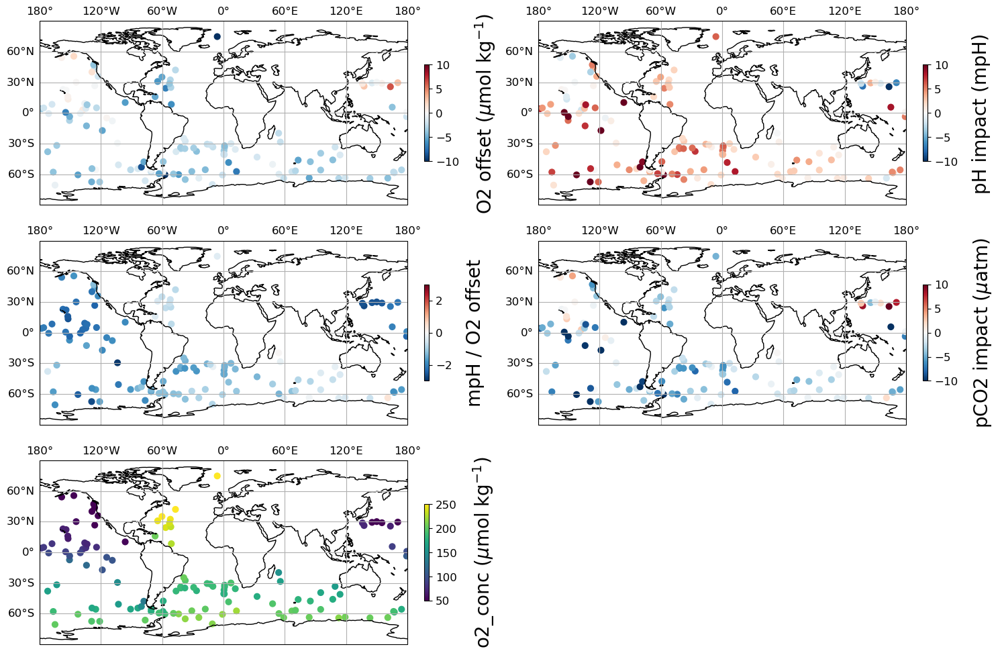

In [244]:
fig = plt.figure(figsize=(15, 10))

ax = plt.subplot(321, projection=ccrs.PlateCarree())

ax.coastlines()
ax.set_global()
gl = ax.gridlines(draw_labels=True)
gl.right_labels = False
gl.bottom_labels = False

sct = plt.scatter(o2_impact_direct['long'], o2_impact_direct['lat'],
                c=o2_impact_direct['o2_bias'], cmap='RdBu_r',s=40,vmin=-10,vmax=10)

cbar = plt.colorbar(sct, fraction=.08, pad = 0.04, shrink=0.5)
cbar.set_label('O2 offset ($\mu$mol kg$^{-1}$)', labelpad=15, fontsize=15)

ax = plt.subplot(322, projection=ccrs.PlateCarree())

ax.coastlines()
ax.set_global()
gl = ax.gridlines(draw_labels=True)
gl.right_labels = False
gl.bottom_labels = False
sct = plt.scatter(o2_impact_direct['long'], o2_impact_direct['lat'],
                c=o2_impact_direct['pH_impact']*1000, cmap='RdBu_r',s=40,vmin=-10,vmax=10)

cbar = plt.colorbar(sct, fraction=.08, pad = 0.04, shrink=0.5)
cbar.set_label('pH impact (mpH)', labelpad=15, fontsize=15)

ax = plt.subplot(323, projection=ccrs.PlateCarree())

ax.coastlines()
ax.set_global()
gl = ax.gridlines(draw_labels=True)
gl.right_labels = False
gl.bottom_labels = False
sct = plt.scatter(o2_impact_direct['long'], o2_impact_direct['lat'],
                c=(o2_impact_direct['pH_impact']*1000)/o2_impact_direct['o2_bias'], cmap='RdBu_r',s=40,vmin=-3,vmax=3)

cbar = plt.colorbar(sct, fraction=.08, pad = 0.04, shrink=0.5)
cbar.set_label('mpH / O2 offset', labelpad=15, fontsize=15)

ax = plt.subplot(324, projection=ccrs.PlateCarree())

ax.coastlines()
ax.set_global()
gl = ax.gridlines(draw_labels=True)
gl.right_labels = False
gl.bottom_labels = False
sct = plt.scatter(o2_impact_direct['long'], o2_impact_direct['lat'],
                c=o2_impact_direct['pCO2_impact'], cmap='RdBu_r',s=40,vmin=-10,vmax=10)

cbar = plt.colorbar(sct, fraction=.08, pad = 0.04, shrink=0.5)
cbar.set_label('pCO2 impact ($\mu$atm)', labelpad=15, fontsize=15)

ax = plt.subplot(325, projection=ccrs.PlateCarree())

ax.coastlines()
ax.set_global()
gl = ax.gridlines(draw_labels=True)
gl.right_labels = False
gl.bottom_labels = False
sct = plt.scatter(o2_impact_direct['long'], o2_impact_direct['lat'],
                c=o2_impact_direct['o2_conc'], cmap='viridis',s=40,vmin=50,vmax=250)

cbar = plt.colorbar(sct, fraction=.08, pad = 0.04, shrink=0.5)
cbar.set_label('o2_conc ($\mu$mol kg$^{-1}$)', labelpad=15, fontsize=15)

plt.tight_layout()

# Show the plot
plt.show()

R-squared: 0.478557


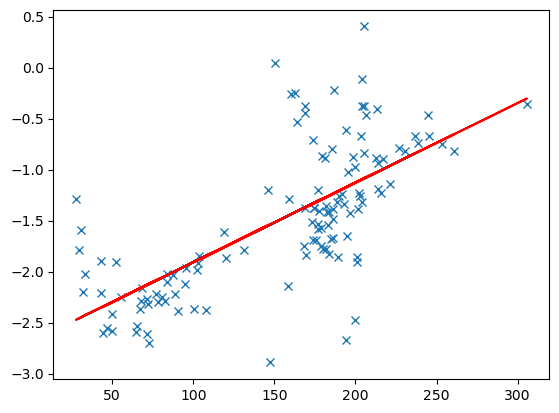

In [128]:
plt.plot(o2_impact_direct['o2_conc'], (o2_impact_direct['pH_impact']*1000)/o2_impact_direct['o2_bias'], linestyle='None', marker='x')

res = stats.linregress(o2_impact_direct['o2_conc'], (o2_impact_direct['pH_impact']*1000)/o2_impact_direct['o2_bias'])
plt.plot(o2_impact_direct['o2_conc'], res.intercept + res.slope*o2_impact_direct['o2_conc'], 'r', label='fitted line')
print(f"R-squared: {res.rvalue**2:.6f}")

In [ ]:

for n in range(last, float_wmo_list.shape[0]): #range(0, float_wmo_list.shape[0]): #range(34, 35): 
    wmo_n = float_wmo_list[n]
    if glodap_offsets_p.pH_group[glodap_offsets_p.index==wmo_n].values=='no pH':
        continue
    
    # if oxygen offset is nan, then skip
    if np.isnan(glodap_offsets_p.DOXY_ADJUSTED_offset_trimmed[glodap_offsets_p.index==wmo_n].values):
        continue

    print('N: ' + str(n) + ' ' + str(wmo_n) + ' started')
    
    argo_derived_n = xr.load_dataset(argo_path_derived+ str(wmo_n) + '_derived.nc')

    nprof = argo_derived_n.LATITUDE.shape[0]
    if nprof==1: # if there is only one profile, probably don't want to trust any offset
        continue

    # Check for presence of non-nan pH
    if ~np.any(~np.isnan(argo_derived_n['PH_IN_SITU_TOTAL_ADJUSTED'])):
        continue
    
    # load interpolated file
    argo_interp_n = xr.load_dataset(argo_path_interpolated + str(wmo_n) + '_interpolated.nc')

    # initialize coordinate and measurement arrays
    Coordinates_all = np.empty([nprof, 3],dtype=float)
    Coordinates_all[:] = np.nan
       
    # Measurements_all = np.empty([nprof, 4],dtype=float)
    # Measurements_all[:] = np.nan

    Measurements_all_S_T_O2 = np.empty([nprof, 3],dtype=float)
    Measurements_all_S_T_O2[:] = np.nan
    for p in range(nprof):
        # load interpolated argo_data so that 1500 m data is present 
        argo_profile = argo_interp_n.isel(N_PROF=p)

        # argo_profile = argo_interp_wmo[wmo_n].isel(N_PROF=p)
        argo_profile.load()
        data_1500 = argo_profile.where(argo_profile.PRES_ADJUSTED==1500, drop=True) 
        if data_1500.LATITUDE.size==0:
            continue
        #index_1500 = argo_profile.PRES_ADJUSTED==1500 #argo_wmo[wmo_n].PRES_ADJUSTED[p,:]==1500

        #argo_wmo[5904659].PSAL_ADJUSTED[0,index_1500]
        Coordinates_all[p,:] = np.stack((data_1500.LONGITUDE.values, 
                            data_1500.LATITUDE.values, 
                            data_1500.PRES_ADJUSTED.values),
                            axis=1)
        # Measurements_all[p,:] = np.stack((data_1500.PSAL_ADJUSTED.values, 
        #                      data_1500.TEMP_ADJUSTED.values, 
        #                      data_1500.NITRATE_ADJUSTED.values, 
        #                      data_1500.DOXY_ADJUSTED.values),
        #                      axis=1)
        
        Measurements_all_S_T_O2[p,:] = np.stack((data_1500.PSAL_ADJUSTED.values, 
                             data_1500.TEMP_ADJUSTED.values, 
                             data_1500.DOXY_ADJUSTED.values),
                             axis=1)
    if np.sum(~np.isnan(Coordinates_all))==0: # if no valid 1500 meter data is present, skip 
        continue

    # calculate decimal_year for ESPER
    # da = argo_interp_wmo[wmo_n].juld
    da = argo_interp_n.juld
    decimal_year = da.dt.year + (da.dt.dayofyear - 1 + (da.dt.hour * 3600 + da.dt.minute * 60 + da.dt.second) / 86400) / (365 + da.dt.is_leap_year)

    # calculate LIPHR pH at 1500 m using original data from all profiles
    orig_pH = carbon_utils.LIPHR_matlab(LIPHR_path,
                                    Coordinates_all.tolist(),
                                    Measurements_all_S_T_O2.tolist(),
                                    MeasIDVec_LIR, 
                                    OAAdjustTF = False)  
    
    # remove data when oxygen is NaN - avoids biasing difference low
    pH_orig_no_nan = np.copy(orig_pH)
    pH_orig_no_nan[np.isnan(Measurements_all_S_T_O2[:,2])] = np.nan
   
    # save 1500 pH orig
    argo_derived_n['pH_1500_orig_LIPHR'] = (['N_PROF'],np.empty(argo_derived_n.PRES_ADJUSTED.shape[0])) #nprof x nlevel
    argo_derived_n.pH_1500_orig_LIPHR[:] = pH_orig_no_nan[:,0]

    # # calculate ESPER pH at 1500 m using original data from all profiles
    # # calculate ESPER pH at 1500 m using original data from all profiles
    orig_pH_ESPER = carbon_utils.ESPER_mixed_matlab(LIPHR_path,
                                                    DesiredVariables,
                                                    Coordinates_all.tolist(),
                                                    Measurements_all_S_T_O2.tolist(),
                                                    MeasIDVec_ESPER,
                                                    Equations, 
                                                    decimal_year.values.tolist(), 
                                                    0)
    # remove data when oxygen is NaN - avoids biasing difference low
    pH_orig_ESPER_no_nan = np.copy(orig_pH_ESPER)
    pH_orig_ESPER_no_nan[np.isnan(Measurements_all_S_T_O2[:,2])] = np.nan
   
    # save 1500 pH orig
    argo_derived_n['pH_1500_orig_ESPER'] = (['N_PROF'],np.empty(argo_derived_n.PRES_ADJUSTED.shape[0])) #nprof x nlevel
    argo_derived_n.pH_1500_orig_ESPER[:] = pH_orig_ESPER_no_nan[:,0]

    # create a second Measurements array that adjusts oxygen according to the mean glodap bias. Subtract the offset to correct it properly
    # Measurements_o2_offset = np.concatenate(([Measurements_all[:,0]], 
    #                               [Measurements_all[:,1]],
    #                               [Measurements_all[:,2]],
    #                               [Measurements_all[:,3]] - 
    #                               glodap_offsets_p.DOXY_ADJUSTED_offset_trimmed[glodap_offsets_p.index==wmo_n].values))
    # Measurements_o2_offset = np.transpose(Measurements_o2_offset)
    
    # create a measurements_offset array that only has S, O2, and T:
    Measurements_S_T_O2_w_o2_offset = np.concatenate(([Measurements_all_S_T_O2[:,0]], 
                                    [Measurements_all_S_T_O2[:,1]],
                                    [Measurements_all_S_T_O2[:,2]] - 
                                    glodap_offsets_p.DOXY_ADJUSTED_offset_trimmed[glodap_offsets_p.index==wmo_n].values))
    Measurements_S_T_O2_w_o2_offset = np.transpose(Measurements_S_T_O2_w_o2_offset)


    # calculate LIPHR pH at 1500 m with oxygen adjustment
    pH_o2_adjust = carbon_utils.LIPHR_matlab(LIPHR_path,
                                    Coordinates_all.tolist(),
                                    Measurements_S_T_O2_w_o2_offset.tolist(),
                                    MeasIDVec_LIR, 
                                    OAAdjustTF = False)  

    # remove data when oxygen is NaN - avoids biasing difference low
    pH_o2_adjust_no_nan = np.copy(pH_o2_adjust)
    pH_o2_adjust_no_nan[np.isnan(Measurements_all_S_T_O2[:,2])] = np.nan
   
    argo_derived_n['pH_1500_O2_ADJUST_LIPHR'] = (['N_PROF'],np.empty(argo_derived_n.PRES_ADJUSTED.shape[0])) #nprof x nlevel
    argo_derived_n.pH_1500_O2_ADJUST_LIPHR[:] = pH_o2_adjust_no_nan[:,0]
    # difference between pH_O2_orig_LIPHR and PH_IN_SITU_TOTAL_ADJUSTED- should that average 0? 
    # Impact of O2 can be seen in the test_pH minus new_pH average 
    
    argo_derived_n['PH_IN_SITU_TOTAL_ADJUSTED_w_O2_ADJUST'] = \
        argo_derived_n.PH_IN_SITU_TOTAL_ADJUSTED + np.nanmean(pH_o2_adjust_no_nan - pH_orig_no_nan)* \
        ((np.nanmean(Measurements_all_S_T_O2[:,1]+273.15))/(argo_derived_n.TEMP_ADJUSTED + 273.15)) #2023_10_02 adding temperature dependency of k0
    

        # calculate LIPHR pH at 1500 m with oxygen adjustment
    pH_ESPER_o2_adjust = carbon_utils.ESPER_mixed_matlab(LIPHR_path,
                                                    DesiredVariables,
                                                    Coordinates_all.tolist(),
                                                    Measurements_S_T_O2_w_o2_offset.tolist(),
                                                    MeasIDVec_ESPER,
                                                    Equations, 
                                                    decimal_year.values.tolist(), 
                                                    0)

    # remove data when oxygen is NaN - avoids biasing difference low
    pH_ESPER_o2_adjust_no_nan = np.copy(pH_ESPER_o2_adjust)
    pH_ESPER_o2_adjust_no_nan[np.isnan(Measurements_all_S_T_O2[:,2])] = np.nan
   
    argo_derived_n['pH_1500_O2_ADJUST_ESPER'] = (['N_PROF'],np.empty(argo_derived_n.PRES_ADJUSTED.shape[0])) #nprof x nlevel
    argo_derived_n.pH_1500_O2_ADJUST_ESPER[:] = pH_ESPER_o2_adjust_no_nan[:,0]
    # difference between pH_O2_orig_LIPHR and PH_IN_SITU_TOTAL_ADJUSTED- should that average 0? 
    # Impact of O2 can be seen in the test_pH minus new_pH average 
    
    argo_derived_n['PH_IN_SITU_TOTAL_ADJUSTED_w_O2_ADJUST_ESPER'] = \
        argo_derived_n.PH_IN_SITU_TOTAL_ADJUSTED + np.nanmean(pH_ESPER_o2_adjust_no_nan - pH_orig_ESPER_no_nan)* \
        ((np.nanmean(Measurements_all_S_T_O2[:,1]+273.15))/(argo_derived_n.TEMP_ADJUSTED + 273.15)) #2023_10_02 adding temperature dependency of k0
    


    # Calculate TALK wo o2 correction
    # orig_TALK = carbon_utils.LIAR_matlab(LIPHR_path,
    #                                     Coordinates_all.tolist(),
    #                                     Measurements_all_no3.tolist(),
    #                                     MeasIDVec_no3)  
    # argo_derived_n['TALK_1500_orig_LIAR'] = (['N_PROF'],np.empty(argo_derived_n.PRES_ADJUSTED.shape[0])) #nprof x nlevel
    # argo_derived_n.TALK_1500_orig_LIAR[:] = orig_TALK[:,0]

    # # TALK w/ O2 correction
    # TALK_o2_adjust = carbon_utils.LIAR_matlab(LIPHR_path,
    #                                     Coordinates_all.tolist(),
    #                                     Measurements_no3_o2_offset.tolist(),
    #                                     MeasIDVec_no3)  
    
    # # remove data when oxygen is NaN - avoids biasing difference low
    # TALK_o2_adjust_no_nan = np.copy(TALK_o2_adjust)
    # TALK_o2_adjust_no_nan[np.isnan(Measurements_all_no3[:,2])] = np.nan
    
    # argo_derived_n['TALK_1500_O2_ADJUST_LIAR'] = (['N_PROF'],np.empty(argo_derived_n.PRES_ADJUSTED.shape[0])) #nprof x nlevel
    # argo_derived_n.TALK_1500_O2_ADJUST_LIAR[:] = TALK_o2_adjust_no_nan[:,0]

   
    #argo_derived_n['TALK_w_O2_ADJUST'] = \
    #    argo_derived_n.TALK_LIAR + np.nanmean(TALK_o2_adjust_no_nan - orig_TALK)


    # do additional nitrate calculations if NITRATE is present
    if 'NITRATE_ADJUSTED' in argo_derived_n.keys():
            
        # calculate LINR NO3 at 1500m using original data from all profiles
        orig_no3 = carbon_utils.LINR_matlab(LIPHR_path,
                                        Coordinates_all.tolist(),
                                        Measurements_all_S_T_O2.tolist(),
                                        MeasIDVec_LIR)  
        
        argo_derived_n['NO3_1500_orig_LINR'] = (['N_PROF'],np.empty(argo_derived_n.PRES_ADJUSTED.shape[0])) #nprof x nlevel
        argo_derived_n.NO3_1500_orig_LINR[:] = orig_no3[:,0]

        # # calculate LINR NO3 at 1500m with oxygen adjustment:
        # Measurements_no3_o2_offset = np.concatenate(([Measurements_all_S_T_O2[:,0]], 
        #                             [Measurements_all_S_T_O2[:,1]],
        #                             [Measurements_all_S_T_O2[:,2]] - 
        #                             glodap_offsets_p.DOXY_ADJUSTED_offset_trimmed[glodap_offsets_p.index==wmo_n].values))

        # Measurements_no3_o2_offset = np.transpose(Measurements_no3_o2_offset)

        no3_o2_adjust = carbon_utils.LINR_matlab(LIPHR_path,
                                        Coordinates_all.tolist(),
                                        Measurements_S_T_O2_w_o2_offset.tolist(),
                                        MeasIDVec_LIR)  
        # remove data when oxygen is NaN - avoids biasing difference low
        no3_o2_adjust_no_nan = np.copy(no3_o2_adjust)
        no3_o2_adjust_no_nan[np.isnan(Measurements_all_S_T_O2[:,2])] = np.nan

        argo_derived_n['NO3_1500_o2_adjust'] = (['N_PROF'],np.empty(argo_derived_n.PRES_ADJUSTED.shape[0])) #nprof x nlevel
        argo_derived_n.NO3_1500_o2_adjust[:] = no3_o2_adjust_no_nan[:,0]
        
        argo_derived_n['NITRATE_ADJUSTED_w_O2_ADJUST'] = \
            argo_derived_n.NITRATE_ADJUSTED + np.nanmean(no3_o2_adjust_no_nan - orig_no3)
    
        # # Calculate pH at 1500 m with ONLY nitrate impacts
        # Measurements_no3_offset_for_pH = np.concatenate(([Measurements_all[:,0]], 
        #                                 [Measurements_all[:,1]],
        #                                 [Measurements_all[:,2] + np.nanmean(no3_o2_adjust - orig_no3)],
        #                                 [Measurements_all[:,3]]))
        
        # Measurements_no3_offset_for_pH = np.transpose(Measurements_no3_offset_for_pH)
        # pH_no3_adjust = carbon_utils.LIPHR_matlab(LIPHR_path,
        #                             Coordinates_all.tolist(),
        #                             Measurements_no3_offset_for_pH.tolist(),
        #                             MeasIDVec, 
        #                             OAAdjustTF = False)  
        
        # remove data when oxygen is NaN - avoids biasing difference low
        # pH_no3_adjust_no_nan = np.copy(pH_no3_adjust)
        # pH_no3_adjust_no_nan[np.isnan(Measurements_all[:,3])] = np.nan

        # argo_derived_n['pH_1500_no3_LIPHR'] = (['N_PROF'],np.empty(argo_derived_n.PRES_ADJUSTED.shape[0])) #nprof x nlevel
        # argo_derived_n.pH_1500_no3_LIPHR[:] = pH_no3_adjust_no_nan[:,0]

        # # apply mean pH difference at 1500 m to full pH profiles and save
        # argo_derived_n['PH_w_NO3_ADJUST'] = \
        #     argo_derived_n.PH_IN_SITU_TOTAL_ADJUSTED + np.nanmean(pH_no3_adjust_no_nan - orig_pH)
        

        # Measurements_o2_offset_no3_offset = np.concatenate(([Measurements_all[:,0]], 
        #                                 [Measurements_all[:,1]],
        #                                 [Measurements_all[:,2] + np.nanmean(no3_o2_adjust - orig_no3)],
        #                                 [Measurements_all[:,3]] - 
        #                                 glodap_offsets_p.DOXY_ADJUSTED_offset_trimmed[glodap_offsets_p.index==wmo_n].values))
        # Measurements_o2_offset_no3_offset = np.transpose(Measurements_o2_offset_no3_offset)

        # # Calculate pH at 1500 m with both oxygen and nitrate impacts
        # pH_o2_adjust_no3_adjust = carbon_utils.LIPHR_matlab(LIPHR_path,
        #                             Coordinates_all.tolist(),
        #                             Measurements_o2_offset_no3_offset.tolist(),
        #                             MeasIDVec, 
        #                             OAAdjustTF = False)  
        # # remove data when oxygen is NaN - avoids biasing difference low
        # pH_o2_adjust_no3_adjust_no_nan = np.copy(pH_o2_adjust_no3_adjust)
        # pH_o2_adjust_no3_adjust_no_nan[np.isnan(Measurements_all[:,3])] = np.nan

        # argo_derived_n['pH_1500_o2_no3_LIPHR'] = (['N_PROF'],np.empty(argo_derived_n.PRES_ADJUSTED.shape[0])) #nprof x nlevel
        # argo_derived_n.pH_1500_o2_no3_LIPHR[:] = pH_o2_adjust_no3_adjust_no_nan[:,0]

        #        # apply mean pH difference at 1500 m to full pH profiles and save
        # argo_derived_n['PH_w_O2_NO3_ADJUST'] = \
        #     argo_derived_n.PH_IN_SITU_TOTAL_ADJUSTED + np.nanmean(pH_o2_adjust_no3_adjust_no_nan - orig_pH)

        # removing this section - nitrate is not used in LIAR, so there is no reason to re-calculate full depth TALK or consider the impact of nitrate 
        ## Calculate full-depth alkalinity using adjusted nitrate - code copied from float_bgc_bias_correction
        ##repeat lats, lons to match pressure shape
        #lons_rep = np.tile(argo_derived_n.LONGITUDE.values,(argo_derived_n.PRES_ADJUSTED.shape[1],1)).T
        #lats_rep = np.tile(argo_derived_n.LATITUDE.values,(argo_derived_n.PRES_ADJUSTED.shape[1],1)).T

        #set Si and PO4 inputs
        #if nitrate, then use redfield for Si and PO4?, otherwise set to 0    
        #SI = argo_n.NITRATE_ADJUSTED*2.5
        #SI.where(~np.isnan(SI), 0)
        #PO4 = argo_n.NITRATE_ADJUSTED/16
        #PO4.where(~np.isnan(PO4),0)
        #Coordinates_TALK = np.stack((lons_rep.flatten(), 
        #                lats_rep.flatten(), 
        #                argo_derived_n.PRES_ADJUSTED.values.flatten()),
        #                axis=1)
        #Measurements_TALK = np.stack((argo_derived_n.PSAL_ADJUSTED.values.flatten(), 
        #                    argo_derived_n.TEMP_ADJUSTED.values.flatten(), 
        #                    argo_derived_n.NITRATE_ADJUSTED_w_O2_ADJUST.values.flatten(), 
        #                    argo_derived_n.DOXY_ADJUSTED.values.flatten()),
        #                    axis=1)
        #    Measurements_TALK_orig = np.stack((argo_derived_n.PSAL_ADJUSTED.values.flatten(), 
        #                   argo_derived_n.TEMP_ADJUSTED.values.flatten(), 
        #                   argo_derived_n.NITRATE_ADJUSTED.values.flatten(), 
        #                   argo_derived_n.DOXY_ADJUSTED.values.flatten()),
        #                   axis=1)
        #MeasIDVec_TALK = [1, 7, 3, 6]
                       

        #results = carbon_utils.LIAR_matlab(LIPHR_path,
        #                                       Coordinates_TALK.tolist(),
        #                                       Measurements_TALK.tolist(),
        #                                       MeasIDVec_TALK,
        #                                       VerboseTF=False)                                  

        #argo_derived_n['TALK_w_NO3_ADJUST'] = (['N_PROF','N_LEVELS'],
        #                        np.reshape(np.asarray(results),argo_derived_n.PH_IN_SITU_TOTAL_ADJUSTED.shape))


        #results = carbon_utils.LIAR_matlab(LIPHR_path,
        #                                       Coordinates_TALK.tolist(),
        #                                       Measurements_TALK_orig.tolist(),
        #                                       MeasIDVec_TALK,
        #                                       VerboseTF=False)  

        #argo_derived_n['TALK_LIAR_recalc'] = (['N_PROF','N_LEVELS'],
        #                        np.reshape(np.asarray(results),argo_derived_n.PH_IN_SITU_TOTAL_ADJUSTED.shape))
    argo_derived_n.to_netcdf(argo_path_derived+ str(wmo_n) + '_derived_2.nc')
    print(str(wmo_n)+ ' finished')

    last=n

/var/folders/7r/4f_w_nb56llcwh96t_pjq_qh0000gn/T/ipykernel_29950/3977441129.py:4: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  ax = plt.subplot(211, projection=ccrs.PlateCarree())


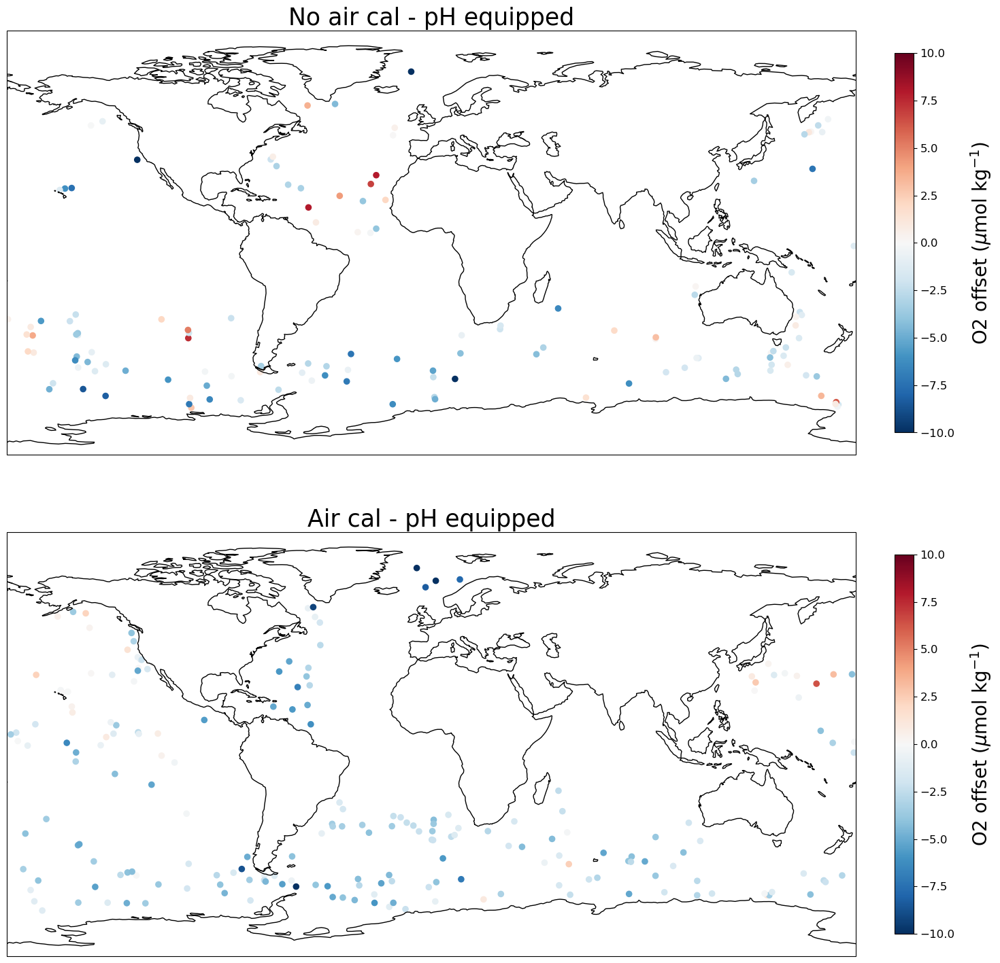

In [ ]:
# pH floats: Air cal and non-air cal only
fig = plt.subplots(figsize=(15,15))

ax = plt.subplot(211, projection=ccrs.PlateCarree())
no_air_cal_ph = offsets_pH.get_group(('no air cal', 'pH'))

# ax = plt.axes(projection=ccrs.PlateCarree())
ax.coastlines()
ax.set_global()
sct = plt.scatter(no_air_cal_ph['main_float_longitude'], no_air_cal_ph['main_float_latitude'],
                c=no_air_cal_ph['DOXY_ADJUSTED_offset_trimmed'], cmap='RdBu_r',s=35,vmin=-10,vmax=10)

cbar = plt.colorbar(sct,fraction=.08, pad = 0.04, shrink=0.8)
cbar.set_label('O2 offset ($\mu$mol kg$^{-1}$)', labelpad=15, fontsize=20) 
plt.title('No air cal - pH equipped', fontsize=25)


ax = plt.subplot(212, projection=ccrs.PlateCarree())
air_cal_ph = offsets_pH.get_group(('air cal', 'pH'))

# ax = plt.axes(projection=ccrs.PlateCarree())
ax.coastlines()
ax.set_global()
sct = plt.scatter(air_cal_ph['main_float_longitude'], air_cal_ph['main_float_latitude'],
                c=air_cal_ph['DOXY_ADJUSTED_offset_trimmed'], cmap='RdBu_r',s=35,vmin=-10,vmax=10)

cbar = plt.colorbar(sct,fraction=.08, pad = 0.04, shrink=0.8)
cbar.set_label('O2 offset ($\mu$mol kg$^{-1}$)', labelpad=15, fontsize=20) 
plt.title('Air cal - pH equipped', fontsize=25)

plt.tight_layout()

plt.savefig(output_dir_figs + 'Float - Glodap Oxygen crossovers_pH_equipped_air_vs_non_v3.png', dpi=300)

In [ ]:
np.nanmean(profile_data)

123.25746

/var/folders/7r/4f_w_nb56llcwh96t_pjq_qh0000gn/T/ipykernel_29950/2474636305.py:3: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  ax = plt.subplot(111, projection=ccrs.PlateCarree())


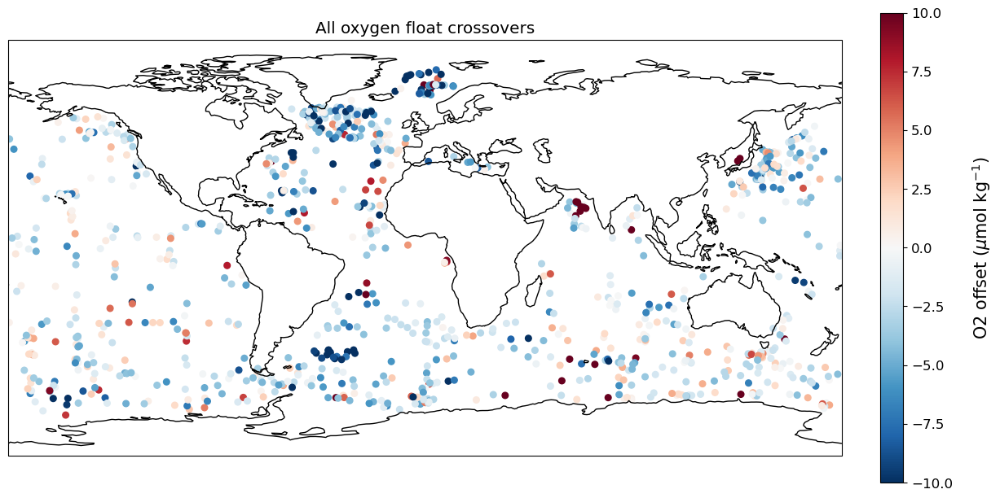

In [ ]:
# all floats
fig = plt.subplots(figsize=(15,15))

ax = plt.subplot(111, projection=ccrs.PlateCarree())

# ax = plt.axes(projection=ccrs.PlateCarree())
ax.coastlines()
ax.set_global()
sct = plt.scatter(glodap_offsets_mean['main_float_longitude'], glodap_offsets_mean['main_float_latitude'],
                c=glodap_offsets_mean['DOXY_ADJUSTED_offset_trimmed'], cmap='RdBu_r',s=30,vmin=-10,vmax=10)

cbar = plt.colorbar(sct, fraction=.08, pad = 0.04, shrink=0.5)
cbar.set_label('O2 offset ($\mu$mol kg$^{-1}$)', labelpad=15, fontsize=15) 
plt.title('All oxygen float crossovers')

plt.savefig(output_dir_figs + 'Float - Glodap Oxygen crossovers_all_v3.png', dpi=300)


/var/folders/7r/4f_w_nb56llcwh96t_pjq_qh0000gn/T/ipykernel_14776/2864940761.py:37: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  ax = plt.subplot(322, projection=ccrs.PlateCarree())
/var/folders/7r/4f_w_nb56llcwh96t_pjq_qh0000gn/T/ipykernel_14776/2864940761.py:51: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  ax = plt.subplot(323, projection=ccrs.PlateCarree())
/var/folders/7r/4f_w_nb56llcwh96t_pjq_qh0000gn/T/ipykernel_14776/2864940761.py:64: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  ax = plt.subplot(326, projection=ccrs.PlateCarree())
/var/folders/7r/4f_w_nb56llcwh96t_pjq_qh0000gn/T/ipykernel_14776/28649

RuntimeError: Colorbar layout of new layout engine not compatible with old engine, and a colorbar has been created.  Engine not changed.

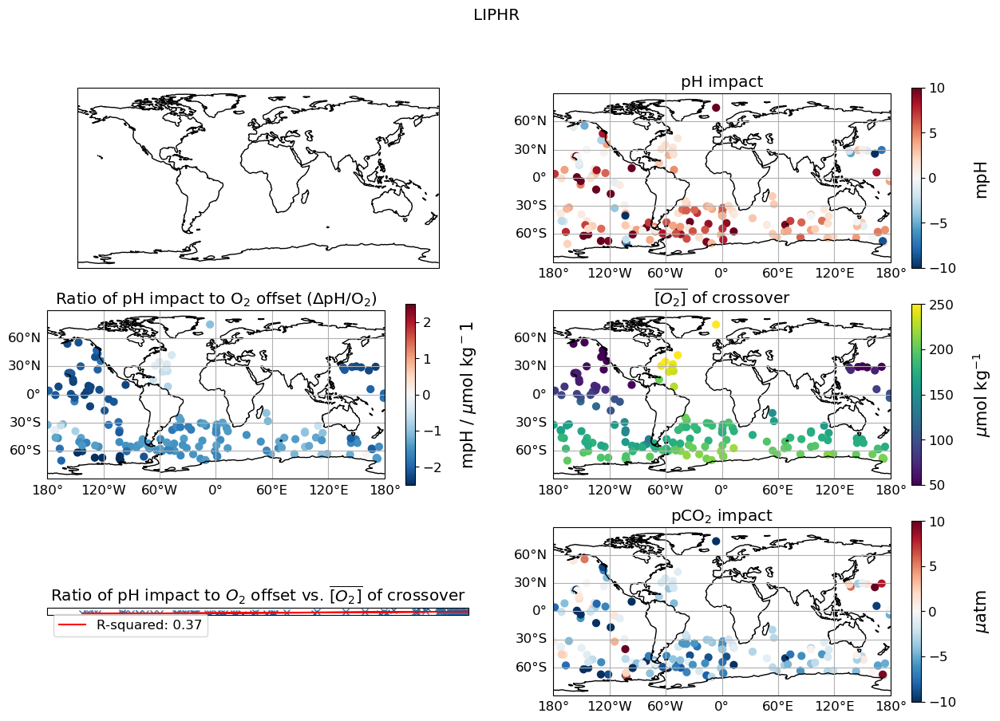

In [ ]:
pH_types = ['LIPHR', 'ESPER']

if air_cal_only==True:
    air_cal_text = 'Air cal. floats only'
else:
    air_cal_text = 'All pH floats'

for ph_alg in pH_types:

    if ph_alg=='LIPHR':
        pH_impact_data = o2_impact_direct
    elif ph_alg=='ESPER':
        pH_impact_data = o2_impact_direct_esper
    

    plot_filename = 'Fig_6 Maps of O2 offsets and impacts '+ air_cal_text + '_' + ph_alg

    # fig = plt.figure(figsize=(15, 10))

    fig, axs = plt.subplot_mosaic([['a.', 'b.'],['c.','d.'],['e.','f.']], layout='constrained', figsize=(15, 10), subplot_kw={'projection': ccrs.PlateCarree()})
    # O2 Offset
    # ax = plt.subplot(321, projection=ccrs.PlateCarree())
    axs['a.'].coastlines()
    ax.set_global()
    gl = ax.gridlines(draw_labels=True)
    gl.right_labels = False
    gl.top_labels = False

    sct = plt.scatter(pH_impact_data['long'], pH_impact_data['lat'],
                    c=pH_impact_data['o2_bias'], cmap='RdBu_r',s=40,vmin=-10,vmax=10)

    # cbar = plt.colorbar(sct, fraction=c_lab_frac, pad = 0.04, shrink=0.5)
    cbar = plt.colorbar(sct)
    cbar.set_label(r'$\mu$mol kg$^{-1}$', labelpad=15, fontsize=15)
    plt.title(r'O$_2$ Offset')

    ax = plt.subplot(322, projection=ccrs.PlateCarree())
    plt.title('pH impact')
    ax.coastlines()
    ax.set_global()
    gl = ax.gridlines(draw_labels=True)
    gl.right_labels = False
    gl.top_labels = False
    sct = plt.scatter(pH_impact_data['long'], pH_impact_data['lat'],
                    c=pH_impact_data['pH_impact']*1000, cmap='RdBu_r',s=40,vmin=-10,vmax=10)

    cbar = plt.colorbar(sct)
    cbar.set_label('mpH', labelpad=15, fontsize=15)


    ax = plt.subplot(323, projection=ccrs.PlateCarree())
    plt.title('Ratio of pH impact to O$_2$ offset ($\Delta$pH/O$_2$)')
    ax.coastlines()
    ax.set_global()
    gl = ax.gridlines(draw_labels=True)
    gl.right_labels = False
    gl.top_labels = False
    sct = plt.scatter(pH_impact_data['long'], pH_impact_data['lat'],
                    c=(pH_impact_data['pH_impact']*1000)/pH_impact_data['o2_bias'], cmap='RdBu_r',s=40,vmin=-2.5,vmax=2.5)

    cbar = plt.colorbar(sct)
    cbar.set_label('mpH / $\mu$mol kg$^-1$', labelpad=15, fontsize=15)

    ax = plt.subplot(326, projection=ccrs.PlateCarree())
    plt.title('pCO$_2$ impact')
    ax.coastlines()
    ax.set_global()
    gl = ax.gridlines(draw_labels=True)
    gl.right_labels = False
    gl.top_labels = False
    sct = plt.scatter(pH_impact_data['long'], pH_impact_data['lat'],
                    c=pH_impact_data['pCO2_impact'], cmap='RdBu_r',s=40,vmin=-10,vmax=10)

    cbar = plt.colorbar(sct)
    cbar.set_label('$\mu$atm', labelpad=15, fontsize=15)

    ax = plt.subplot(324, projection=ccrs.PlateCarree())
    plt.title(r'$\overline{[O_2]}$ of crossover')
    ax.coastlines()
    ax.set_global()
    gl = ax.gridlines(draw_labels=True)
    gl.right_labels = False
    gl.top_labels = False
    sct = plt.scatter(pH_impact_data['long'], pH_impact_data['lat'],
                    c=pH_impact_data['o2_conc'], cmap='viridis',s=40,vmin=50,vmax=250)

    cbar = plt.colorbar(sct)
    cbar.set_label('$\mu$mol kg$^{-1}$', labelpad=15, fontsize=15)

    ax = plt.subplot(325)
    plt.title('Ratio of pH impact to $O_2$ offset vs. $\overline{[O_2]}$ of crossover')
    plt.plot(pH_impact_data['o2_conc'], (pH_impact_data['pH_impact']*1000)/pH_impact_data['o2_bias'],
              linestyle='None', marker='x')

    res = stats.linregress(pH_impact_data['o2_conc'], 
                           (pH_impact_data['pH_impact']*1000)/pH_impact_data['o2_bias'])
    plt.plot(pH_impact_data['o2_conc'], 
             res.intercept + res.slope*pH_impact_data['o2_conc'], 'r', label=f"R-squared: {res.rvalue**2:.2f}")
    plt.ylabel('mpH / $\mu$mol kg$^-1$')
    plt.xlabel('$\overline{[O_2]}$ ($\mu$mol kg$^{-1}$)')
    # Get the x-limit values
    x_limits = plt.xlim()
    y_limits = plt.ylim()
    plt.grid('on')
    plt.legend()

    plt.suptitle(ph_alg)

    plt.tight_layout()
    plt.savefig(manuscript_figs + plot_filename + '.png', dpi=300)


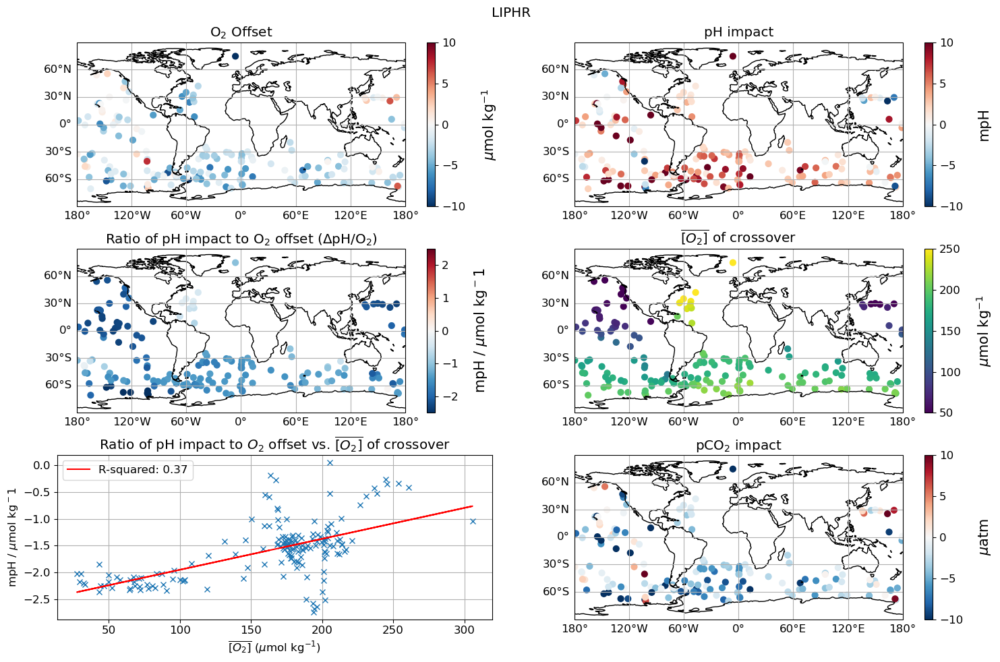

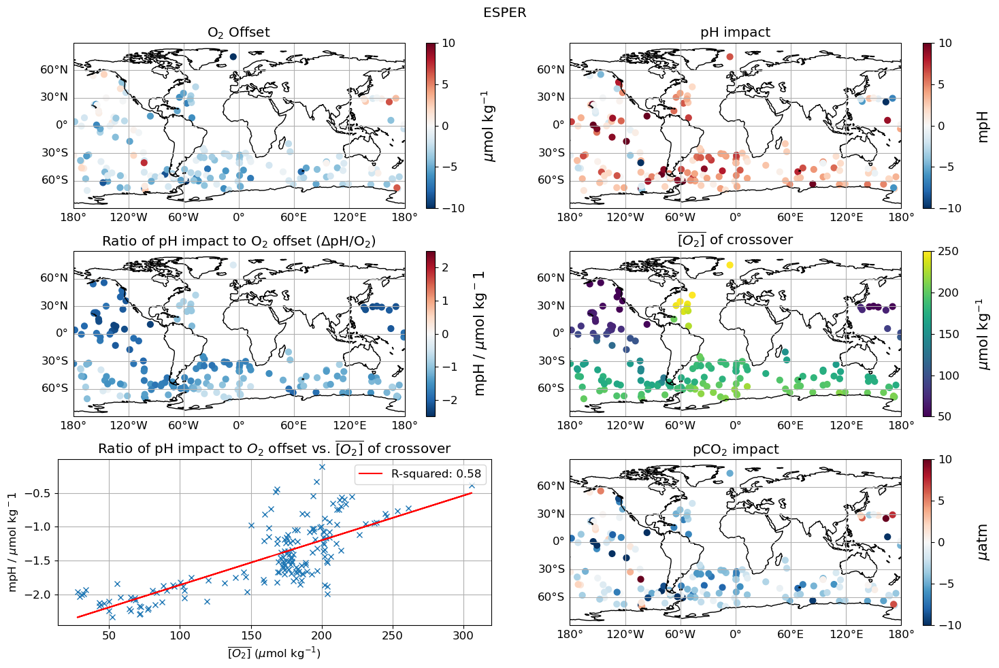

In [ ]:
# c_lab_frac = .1
# c_lab_pad = .02
# c_lab_shrink = 0.5

pH_types = ['LIPHR', 'ESPER']

if air_cal_only==True:
    air_cal_text = 'Air cal. floats only'
else:
    air_cal_text = 'All pH floats'

for ph_alg in pH_types:

    if ph_alg=='LIPHR':
        pH_impact_data = o2_impact_direct
    elif ph_alg=='ESPER':
        pH_impact_data = o2_impact_direct_esper
    

    plot_filename = 'Fig_6 Maps of O2 offsets and impacts '+ air_cal_text + '_' + ph_alg

    fig = plt.figure(figsize=(15, 10))

    # O2 Offset
    ax = plt.subplot(321, projection=ccrs.PlateCarree())
    ax.coastlines()
    ax.set_global()
    gl = ax.gridlines(draw_labels=True)
    gl.right_labels = False
    gl.top_labels = False

    sct = plt.scatter(pH_impact_data['long'], pH_impact_data['lat'],
                    c=pH_impact_data['o2_bias'], cmap='RdBu_r',s=40,vmin=-10,vmax=10)

    # cbar = plt.colorbar(sct, fraction=c_lab_frac, pad = 0.04, shrink=0.5)
    cbar = plt.colorbar(sct)
    cbar.set_label(r'$\mu$mol kg$^{-1}$', labelpad=15, fontsize=15)
    plt.title(r'O$_2$ Offset')

    ax = plt.subplot(322, projection=ccrs.PlateCarree())
    plt.title('pH impact')
    ax.coastlines()
    ax.set_global()
    gl = ax.gridlines(draw_labels=True)
    gl.right_labels = False
    gl.top_labels = False
    sct = plt.scatter(pH_impact_data['long'], pH_impact_data['lat'],
                    c=pH_impact_data['pH_impact']*1000, cmap='RdBu_r',s=40,vmin=-10,vmax=10)

    cbar = plt.colorbar(sct)
    cbar.set_label('mpH', labelpad=15, fontsize=15)


    ax = plt.subplot(323, projection=ccrs.PlateCarree())
    plt.title('Ratio of pH impact to O$_2$ offset ($\Delta$pH/O$_2$)')
    ax.coastlines()
    ax.set_global()
    gl = ax.gridlines(draw_labels=True)
    gl.right_labels = False
    gl.top_labels = False
    sct = plt.scatter(pH_impact_data['long'], pH_impact_data['lat'],
                    c=(pH_impact_data['pH_impact']*1000)/pH_impact_data['o2_bias'], cmap='RdBu_r',s=40,vmin=-2.5,vmax=2.5)

    cbar = plt.colorbar(sct)
    cbar.set_label('mpH / $\mu$mol kg$^-1$', labelpad=15, fontsize=15)

    ax = plt.subplot(326, projection=ccrs.PlateCarree())
    plt.title('pCO$_2$ impact')
    ax.coastlines()
    ax.set_global()
    gl = ax.gridlines(draw_labels=True)
    gl.right_labels = False
    gl.top_labels = False
    sct = plt.scatter(pH_impact_data['long'], pH_impact_data['lat'],
                    c=pH_impact_data['pCO2_impact'], cmap='RdBu_r',s=40,vmin=-10,vmax=10)

    cbar = plt.colorbar(sct)
    cbar.set_label('$\mu$atm', labelpad=15, fontsize=15)

    ax = plt.subplot(324, projection=ccrs.PlateCarree())
    plt.title(r'$\overline{[O_2]}$ of crossover')
    ax.coastlines()
    ax.set_global()
    gl = ax.gridlines(draw_labels=True)
    gl.right_labels = False
    gl.top_labels = False
    sct = plt.scatter(pH_impact_data['long'], pH_impact_data['lat'],
                    c=pH_impact_data['o2_conc'], cmap='viridis',s=40,vmin=50,vmax=250)

    cbar = plt.colorbar(sct)
    cbar.set_label('$\mu$mol kg$^{-1}$', labelpad=15, fontsize=15)

    ax = plt.subplot(325)
    plt.title('Ratio of pH impact to $O_2$ offset vs. $\overline{[O_2]}$ of crossover')
    plt.plot(pH_impact_data['o2_conc'], (pH_impact_data['pH_impact']*1000)/pH_impact_data['o2_bias'],
              linestyle='None', marker='x')

    res = stats.linregress(pH_impact_data['o2_conc'], 
                           (pH_impact_data['pH_impact']*1000)/pH_impact_data['o2_bias'])
    plt.plot(pH_impact_data['o2_conc'], 
             res.intercept + res.slope*pH_impact_data['o2_conc'], 'r', label=f"R-squared: {res.rvalue**2:.2f}")
    plt.ylabel('mpH / $\mu$mol kg$^-1$')
    plt.xlabel('$\overline{[O_2]}$ ($\mu$mol kg$^{-1}$)')
    # Get the x-limit values
    x_limits = plt.xlim()
    y_limits = plt.ylim()
    plt.grid('on')
    plt.legend()

    plt.suptitle(ph_alg)

    plt.tight_layout()
    plt.savefig(manuscript_figs + plot_filename + '.png', dpi=300)

# Show the plot
# plt.show()

Text(0, 0.5, 'Pressure (dbar)')

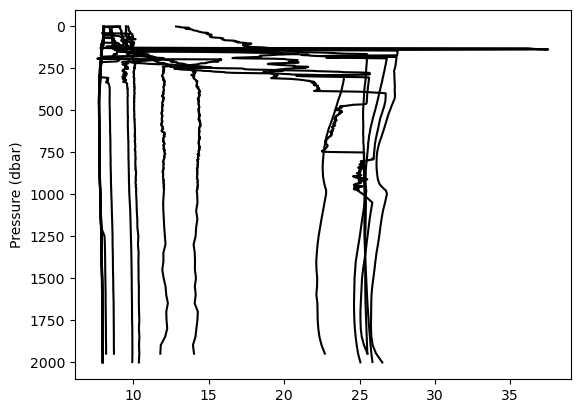

In [ ]:
plt.figure()

for p in range(0, len(argo_n['N_PROF'])):
    profile_pressure = argo_n['PRES_ADJUSTED'].isel(N_PROF=p).values
    profile_data = argo_n['PH_IN_SITU_TOTAL_ADJUSTED'].isel(N_PROF=p).values
    plt.plot(profile_data[~np.isnan(profile_data)]+(p-1)*np.nanmean(profile_data)/10, 
         profile_pressure[~np.isnan(profile_data)], c='black')


plt.gca().invert_yaxis()
#plt.xlabel('Nitrate (µmol/kg)')
plt.ylabel('Pressure (dbar)')

In [ ]:
# check original sprof file
argo_sprof_n = xr.load_dataset(argo_path+'1902382_Sprof.nc')


In [ ]:
argo_sprof_n

<xarray.Dataset>
Dimensions:                          (N_PROF: 23, N_PARAM: 9, N_CALIB: 1,
                                      N_LEVELS: 527)
Dimensions without coordinates: N_PROF, N_PARAM, N_CALIB, N_LEVELS
Data variables: (12/93)
    DATA_TYPE                        object b'Argo synthetic profile          '
    FORMAT_VERSION                   object b'1.0 '
    HANDBOOK_VERSION                 object b'1.2 '
    REFERENCE_DATE_TIME              object b'19500101000000'
    DATE_CREATION                    object b'20220825072049'
    DATE_UPDATE                      object b'20220825072049'
    ...                               ...
    NITRATE                          (N_PROF, N_LEVELS) float32 nan nan ... nan
    NITRATE_QC                       (N_PROF, N_LEVELS) object nan nan ... nan
    NITRATE_dPRES                    (N_PROF, N_LEVELS) float32 nan nan ... nan
    NITRATE_ADJUSTED                 (N_PROF, N_LEVELS) float32 nan nan ... nan
    NITRATE_ADJUSTED_QC              (N_PROF, N_LEVELS) object nan nan ... nan
    NITRATE_ADJUSTED_ERROR           (N_PROF, N_LEVELS) float32 nan nan ... nan
Attributes:
    title:                Argo float vertical profile
    institution:          AOML
    source:               Argo float
    history:              2022-08-25T07:20:49Z creation (software version 1.1...
    references:           http://www.argodatamgt.org/Documentation
    user_manual_version:  1.0
    Conventions:          Argo-3.1 CF-1.6
    featureType:          trajectoryProfile
    software_version:     1.13 (version 09.06.2022 for ARGO_simplified_profile)

In [ ]:
# Function to convert an array from NumPy datetime64 to Python float format
def datetime_to_float(dt):
  return (dt - np.datetime64('1900-01-01')) / np.timedelta64(1,'D')

# Function to convert an array from Python float to NumPy datetime64 format
def float_to_datetime(nums):
  return (nums * np.timedelta64(1,'D')) + np.datetime64('1900-01-01')

# Function to interpolate data from a specified float parameter to a uniform time and pressure grid
def interpolate_depth_section(param_name,specify_qc_flags=None,pres_interval=1.0):
  """
  Arguments:
      param_name: string with netCDF file parameter name (e.g., 'TEMP_ADJUSTED') to interpolate
      specify_qc_flags: None to ignore QC flags
                        or a list of QC flags (e.g., [1,2,3]) indicating which data to retain before interpolation
      pres_interval: vertical resolution for interpolating pressure (z) axis (default: 1.0 dbar)
  
  Returns:
      time_coord: 1-D NumPy array with original profile timestamps in np.datetime64 format
      pres_coord: 1-D NumPy array with a uniform pressure (z) coordinate from 0 dbar to the deepest recorded
                  pressure value, at a resolution of  dbar
      time_grid: 2-D NumPy array with the meshed grid of time_coord
      pres_grid: 2-D NumPy array with the meshed grid of pres_coord
      param_gridded: 2-D NumPy array with the interpolated parameter values at the locations of time_grid and pres_grid

  """

  # New grid points
  time_coord = data['JULD'].values
  pres_coord = np.arange(0,data['PRES'].max(),pres_interval)
  time_grid, pres_grid = np.meshgrid(time_coord,pres_coord)
  time_grid = datetime_to_float(time_grid)     # Convert from np.datetime64 to float

  # 1-D (flattened) versions of old grids and parameter values
  time_1D = np.tile(data['JULD'].values,(len(data['N_LEVELS']),1)).T.flatten()
  pres_1D = data['PRES'].values.flatten()
  param_1D = data[param_name].values.flatten()
  if param_1D.dtype == object:         # If parameter is an array of QC flag data
    param_1D = param_1D.astype(float)  # Convert QC flags from dtype 'object' to float
    interp_method = 'nearest'          # Use nearest-neighbor interpolation for QC flags to avoid unwanted averaging
  else:
    interp_method = 'linear'           # Use bilinear interpolation for normal data fields

  # Extract only values matching specified QC flags
  if specify_qc_flags is not None:
    qc_1D = data[param_name + '_QC'].values.astype(float).flatten()
    qc_mask = np.tile(False,len(qc_1D))
    for qc_flag in specify_qc_flags:
      qc_mask = np.logical_or(qc_mask,qc_1D == qc_flag)
    time_1D = time_1D[qc_mask]
    pres_1D = pres_1D[qc_mask]
    param_1D = param_1D[qc_mask]

  # Remove NaN values before interpolation
  time_1D = datetime_to_float(time_1D[~np.isnan(param_1D)])       # Convert from np.datetime64 to float
  pres_1D = pres_1D[~np.isnan(param_1D)]
  param_1D = param_1D[~np.isnan(param_1D)]

  # Interpolate from irregular points to grid
  param_gridded = interpolate.griddata((time_1D,pres_1D),param_1D,(time_grid,pres_grid),method=interp_method)

  # Return coordinates, grid, and gridded data
  return time_coord, pres_coord, float_to_datetime(time_grid), pres_grid, param_gridded

In [ ]:
# calculate pCO2 impacts and save out 

derived_functions.calc_derived_3_pCO2_impacts(argo_path_derived, file)
for n in range(0, len(derivedlist)):
        
        print(f' {n+1}' + ' out of: ' + str(len(derivedlist)) + ' File: ' + derivedlist[n]) 
        argo_n = xr.load_dataset(argo_path_derived + derivedlist[n])
        var_list = list(argo_n.data_vars)
        wmo_n = argo_n['wmo']

        if "PH_IN_SITU_TOTAL_ADJUSTED_w_O2_ADJUST" not in var_list:
                print('Skipping')
                continue

       # mean_pH_impact_n = np.nanmean(argo_n['pH_1500_O2_ADJUST_LIPHR'] - argo_n['pH_1500_orig_LIPHR'])
        #pH_impact.append(mean_pH_impact_n)

        #o2_offset_n = glodap_offsets_p.DOXY_ADJUSTED_offset_trimmed[glodap_offsets_p.index==wmo_n.values].values
        #o2_offset.append(o2_offset_n)

        # find 1500m data and save out to explore sensitivity of pH to O2
        #first_filt = argo_n.where(argo_n.PRES_ADJUSTED>1450, drop=True)
        #second_filt = first_filt.where(first_filt.PRES_ADJUSTED<1550, drop=True)
        
        #o2_1500.append(np.nanmean(second_filt.DOXY_ADJUSTED))
        #temp_1500.append(np.nanmean(second_filt.TEMP_ADJUSTED))
        #sal_1500.append(np.nanmean(second_filt.PSAL_ADJUSTED))

        if 'TALK_LIAR' not in argo_n.keys():
                continue

        if 'NITRATE_ADJUSTED' in argo_n.keys():
                SI = argo_n.NITRATE_ADJUSTED*2.5
                SI.where(~np.isnan(SI), 0)
                PO4 = argo_n.NITRATE_ADJUSTED/16
                PO4.where(~np.isnan(PO4),0)
        else:
                SI = np.zeros((argo_n.PH_IN_SITU_TOTAL_ADJUSTED.shape))
                PO4 = np.zeros((argo_n.PH_IN_SITU_TOTAL_ADJUSTED.shape))
        # Calculate pCO2 with all original values
        # replace any negative pH values with nans:
        argo_n['PH_IN_SITU_TOTAL_ADJUSTED'] = \
                argo_n.PH_IN_SITU_TOTAL_ADJUSTED.where(argo_n.PH_IN_SITU_TOTAL_ADJUSTED>0)

        results = pyco2.sys(
                par1=argo_n.TALK_LIAR, 
                par2=argo_n.PH_IN_SITU_TOTAL_ADJUSTED,
                par1_type=1,
                par2_type=3,
                temperature=argo_n.TEMP_ADJUSTED, 
                pressure=argo_n.PRES_ADJUSTED, 
                salinity=argo_n.PSAL_ADJUSTED, 
                temperature_out=argo_n.TEMP_ADJUSTED, #fixed 25C temperature
                pressure_out=argo_n.PRES_ADJUSTED,
                total_silicate=SI,
                total_phosphate=PO4,
                opt_pH_scale = 1, #total
                opt_k_carbonic=10, #Lueker et al. 2000
                opt_k_bisulfate=1, # Dickson 1990 (Note, matlab co2sys combines KSO4 with TB. option 3 = KSO4 of Dickson & TB of Lee 2010)
                opt_total_borate=2, # Lee et al. 2010
                opt_k_fluoride=2, # Perez and Fraga 1987
                opt_buffers_mode=1,
        )
        argo_n['pCO2_pH_orig_TALK_orig'] = (['N_PROF','N_LEVELS'],results['pCO2'])  
        argo_n['DIC_pH_orig_TALK_orig'] = (['N_PROF','N_LEVELS'],results['dic'])  

        # Calculate pCO2 including only the impact of adjusting oxygen on pH MLR
        # replace any negative pH values with nans:
        argo_n['PH_IN_SITU_TOTAL_ADJUSTED_w_O2_ADJUST'] = \
                argo_n.PH_IN_SITU_TOTAL_ADJUSTED_w_O2_ADJUST.where(argo_n.PH_IN_SITU_TOTAL_ADJUSTED_w_O2_ADJUST>0)

        results = pyco2.sys(
                par1=argo_n.TALK_LIAR, 
                par2=argo_n.PH_IN_SITU_TOTAL_ADJUSTED_w_O2_ADJUST,
                par1_type=1,
                par2_type=3,
                temperature=argo_n.TEMP_ADJUSTED, 
                pressure=argo_n.PRES_ADJUSTED, 
                salinity=argo_n.PSAL_ADJUSTED, 
                temperature_out=argo_n.TEMP_ADJUSTED, #fixed 25C temperature
                pressure_out=argo_n.PRES_ADJUSTED,
                total_silicate=SI,
                total_phosphate=PO4,
                opt_pH_scale = 1, #total
                opt_k_carbonic=10, #Lueker et al. 2000
                opt_k_bisulfate=1, # Dickson 1990 (Note, matlab co2sys combines KSO4 with TB. option 3 = KSO4 of Dickson & TB of Lee 2010)
                opt_total_borate=2, # Lee et al. 2010
                opt_k_fluoride=2, # Perez and Fraga 1987
                opt_buffers_mode=1,
        )
        argo_n['pCO2_pH_O2_TALK_orig'] = (['N_PROF','N_LEVELS'],results['pCO2'])  
        argo_n['DIC_pH_O2_TALK_orig'] = (['N_PROF','N_LEVELS'],results['dic'])  

       # ESPER Version: Calculate pCO2 including only the impact of adjusting oxygen on pH MLR
        # replace any negative pH values with nans:
        argo_n['PH_IN_SITU_TOTAL_ADJUSTED_w_O2_ADJUST_ESPER'] = \
                argo_n.PH_IN_SITU_TOTAL_ADJUSTED_w_O2_ADJUST_ESPER.where(argo_n.PH_IN_SITU_TOTAL_ADJUSTED_w_O2_ADJUST_ESPER>0)

        results = pyco2.sys(
                par1=argo_n.TALK_LIAR, 
                par2=argo_n.PH_IN_SITU_TOTAL_ADJUSTED_w_O2_ADJUST_ESPER,
                par1_type=1,
                par2_type=3,
                temperature=argo_n.TEMP_ADJUSTED, 
                pressure=argo_n.PRES_ADJUSTED, 
                salinity=argo_n.PSAL_ADJUSTED, 
                temperature_out=argo_n.TEMP_ADJUSTED, #fixed 25C temperature
                pressure_out=argo_n.PRES_ADJUSTED,
                total_silicate=SI,
                total_phosphate=PO4,
                opt_pH_scale = 1, #total
                opt_k_carbonic=10, #Lueker et al. 2000
                opt_k_bisulfate=1, # Dickson 1990 (Note, matlab co2sys combines KSO4 with TB. option 3 = KSO4 of Dickson & TB of Lee 2010)
                opt_total_borate=2, # Lee et al. 2010
                opt_k_fluoride=2, # Perez and Fraga 1987
                opt_buffers_mode=1,
        )
        argo_n['pCO2_pH_O2_ESPER_TALK_orig'] = (['N_PROF','N_LEVELS'],results['pCO2'])  
        argo_n['DIC_pH_O2_ESPER_TALK_orig'] = (['N_PROF','N_LEVELS'],results['dic'])  


        # if 'PH_w_NO3_ADJUST' in argo_n.keys():
        #         # Calculate pCO2 including only the impact of adjusting nitrate on pH MLR
        #         # replace any negative pH values with nans:
        #         argo_n['PH_w_NO3_ADJUST'] = \
        #                 argo_n.PH_w_NO3_ADJUST.where(argo_n.PH_w_NO3_ADJUST>0)

        #         results = pyco2.sys(
        #                 par1=argo_n.TALK_LIAR, 
        #                 par2=argo_n.PH_w_NO3_ADJUST,
        #                 par1_type=1,
        #                 par2_type=3,
        #                 temperature=argo_n.TEMP_ADJUSTED, 
        #                 pressure=argo_n.PRES_ADJUSTED, 
        #                 salinity=argo_n.PSAL_ADJUSTED, 
        #                 temperature_out=argo_n.TEMP_ADJUSTED, #fixed 25C temperature
        #                 pressure_out=argo_n.PRES_ADJUSTED,
        #                 total_silicate=SI,
        #                 total_phosphate=PO4,
        #                 opt_pH_scale = 1, #total
        #                 opt_k_carbonic=10, #Lueker et al. 2000
        #                 opt_k_bisulfate=1, # Dickson 1990 (Note, matlab co2sys combines KSO4 with TB. option 3 = KSO4 of Dickson & TB of Lee 2010)
        #                 opt_total_borate=2, # Lee et al. 2010
        #                 opt_k_fluoride=2, # Perez and Fraga 1987
        #                 opt_buffers_mode=1,
        #         )
        #         argo_n['pCO2_pH_NO3_TALK_orig'] = (['N_PROF','N_LEVELS'],results['pCO2'])  

        # if 'TALK_w_NO3_ADJUST' in argo_n.keys():
                ## Calculate pCO2 with ONLY TALK change due to Nitrate  
                #results = pyco2.sys(
                #        par1=argo_n.TALK_w_NO3_ADJUST, 
                #        par2=argo_n.PH_IN_SITU_TOTAL_ADJUSTED,
                #         par1_type=1,
                #         par2_type=3,
                #         temperature=argo_n.TEMP_ADJUSTED, 
                #         pressure=argo_n.PRES_ADJUSTED, 
                #         salinity=argo_n.PSAL_ADJUSTED, 
                #         temperature_out=argo_n.TEMP_ADJUSTED, #fixed 25C temperature
                #         pressure_out=argo_n.PRES_ADJUSTED,
                #         total_silicate=SI,
                #         total_phosphate=PO4,
                #         opt_pH_scale = 1, #total
                #         opt_k_carbonic=10, #Lueker et al. 2000
                #         opt_k_bisulfate=1, # Dickson 1990 (Note, matlab co2sys combines KSO4 with TB. option 3 = KSO4 of Dickson & TB of Lee 2010)
                #         opt_total_borate=2, # Lee et al. 2010
                #         opt_k_fluoride=2, # Perez and Fraga 1987
                #         opt_buffers_mode=1,
                # )
                # argo_n['pCO2_pH_orig_TALK_NO3'] = (['N_PROF','N_LEVELS'],results['pCO2'])  

                # # Calculate pCO2 with BOTH pH change due to NO3 and TALK change due to Nitrate  
                # results = pyco2.sys(
                #         par1=argo_n.TALK_w_NO3_ADJUST, 
                #         par2=argo_n.PH_w_NO3_ADJUST,
                #         par1_type=1,
                #         par2_type=3,
                #         temperature=argo_n.TEMP_ADJUSTED, 
                #         pressure=argo_n.PRES_ADJUSTED, 
                #         salinity=argo_n.PSAL_ADJUSTED, 
                #         temperature_out=argo_n.TEMP_ADJUSTED, #fixed 25C temperature
                #         pressure_out=argo_n.PRES_ADJUSTED,
                #         total_silicate=SI,
                #         total_phosphate=PO4,
                #         opt_pH_scale = 1, #total
                #         opt_k_carbonic=10, #Lueker et al. 2000
                #         opt_k_bisulfate=1, # Dickson 1990 (Note, matlab co2sys combines KSO4 with TB. option 3 = KSO4 of Dickson & TB of Lee 2010)
                #         opt_total_borate=2, # Lee et al. 2010
                #         opt_k_fluoride=2, # Perez and Fraga 1987
                #         opt_buffers_mode=1,
                # )
                # argo_n['pCO2_pH_NO3_TALK_NO3'] = (['N_PROF','N_LEVELS'],results['pCO2']) 

                                
        # if 'PH_w_O2_NO3_ADJUST' in argo_n.keys():
        #         # pCO2 including pH adjusted for O2 and NO3
        #         # replace any negative pH values with nans:
        #         argo_n['PH_w_O2_NO3_ADJUST'] = \
        #                 argo_n.PH_w_O2_NO3_ADJUST.where(argo_n.PH_w_O2_NO3_ADJUST>0)

        #         results = pyco2.sys(
        #                 par1=argo_n.TALK_LIAR, 
        #                 par2=argo_n.PH_w_O2_NO3_ADJUST,
        #                 par1_type=1,
        #                 par2_type=3,
        #                 temperature=argo_n.TEMP_ADJUSTED, 
        #                 pressure=argo_n.PRES_ADJUSTED, 
        #                 salinity=argo_n.PSAL_ADJUSTED, 
        #                 temperature_out=argo_n.TEMP_ADJUSTED, #fixed 25C temperature
        #                 pressure_out=argo_n.PRES_ADJUSTED,
        #                 total_silicate=SI,
        #                 total_phosphate=PO4,
        #                 opt_pH_scale = 1, #total
        #                 opt_k_carbonic=10, #Lueker et al. 2000
        #                 opt_k_bisulfate=1, # Dickson 1990 (Note, matlab co2sys combines KSO4 with TB. option 3 = KSO4 of Dickson & TB of Lee 2010)
        #                 opt_total_borate=2, # Lee et al. 2010
        #                 opt_k_fluoride=2, # Perez and Fraga 1987
        #                 opt_buffers_mode=1,
        #         )
        #         argo_n['pCO2_pH_O2_NO3_TALK_orig'] = (['N_PROF','N_LEVELS'],results['pCO2'])  

                # if 'TALK_w_NO3_ADJUST' in argo_n.keys():
                #         # pCO2 including pH adjusted for O2 and NO3 and TALK adjusted for NO3
                #         results = pyco2.sys(
                #                 par1=argo_n.TALK_w_NO3_ADJUST, 
                #                 par2=argo_n.PH_w_O2_NO3_ADJUST,
                #                 par1_type=1,
                #                 par2_type=3,
                #                 temperature=argo_n.TEMP_ADJUSTED, 
                #                 pressure=argo_n.PRES_ADJUSTED, 
                #                 salinity=argo_n.PSAL_ADJUSTED, 
                #                 temperature_out=argo_n.TEMP_ADJUSTED, #fixed 25C temperature
                #                 pressure_out=argo_n.PRES_ADJUSTED,
                #                 total_silicate=SI,
                #                 total_phosphate=PO4,
                #                 opt_pH_scale = 1, #total
                #                 opt_k_carbonic=10, #Lueker et al. 2000
                #                 opt_k_bisulfate=1, # Dickson 1990 (Note, matlab co2sys combines KSO4 with TB. option 3 = KSO4 of Dickson & TB of Lee 2010)
                #                 opt_total_borate=2, # Lee et al. 2010
                #                 opt_k_fluoride=2, # Perez and Fraga 1987
                #                 opt_buffers_mode=1,
                #         )
                #         argo_n['pCO2_pH_O2_NO3_TALK_NO3'] = (['N_PROF','N_LEVELS'],results['pCO2'])  

        # currently commented out, will add back in once pH_in_situ_corr is calculated / saved
        # argo_n['PH_IN_SITU_CORR_w_O2_ADJUST_OFFSET'] = \
        #         argo_n.pH_insitu_corr + np.nanmean(argo_n['pH_O2_ADJUST_LIPHR'] - argo_n['pH_orig_LIPHR'])

        # results = pyco2.sys(
        #                 par1=argo_n.TALK_LIAR, 
        #                 par2=argo_n.PH_IN_SITU_CORR_w_O2_ADJUST_OFFSET,
        #                 par1_type=1,
        #                 par2_type=3,
        #                 temperature=argo_n.TEMP_ADJUSTED, 
        #                 pressure=argo_n.PRES_ADJUSTED, 
        #                 salinity=argo_n.PSAL_ADJUSTED, 
        #                 temperature_out=argo_n.TEMP_ADJUSTED, #fixed 25C temperature
        #                 pressure_out=argo_n.PRES_ADJUSTED,
        #                 total_silicate=SI,
        #                 total_phosphate=PO4,
        #                 opt_pH_scale = 1, #total
        #                 opt_k_carbonic=10, #Lueker et al. 2000
        #                 opt_k_bisulfate=1, # Dickson 1990 (Note, matlab co2sys combines KSO4 with TB. option 3 = KSO4 of Dickson & TB of Lee 2010)
        #                 opt_total_borate=2, # Lee et al. 2010
        #                 opt_k_fluoride=2, # Perez and Fraga 1987
        #                 opt_buffers_mode=1,
        # )
        # argo_n['pCO2_pH_CORR_O2_IMPACT'] = (['N_PROF','N_LEVELS'],results['pCO2'])  

        argo_n.to_netcdf(argo_path_derived+ str(wmo_n.values) + '_derived_3.nc')

 1 out of: 217 File: 5906571_derived_2.nc
 2 out of: 217 File: 5906524_derived_2.nc
 3 out of: 217 File: 4903462_derived_2.nc
 4 out of: 217 File: 5905075_derived_2.nc
 5 out of: 217 File: 5904186_derived_2.nc
 6 out of: 217 File: 5903893_derived_2.nc
 7 out of: 217 File: 5906247_derived_2.nc
 8 out of: 217 File: 5906536_derived_2.nc
 9 out of: 217 File: 5906488_derived_2.nc
 10 out of: 217 File: 5904693_derived_2.nc
 11 out of: 217 File: 5906224_derived_2.nc
 12 out of: 217 File: 5906301_derived_2.nc
 13 out of: 217 File: 5906507_derived_2.nc
 14 out of: 217 File: 6903551_derived_2.nc
 15 out of: 217 File: 4903365_derived_2.nc
 16 out of: 217 File: 5904474_derived_2.nc
 17 out of: 217 File: 5906236_derived_2.nc
 18 out of: 217 File: 5905973_derived_2.nc
 19 out of: 217 File: 5906512_derived_2.nc
 20 out of: 217 File: 5906515_derived_2.nc
 21 out of: 217 File: 5906437_derived_2.nc
 22 out of: 217 File: 5904679_derived_2.nc
 23 out of: 217 File: 5904686_derived_2.nc
 24 out of: 217 File

/var/folders/7r/4f_w_nb56llcwh96t_pjq_qh0000gn/T/ipykernel_29950/4216530959.py:4: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  ax = plt.subplot(211, projection=ccrs.PlateCarree())


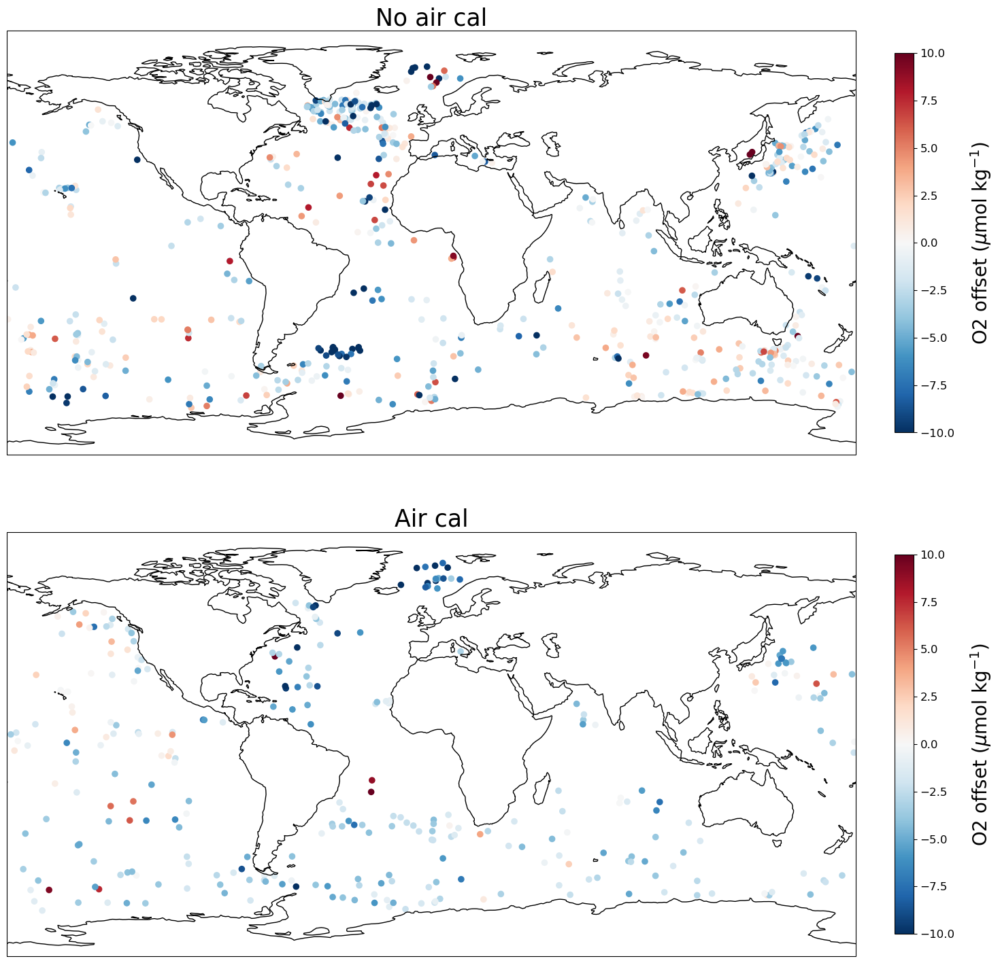

In [ ]:
# Air cal and non-air cal only
fig = plt.subplots(figsize=(15,15))

ax = plt.subplot(211, projection=ccrs.PlateCarree())
No_air_cal_all = offsets_g.get_group('no air cal')

# ax = plt.axes(projection=ccrs.PlateCarree())
ax.coastlines()
ax.set_global()
sct = plt.scatter(No_air_cal_all['main_float_longitude'], No_air_cal_all['main_float_latitude'],
                c=No_air_cal_all['DOXY_ADJUSTED_offset_trimmed'], cmap='RdBu_r',s=35,vmin=-10,vmax=10)

cbar = plt.colorbar(sct,fraction=.08, pad = 0.04, shrink=0.8)
cbar.set_label('O2 offset ($\mu$mol kg$^{-1}$)', labelpad=15, fontsize=20) 
plt.title('No air cal', fontsize=25)


ax = plt.subplot(212, projection=ccrs.PlateCarree())
air_cal_all = offsets_g.get_group('air cal')

# ax = plt.axes(projection=ccrs.PlateCarree())
ax.coastlines()
ax.set_global()
sct = plt.scatter(air_cal_all['main_float_longitude'], air_cal_all['main_float_latitude'],
                c=air_cal_all['DOXY_ADJUSTED_offset_trimmed'], cmap='RdBu_r',s=35,vmin=-10,vmax=10)

cbar = plt.colorbar(sct,fraction=.08, pad = 0.04, shrink=0.8)
cbar.set_label('O2 offset ($\mu$mol kg$^{-1}$)', labelpad=15, fontsize=20) 
plt.title('Air cal', fontsize=25)

plt.tight_layout()

plt.savefig(output_dir_figs + 'Float - Glodap Oxygen crossovers_air_vs_non_v3.png', dpi=300)


/var/folders/7r/4f_w_nb56llcwh96t_pjq_qh0000gn/T/ipykernel_12531/3564392731.py:32: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  plt.subplot(2,2,1)


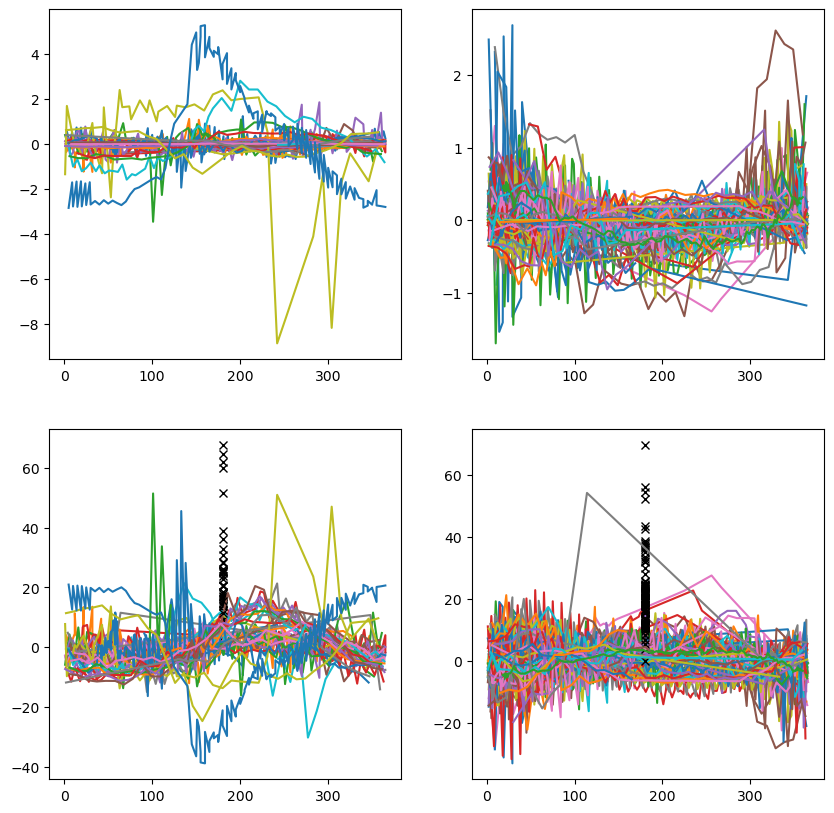

In [ ]:
wmo_seas = np.unique(o2_impact_seasonal['wmo'])
pCO2_anom_ampl_per_all = []
fig = plt.subplots(figsize=(10,10))
# idx = 0
for idx in range(0, len(wmo_seas)):
    wmo_seas[idx]

    pCO2_diff_anom = o2_impact_seasonal['pCO2_diff_surface_pH_o2_TALK_orig'][o2_impact_seasonal['wmo']==wmo_seas[idx]] - \
        np.mean(o2_impact_seasonal['pCO2_diff_surface_pH_o2_TALK_orig'][o2_impact_seasonal['wmo']==wmo_seas[idx]])

    pCO2_diff_anom_per = (o2_impact_seasonal['pCO2_diff_surface_pH_o2_TALK_orig'][o2_impact_seasonal['wmo']==wmo_seas[idx]] - \
        np.mean(o2_impact_seasonal['pCO2_diff_surface_pH_o2_TALK_orig'][o2_impact_seasonal['wmo']==wmo_seas[idx]]))/ \
        np.mean(o2_impact_seasonal['pCO2_diff_surface_pH_o2_TALK_orig'][o2_impact_seasonal['wmo']==wmo_seas[idx]])*100
    
    pCO2_ampl_percent = ((np.max(pCO2_diff_anom) - np.min(pCO2_diff_anom)) / \
        np.abs(np.mean(o2_impact_seasonal['pCO2_diff_surface_pH_o2_TALK_orig'][o2_impact_seasonal['wmo']==wmo_seas[idx]])))*100

    pCO2_anom_ampl_per_all.append(pCO2_ampl_percent)
    dates = o2_impact_seasonal['day_of_year'][o2_impact_seasonal['wmo']==wmo_seas[idx]]

    dates_list = dates.values
    pCO2_anom_list = pCO2_diff_anom.values
    pCO2_anom__per_list = pCO2_diff_anom_per.values

    sorted_indices = np.argsort(dates_list)

    sorted_dates = [dates_list[i] for i in sorted_indices]
    sorted_pCO2_anom = [pCO2_anom_list[i] for i in sorted_indices]
    sorted_pCO2_per_anom = [pCO2_anom__per_list[i] for i in sorted_indices]

    if np.mean(o2_impact_seasonal['lat'][o2_impact_seasonal['wmo']==wmo_seas[idx]])>0:
        plt.subplot(2,2,1) 

        plt.plot(sorted_dates, sorted_pCO2_anom, '-')
 
        plt.subplot(2,2,3) 
        plt.plot(sorted_dates, sorted_pCO2_per_anom, '-')
        plt.plot(180, pCO2_ampl_percent, 'kx')

    else:
        plt.subplot(2,2,2)
        plt.plot(sorted_dates, sorted_pCO2_anom, '-')
 
        plt.subplot(2,2,4) 
        plt.plot(sorted_dates, sorted_pCO2_per_anom, '-')
        plt.plot(180, pCO2_ampl_percent, 'kx')


/var/folders/7r/4f_w_nb56llcwh96t_pjq_qh0000gn/T/ipykernel_48952/2076323682.py:3: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  plt.subplot(221)


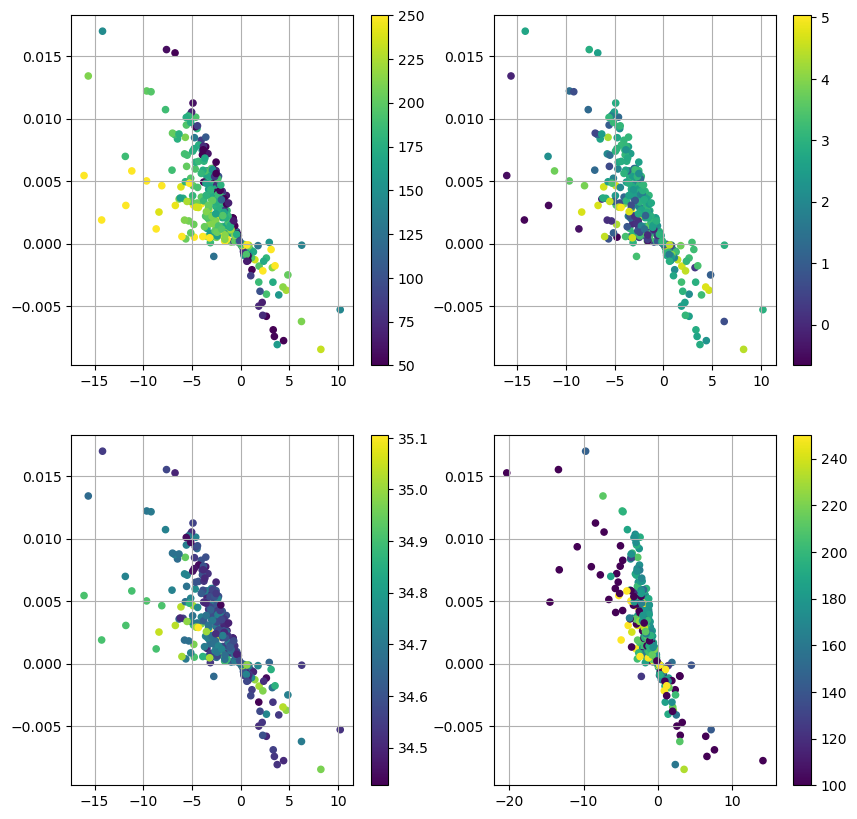

In [ ]:
#fig,(ax1, ax2, ax3, ax4) = plt.subplots(figsize=(10,10), ncols=2, nrows=2)
fig = plt.subplots(figsize=(10,10))
plt.subplot(221)
pos = plt.hist(o2_offset, pH_impact, 20, o2_1500, vmin=50, vmax=250)
plt.colorbar(pos)
plt.grid()

plt.subplot(222)
pos2 = plt.hist(o2_offset, pH_impact, 20, temp_1500)
plt.colorbar(pos2)
plt.grid()

plt.subplot(223)
pos2 = plt.hist(o2_offset, pH_impact, 20, sal_1500)
plt.colorbar(pos2)
plt.grid()

o2_array = np.array(o2_offset).reshape(1,-1)
o2_1500_array = np.array(o2_1500)
pH_impact_array = np.array(pH_impact)

percent_o2 = o2_array/o2_1500_array*100

plt.subplot(224)
pos = plt.hist(percent_o2, pH_impact_array, 20, o2_1500_array, vmin=100, vmax=250)
plt.colorbar(pos)
plt.grid()

plt.savefig(output_dir_figs+ 'pH_impact vs_O2_Offset.png')


[5, 9, 10, 14, 15, 19, 20, 24, 25, 29, 30, 35, 40, 45, 50, 55, 60, 65, 70, 75, 80, 85, 100, 105, 110, 115, 120, 125, 140, 145, 150, 151, 153, 155, 155, 160, 160, 165, 165, 170, 170, 175, 175, 180, 180, 185, 185, 190, 190, 195, 195, 200, 200, 205, 205, 210, 210, 215, 215, 220, 220, 225, 225, 230, 230, 235, 235, 240, 240, 245, 245, 250, 250, 255, 255, 260, 260, 265, 265, 270, 270, 275, 275, 280, 280, 285, 285, 290, 290, 295, 295, 300, 300, 305, 305, 310, 310, 315, 315, 320, 320, 325, 330, 330, 335, 335, 340, 340, 345, 345, 350, 350, 355, 355, 360, 365]
[-2.8461166082143343, -1.7101026877315242, -2.7829400946190397, -1.6741596249203674, -2.7997005911750428, -1.6645578435636033, -2.779870967987325, -1.7563762839335944, -2.7174797859632243, -1.7048288965377658, -2.696340924612276, -2.539972331712864, -2.697608969791009, -2.5035580382581664, -2.6570435893659585, -2.5198394964760276, -2.6285158314291728, -2.7219793384068574, -2.5638556324872077, -2.2469398709995296, -2.007155198576516, -1.934

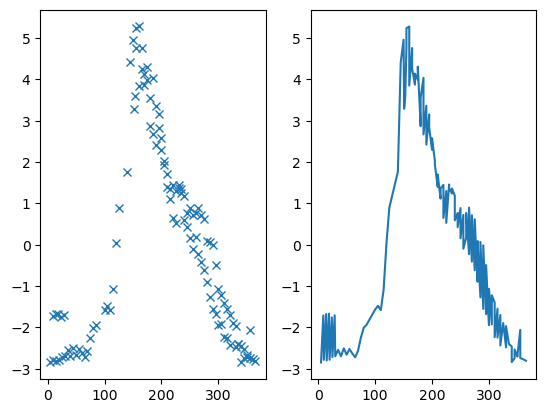

In [ ]:
dates_list = dates.values
pCO2_anom_list = pCO2_diff_anom.values

sorted_indices = np.argsort(dates_list)

sorted_dates = [dates_list[i] for i in sorted_indices]
sorted_pCO2_anom = [pCO2_anom_list[i] for i in sorted_indices]

print(sorted_dates)
print(sorted_pCO2_anom)
plt.subplot(1,2,1)
plt.plot(dates_list, pCO2_anom_list, 'x')
plt.subplot(1,2,2)
plt.plot(sorted_dates, sorted_pCO2_anom, '-')


In [ ]:
new_data_o2_impact_seasonal = pd.DataFrame({
    'long': argo_n.LONGITUDE[~np.isnan(pCO2_diff_surface_pH_o2_TALK_orig)].values.tolist(),
    'lat': argo_n.LATITUDE[~np.isnan(pCO2_diff_surface_pH_o2_TALK_orig)].values.tolist(),
    'pCO2_diff_surface_pH_o2_TALK_orig': pCO2_diff_surface_pH_o2_TALK_orig[~np.isnan(pCO2_diff_surface_pH_o2_TALK_orig)].values.tolist()
})

# Concatenate the new DataFrame to o2_impact_seasonal
o2_impact_seasonal = pd.concat([o2_impact_seasonal, new_data_o2_impact_seasonal], ignore_index=True)

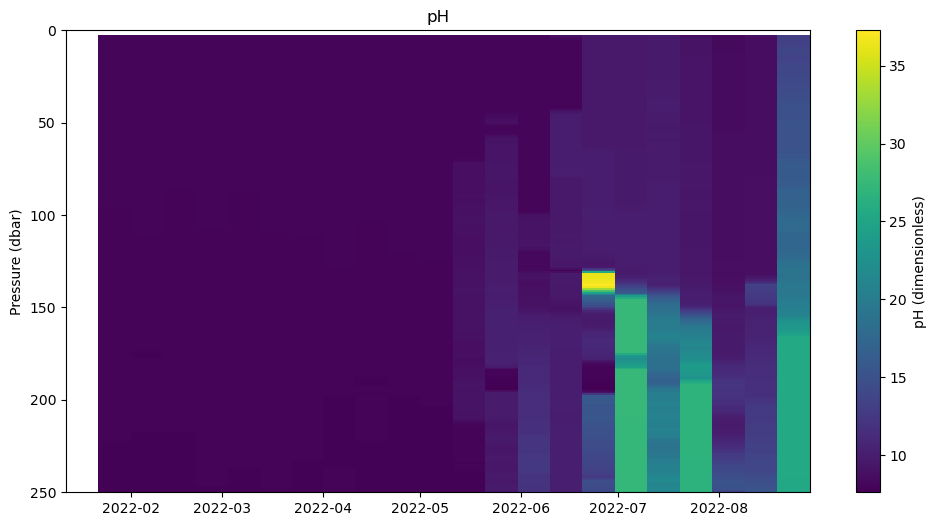

In [ ]:
data = argo_sprof_n
# Interpolate data
param_name = 'PH_IN_SITU_TOTAL_ADJUSTED'
time_coord, pres_coord, time_grid, pres_grid, param_gridded = interpolate_depth_section(param_name)

# Plot depth section of upper ocean only
plt.figure(figsize=(12,6))
plt.pcolormesh(time_grid,pres_grid,param_gridded)
plt.ylim([0,250])
plt.gca().invert_yaxis()
plt.ylabel('Pressure (dbar)')
plt.colorbar(label='{0} ({1})'.format(data[param_name].long_name,data[param_name].units))
plt.title(data[param_name].long_name);

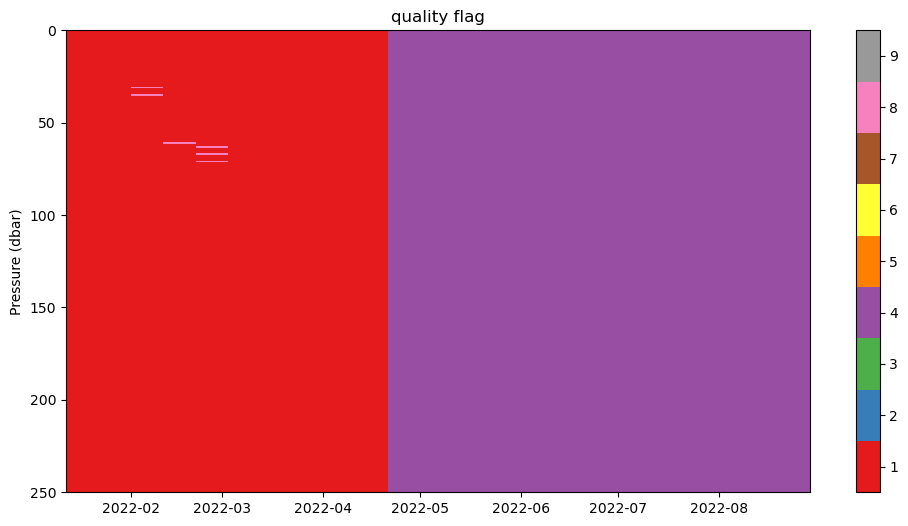

In [ ]:


# Interpolate data
param_name = 'PH_IN_SITU_TOTAL_ADJUSTED_QC'
time_coord, pres_coord, time_grid, pres_grid, param_gridded = interpolate_depth_section(param_name)

# Plot depth section of upper ocean only
plt.figure(figsize=(12,6))
plt.pcolormesh(time_grid,pres_grid,param_gridded,cmap='Set1',vmin=0.5,vmax=9.5)
plt.ylim([0,250])
plt.gca().invert_yaxis()
plt.ylabel('Pressure (dbar)')
plt.colorbar()
plt.title(data[param_name].long_name);
     


In [ ]:
# plotting pCO2 impacts for floats:
derivedlist = []
for file in os.listdir(argo_path_derived):
    if file.endswith('derived_3.nc'):
        derivedlist.append(file)

In [ ]:
pCO2_impact_np = np.array(pCO2_impact)
o2_offset_3 = np.array(o2_offset_3)

print(np.nanmin(pCO2_impact_np))
print(np.nanmax(pCO2_impact_np))

1.870103557566527
1.870103557566527


In [ ]:
pCO2

In [ ]:

msk = (pCO2_impact_np>-300) & (pCO2_impact_np<300)
pCO2_impact_np[msk]

array([], dtype=float64)

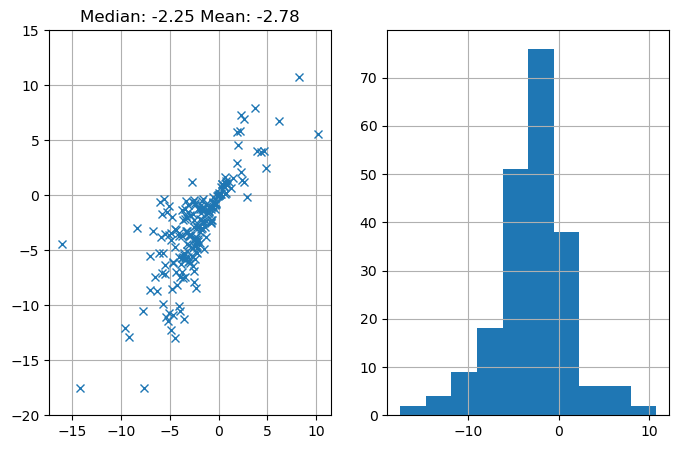

In [ ]:
plt.figure(figsize=(8,5))

plt.subplot(121)
plt.plot(o2_offset_3, pCO2_impact_np, marker = 'x', linestyle='None')
plt.ylim(-20,15)
plt.title('Median: ' + "%.2f" % np.nanmedian(pCO2_impact_np) + ' Mean: ' "%.2f" % np.nanmean(pCO2_impact_np))
plt.grid()
plt.subplot(122)
plt.hist(pCO2_impact_np)
plt.grid()

plt.savefig(output_dir_figs + 'float_pCO2_impact_no_mask.png')


In [ ]:
print(np.mean(glodap_offsets.DOXY_ADJUSTED_offset_trimmed))
print(np.nanmedian(glodap_offsets.DOXY_ADJUSTED_offset_trimmed))

plt.figure(figsize=(20,12))
plt.hist(glodap_offsets.DOXY_ADJUSTED_offset_trimmed, bins=np.linspace(-400, 400, 401))

plt.xlabel('DOXY Offset')
plt.savefig(output_dir_figs + 'Glodap_offsets_doxy_plus_minus_400.png')


NameError: name 'glodap_offsets' is not defined

Looking at impact of oxygen offsets on pH / pCO2 / Nitrate / DIC

In [ ]:
# load glodap_offsets with cal info:

glodap_offsets = xr.load_dataset(output_dir+'glodap_offsets_withcalibration.nc')

In [ ]:
#create meta groups based on calibration groups (air cal, no air cal, no cal)
g = glodap_offsets.o2_calib_group.copy(deep=True)
g = g.where(glodap_offsets.o2_calib_group == 'air cal','not air')
glodap_offsets['o2_calib_air'] = xr.where(glodap_offsets.o2_calib_group=='bad','no cal',g)

glodap_offsets['o2_calib_air_key'] = xr.where(glodap_offsets.o2_calib_air=='air cal',1,0)

glodap_offsets['o2_not_air_key'] = xr.where(glodap_offsets.o2_calib_air=='not air',-1,0)
glodap_offsets['o2_cal_key'] = glodap_offsets['o2_calib_air_key'] + glodap_offsets['o2_not_air_key']

wmo_means = glodap_offsets.groupby('main_float_wmo').mean(...)

In [ ]:
# new dataset of air_cal floats only
a = wmo_means.where(wmo_means.o2_cal_key>0.6, drop=True)

In [ ]:
# checking for inconsistencies in interpolated vs. derived lengths

pH_count = 0;
# load float files, use offset information to calculate impact 
for n in range(2,3): #range(0, len(a.main_float_wmo)):
    wmo_n = int(a.main_float_wmo[n].values)
    
    argo_derived_n = xr.load_dataset(argo_path+ 'derived/' + str(wmo_n) + '_derived.nc')

    print(str(n) + ': ' + str(a.main_float_wmo[n].values))

    print(argo_wmo[wmo_n].PRES_ADJUSTED.shape)
    print(argo_derived_n.PRES_ADJUSTED.shape)
    print(' ')
    

2: 1901362
(36, 951)
(18, 78)
 


In [ ]:
argo_derived_n.PRES_ADJUSTED[0,:]

<xarray.DataArray 'PRES_ADJUSTED' (N_LEVELS: 78)>
array([   6.7     ,   10.9     ,   15.9     ,   21.1     ,   25.900002,
         30.900002,   35.3     ,   40.7     ,   45.4     ,   50.4     ,
         60.3     ,   70.2     ,   80.2     ,   90.299995,  100.7     ,
        110.6     ,  120.2     ,  129.9     ,  140.      ,  150.5     ,
        189.59999 ,  200.8     ,  210.3     ,  220.5     ,  230.4     ,
        240.8     ,  250.09999 ,  260.      ,  270.      ,  280.6     ,
        290.7     ,  300.2     ,  310.6     ,  320.2     ,  330.      ,
        340.      ,  350.40002 ,  374.90002 ,  400.7     ,  425.30002 ,
        450.5     ,  475.      ,  500.6     ,  524.9     ,  550.      ,
        575.2     ,  600.5     ,  625.3     ,  650.3     ,  674.9     ,
        700.3     ,  750.8     ,  800.60004 ,  849.8     ,  900.10004 ,
        950.2     , 1000.60004 , 1049.7     , 1099.5     , 1150.      ,
       1200.      , 1250.7999  , 1300.      , 1349.8999  , 1400.      ,
       1450.2999  , 1500.2999  , 1549.8999  , 1600.1     , 1650.2     ,
       1700.2999  , 1750.3999  , 1800.3999  , 1850.2     , 1900.3999  ,
       1950.1     ,         nan,         nan], dtype=float32)
Dimensions without coordinates: N_LEVELS

In [ ]:
argo_wmo[wmo_n].TEMP_ADJUSTED[:,0]

<xarray.DataArray 'TEMP_ADJUSTED' (N_PROF: 36)>
array([5.958705, 6.061573, 5.986551, 6.152714, 5.939236, 6.016245, 6.049644,
       6.164514, 6.204602, 6.236   , 6.153162, 6.296157, 6.23022 , 6.24085 ,
       6.243927, 6.233834, 6.328376, 6.32239 , 5.958705, 6.061573, 5.986551,
       6.152714, 5.939236, 6.016245, 6.049644, 6.164514, 6.204602, 6.236   ,
       6.153162, 6.296157, 6.23022 , 6.24085 , 6.243927, 6.233834, 6.328376,
       6.32239 ])
Dimensions without coordinates: N_PROF

In [ ]:
LIPHR_path = liar_dir

pH_count = 0;
# load float files, use offset information to calculate impact 
for n in range(37,38): #range(0, len(a.main_float_wmo)):
    wmo_n = int(a.main_float_wmo[n].values)
    
    argo_derived_n = xr.load_dataset(argo_path+ 'derived/' + str(wmo_n) + '_derived.nc')

    # check if the float also has pH
    if 'PH_IN_SITU_TOTAL_ADJUSTED' in argo_derived_n.keys() and np.any(~np.isnan(argo_derived_n.PH_IN_SITU_TOTAL_ADJUSTED)):
        pH_count = pH_count+1
        print(str(n) + ': ' + str(a.main_float_wmo[n].values))

    else:
        continue
    
    nprof = argo_derived_n.LATITUDE.shape[0]

    #test_pH = np.empty(nprof, dtype=float)
    
    # initialize coordinate and measurement arrays
    Coordinates_all = np.empty([nprof, 3],dtype=float)
    Coordinates_all[:] = np.nan
       
    Measurements_all = np.empty([nprof, 4],dtype=float)
    Measurements_all[:] = np.nan
    
    MeasIDVec = [1, 7, 3, 6]
    for p in range(nprof):
        index_1500 = argo_wmo[wmo_n].PRES_ADJUSTED[p,:]==1500

        #argo_wmo[5904659].PSAL_ADJUSTED[0,index_1500]
        Coordinates_all[p,:] = np.stack((argo_wmo[wmo_n].LONGITUDE[p].values.flatten(), 
                            argo_wmo[wmo_n].LATITUDE[p].values.flatten(), 
                            argo_wmo[wmo_n].PRES_ADJUSTED[p,index_1500].values.flatten()),
                            axis=1)
        Measurements_all[p,:] = np.stack((argo_wmo[wmo_n].PSAL_ADJUSTED[p,index_1500].values.flatten(), 
                             argo_wmo[wmo_n].TEMP_ADJUSTED[p,index_1500].values.flatten(), 
                             argo_wmo[wmo_n].NITRATE_ADJUSTED[p,index_1500].values.flatten(), 
                             argo_wmo[wmo_n].DOXY_ADJUSTED[p,index_1500].values.flatten()),
                             axis=1)
    
    
    # calculate LIPHR pH for all profiles
    test_pH = carbon_utils.LIPHR_matlab(LIPHR_path,
                                    Coordinates_all.tolist(),
                                    Measurements_all.tolist(),
                                    MeasIDVec, 
                                    OAAdjustTF = False)  
       
    Measurements_o2_offset = np.concatenate(([Measurements_all[:,0]], 
                                  [Measurements_all[:,1]],
                                  [Measurements_all[:,2]],
                                  [Measurements_all[:,3]] + a.DOXY_ADJUSTED_offset_trimmed[n].values))
    Measurements_o2_offset = np.transpose(Measurements_o2_offset)
    # calculate LIPHR pH for all profiles
    new_pH = carbon_utils.LIPHR_matlab(LIPHR_path,
                                    Coordinates_all.tolist(),
                                    Measurements_o2_offset.tolist(),
                                    MeasIDVec, 
                                    OAAdjustTF = False)  
    argo_derived_n['pH_orig_LIPHR'] = (['N_PROF'],np.empty(argo_derived_n.PRES_ADJUSTED.shape[0])) #nprof x nlevel
    argo_derived_n.pH_orig_LIPHR[:] = test_pH[:,0]

    argo_derived_n['pH_O2_ADJUST_LIPHR'] = (['N_PROF'],np.empty(argo_derived_n.PRES_ADJUSTED.shape[0])) #nprof x nlevel
    argo_derived_n.pH_O2_ADJUST_LIPHR[:] = new_pH[:,0]
    # difference between pH_O2_orig_LIPHR and PH_IN_SITU_TOTAL_ADJUSTED- should that average 0? 
    # Impact of O2 can be seen in the test_pH minus new_pH average 
    
    argo_derived_n['PH_IN_SITU_TOTAL_ADJUSTED_w_O2_ADJUST_OFFSET'] = \
        argo_derived_n.PH_IN_SITU_TOTAL_ADJUSTED + np.mean(new_pH - test_pH)
    
    argo_derived_n.to_netcdf(argo_path+ 'derived/' + str(wmo_n) + '_derived_2.nc')


37: 5904659


In [ ]:
argo_wmo[5904659]

<xarray.Dataset>
Dimensions:                    (N_PROF: 153, N_LEVELS: 951)
Dimensions without coordinates: N_PROF, N_LEVELS
Data variables: (12/20)
    wmo                        (N_PROF) int64 5904659 5904659 ... 5904659
    profile                    (N_PROF) float64 ...
    juld                       (N_PROF) datetime64[ns] ...
    LATITUDE                   (N_PROF) float64 ...
    LONGITUDE                  (N_PROF) float64 ...
    num_var                    (N_PROF) float64 ...
    ...                         ...
    spice                      (N_PROF, N_LEVELS) float64 ...
    PRES_ADJUSTED              (N_PROF, N_LEVELS) float64 ...
    DIC                        (N_PROF, N_LEVELS) float64 ...
    TALK_LIAR                  (N_PROF, N_LEVELS) float64 ...
    pCO2                       (N_PROF, N_LEVELS) float64 ...
    pCO2_pH_corr               (N_PROF, N_LEVELS) float64 ...

In [ ]:
argo_derived_n

        #call CO2sys to calculate pCO2 with bias correction and no O2 correction (check against original)
        results = pyco2.sys(
                par1=argo_derived_n.TALK_LIAR, 
                par2=argo_derived_n.pH_insitu_corr,
                par1_type=1,
                par2_type=3,
                temperature=argo_n.TEMP_ADJUSTED, 
                pressure=argo_n.PRES_ADJUSTED, 
                salinity=argo_n.PSAL_ADJUSTED, 
                temperature_out=25.* np.ones(argo_n.PRES_ADJUSTED.shape), #fixed 25C temperature
                pressure_out=argo_n.PRES_ADJUSTED,
                total_silicate=SI,
                total_phosphate=PO4,
                opt_pH_scale = 1, #total
                opt_k_carbonic=10, #Lueker et al. 2000
                opt_k_bisulfate=1, # Dickson 1990 (Note, matlab co2sys combines KSO4 with TB. option 3 = KSO4 of Dickson & TB of Lee 2010)
                opt_total_borate=2, # Lee et al. 2010
                opt_k_fluoride=2, # Perez and Fraga 1987
                opt_buffers_mode=1,
                )

<xarray.Dataset>
Dimensions:                                       (N_PROF: 153, N_LEVELS: 558)
Dimensions without coordinates: N_PROF, N_LEVELS
Data variables: (12/22)
    wmo                                           int64 5904659
    CYCLE_NUMBER                                  (N_PROF) float64 1.0 ... 153.0
    LONGITUDE                                     (N_PROF) float64 -55.38 ......
    LATITUDE                                      (N_PROF) float64 -59.64 ......
    JULD_LOCATION                                 (N_PROF) datetime64[ns] 201...
    TEMP_ADJUSTED                                 (N_PROF, N_LEVELS) float32 ...
    ...                                            ...
    TALK_LIAR                                     (N_PROF, N_LEVELS) float64 ...
    pCO2                                          (N_PROF, N_LEVELS) float64 ...
    pCO2_pH_corr                                  (N_PROF, N_LEVELS) float64 ...
    pH_orig_LIPHR                                 (N_PROF) float64 7.88 ... 7...
    pH_O2_ADJUST_LIPHR                            (N_PROF) float64 7.875 ... ...
    PH_IN_SITU_TOTAL_ADJUSTED_w_O2_ADJUST_OFFSET  (N_PROF, N_LEVELS) float32 ...

-0.0036396733963356244

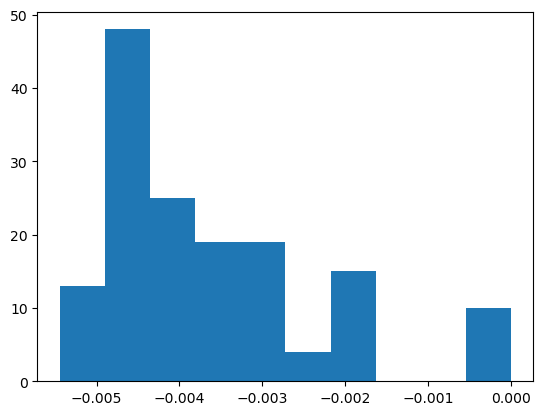

In [ ]:
test_pH - new_pH
plt.hist(new_pH - test_pH)
np.mean(new_pH - test_pH)

<xarray.DataArray 'PH_IN_SITU_TOTAL_ADJUSTED' ()>
array(0.00315701)

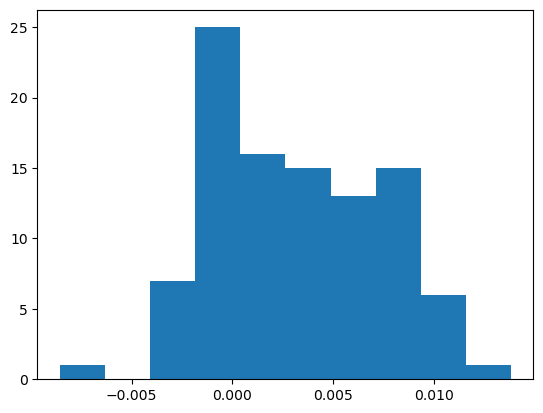

In [ ]:
plt.hist(argo_wmo[wmo_n].PH_IN_SITU_TOTAL_ADJUSTED[:,index_1500] - test_pH)
np.mean(argo_wmo[wmo_n].PH_IN_SITU_TOTAL_ADJUSTED[:,index_1500] - test_pH)